# Simplified-Workflow ver11

C:\Users\joshua.park\AppData\Local\Temp\ipykernel_1768\1306442969.py:83: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ..\torch\csrc\utils\tensor_new.cpp:248.)
  averaged_data = average_across_arrays(torch.tensor(training_data_open).detach())


IndexError: index 1 is out of bounds for axis 0 with size 1

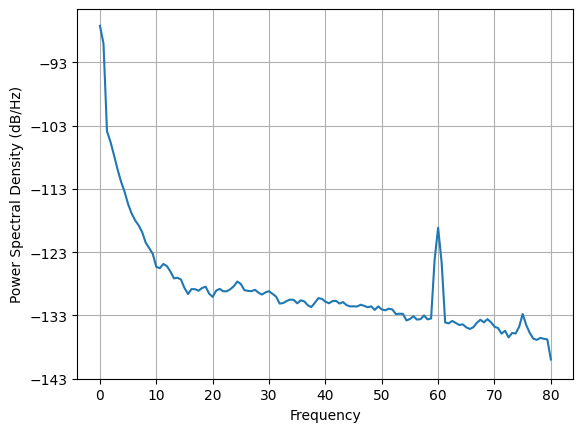

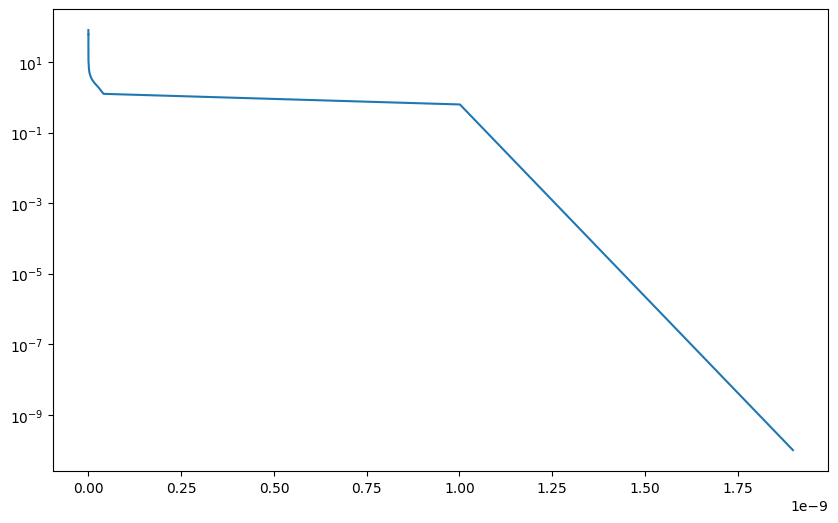

In [1]:
import mne
import numpy as np 
import matplotlib.pyplot as plt
import torch
import os
import sklearn
from sklearn.pipeline import Pipeline
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import ShuffleSplit, cross_val_score, train_test_split
from torch.utils.data import DataLoader, Dataset
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from sklearn.preprocessing import MinMaxScaler
from torch.utils.data import TensorDataset, DataLoader
import torch.nn.functional as F
from torch.fft import rfft, irfft
from torch.nn.functional import normalize
from scipy.signal import welch
from scipy import signal


eyes_open = np.load('training_open.npy')
eyes_closed = np.load('training_closed.npy')

training_data_open = []
training_data_closed = []

for i in range(len(eyes_open)):
    aux = []
    for ch in [21,22,23,27]:
        aux.append(eyes_open[i,ch,:])
    training_data_open.append(aux)

for i in range(len(eyes_closed)):
    aux = []
    for ch in [21,22,23,27]:
        aux.append(eyes_closed[i,ch,:])
    training_data_closed.append(aux)


eyes_open = None
eyes_closed = None

NUM_CHANNELS = 4
SEQUENCE_LENGTH = 9760
LAMBDA_GP = 5

def compute_psd(data, fs, nperseg=256, noverlap=None):
    """
    Compute Power Spectral Density (PSD) using the Welch method.

    Parameters:
        data (array): EEG data array with shape (n_channels, n_samples).
        fs (float): Sampling frequency.
        nperseg (int): Length of each segment for PSD estimation.
        noverlap (int): Number of overlapping samples between segments.
    
    Returns:
        freqs (array): Frequency values.
        psd (array): Power Spectral Density values.
    """
    n_channels, n_samples = data.shape
    psd = np.zeros((n_channels, nperseg // 2 + 1))

    for ch_idx in range(n_channels):
        f, Pxx = plt.psd(data[ch_idx], Fs=fs, NFFT=256, noverlap=128, window=np.hanning(256), scale_by_freq=True)
        # Add a small epsilon to avoid zero values
        psd[ch_idx] = Pxx + 1e-10

    return f, psd

def average_across_arrays(generated_data):
    return generated_data.mean(dim=0)

# Set the sampling frequency
fs = 160.0

## open data
averaged_data = average_across_arrays(torch.tensor(training_data_open).detach())
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(NUM_CHANNELS):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')

print("eyes open")
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()



## closed data
averaged_data = average_across_arrays(torch.tensor(training_data_closed).detach())
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(NUM_CHANNELS):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')

print("eyes closed")
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()


def weights_init(model):
    for m in model.modules():
      if isinstance(m, (nn.Conv1d, nn.ConvTranspose1d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)

# Gaussian normal distribution
def sample_normal_distribution(i, j, k):
    mu = 0
    sigma = 0.02
    return torch.Tensor(np.random.normal(mu, sigma, (i, j, k)))

def gradient_penalty(D, real, fake):
    alpha = torch.rand((BATCH_SIZE, 1, 1)).repeat(1, NUM_CHANNELS, SEQUENCE_LENGTH)
    interpolated_seq = real * alpha + fake * (1 - alpha)

    # Calculate discriminator scores
    mixed_scores = D(interpolated_seq)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_seq,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

def plot_everything(generated_data, gen_err, critic_err):
    generated_data = generated_data.detach()
    
    # plotting generated data
    values = generated_data[0, 0, :]
    plt.plot(values.tolist())
    plt.show()

    # plotting PSD
    averaged_data = average_across_arrays(generated_data)
    freqs, psd = compute_psd(averaged_data, fs)
    plt.figure(figsize=(10, 6))  # Add this line to create a single figure
    for ch_idx in range(NUM_CHANNELS):
        plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power/Frequency (dB/Hz)')
    plt.show()

    # plotting G vs D losses
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss During Training")
    plt.plot(gen_err,label="Generator")
    plt.plot(critic_err,label="Critic")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()
    

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, NUM_CHANNELS, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(NUM_CHANNELS, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(NUM_CHANNELS, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, NUM_CHANNELS, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

# PSD loss only

Epoch 0: Critic error ([5.2029758699789435]) Generator err ([0.040142182260751724])


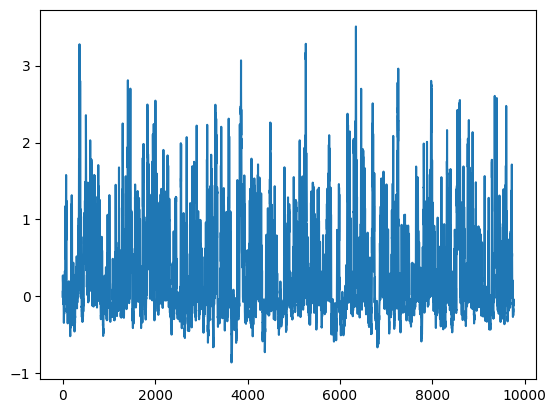

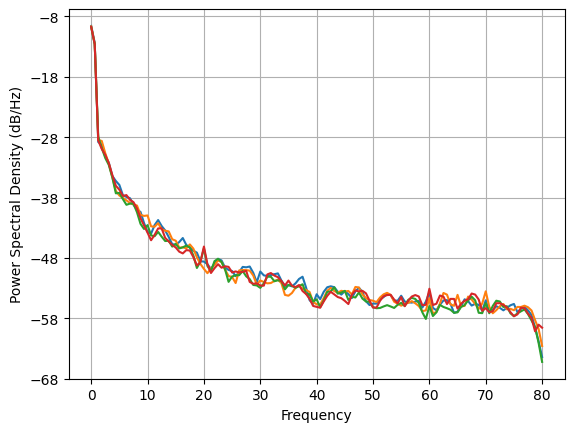

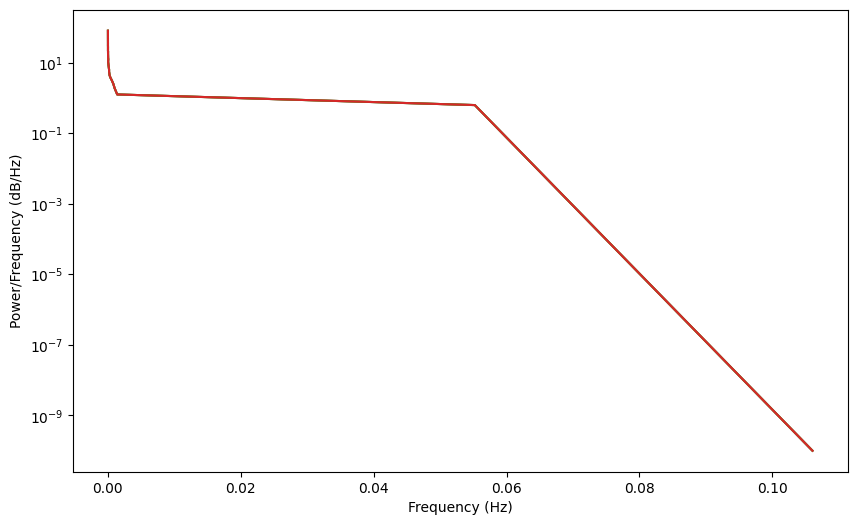

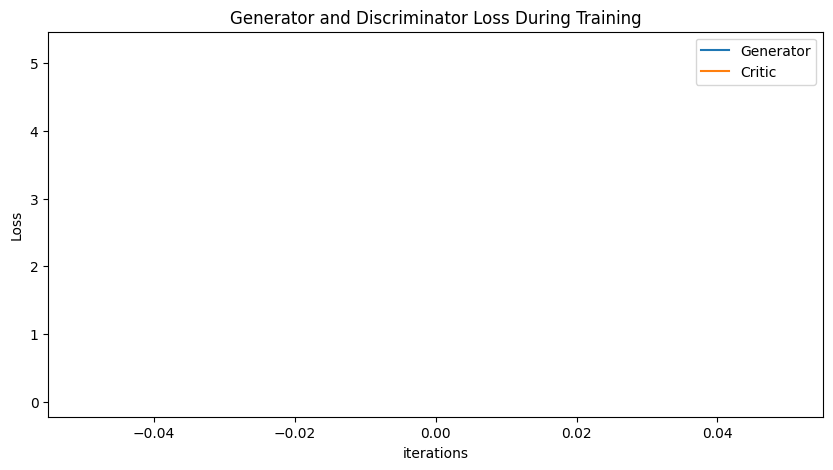

Epoch 10: Critic error ([5.2029758699789435, 5.157080505213027, 4.981214608466331, 4.565229046090716, 3.8587505128289963, 2.924853503125005, 2.167716499738731, 1.18236307607886, 1.21745392705383, 1.0476463287134763, 0.831244025366646]) Generator err ([0.040142182260751724, 0.03448588773608208, 0.017625439912080765, -0.022605592384934425, -0.11158102750778198, -0.2617364823818207, -0.5365484356880188, -0.6879944205284119, -0.8722020387649536, -1.0005489587783813, -1.165055274963379])


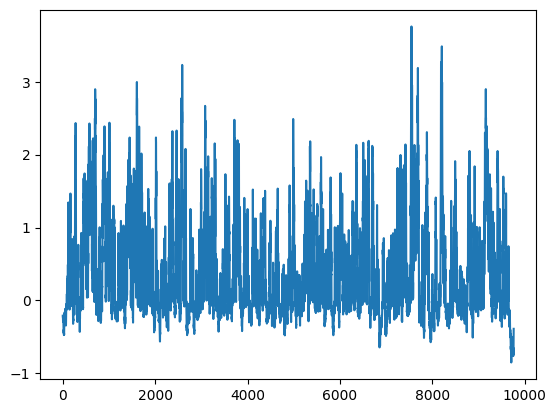

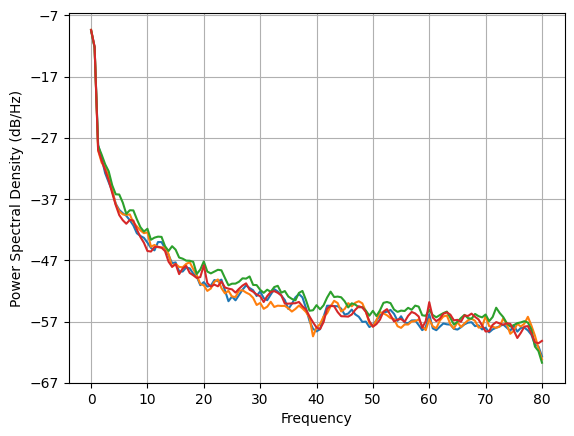

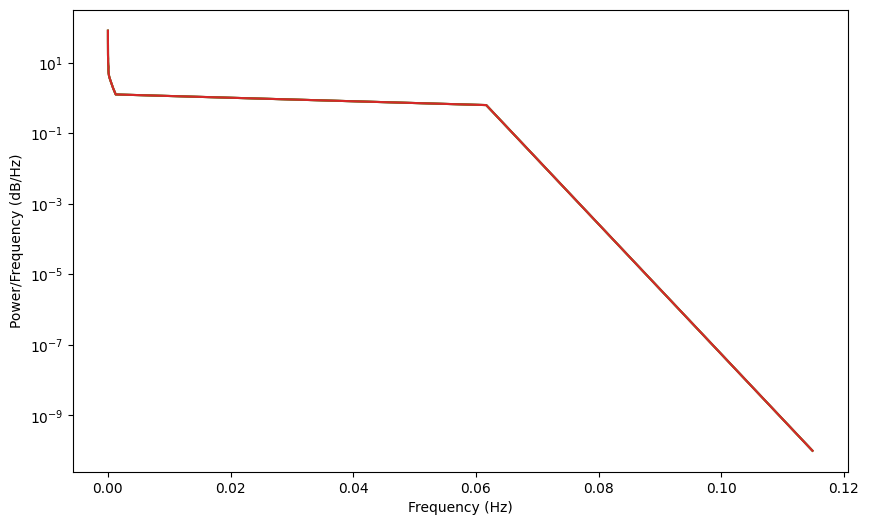

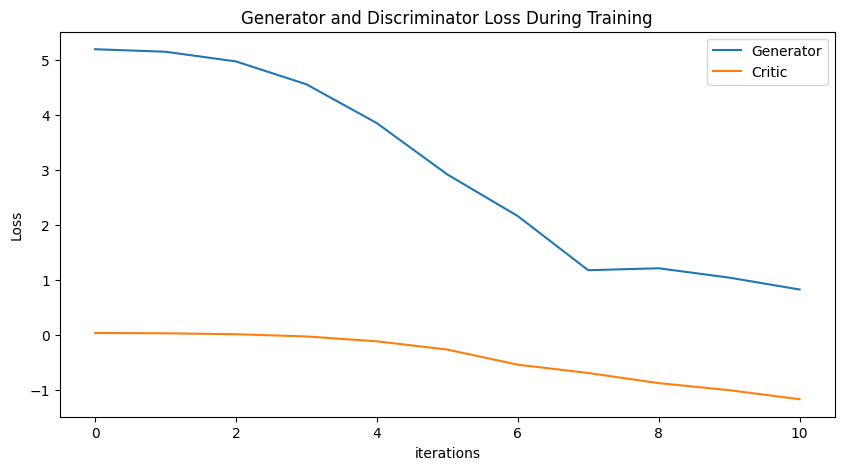

Epoch 20: Critic error ([5.2029758699789435, 5.157080505213027, 4.981214608466331, 4.565229046090716, 3.8587505128289963, 2.924853503125005, 2.167716499738731, 1.18236307607886, 1.21745392705383, 1.0476463287134763, 0.831244025366646, 0.8077893926015672, 0.6631527930261447, 0.7413225386118436, 0.5912606711701004, 0.5561260023639977, 0.5078742560418186, 0.47306033184730256, 0.42445329249889907, 0.40447990626535424, 0.3520996840425481]) Generator err ([0.040142182260751724, 0.03448588773608208, 0.017625439912080765, -0.022605592384934425, -0.11158102750778198, -0.2617364823818207, -0.5365484356880188, -0.6879944205284119, -0.8722020387649536, -1.0005489587783813, -1.165055274963379, -1.4715049266815186, -1.2838857173919678, -1.4159399271011353, -1.8116331100463867, -1.7539749145507812, -2.1691629886627197, -2.194092273712158, -1.972900390625, -2.371181011199951, -2.432337760925293])


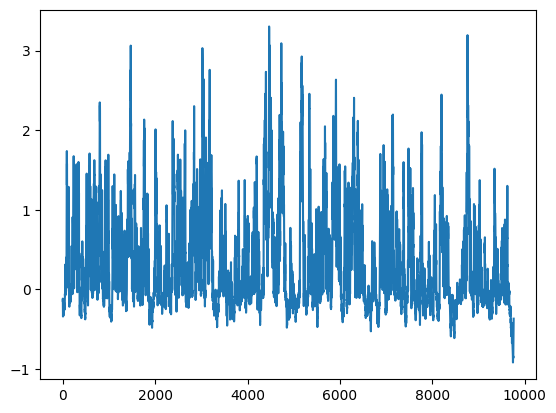

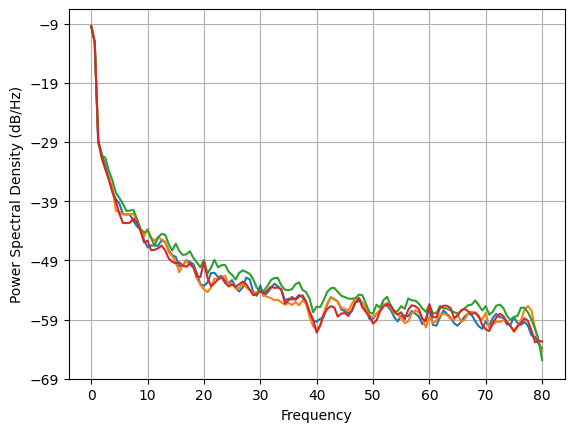

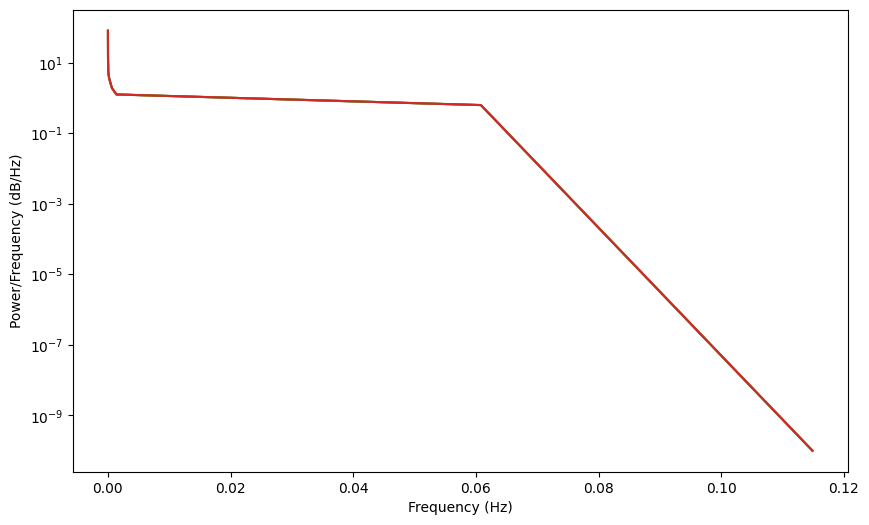

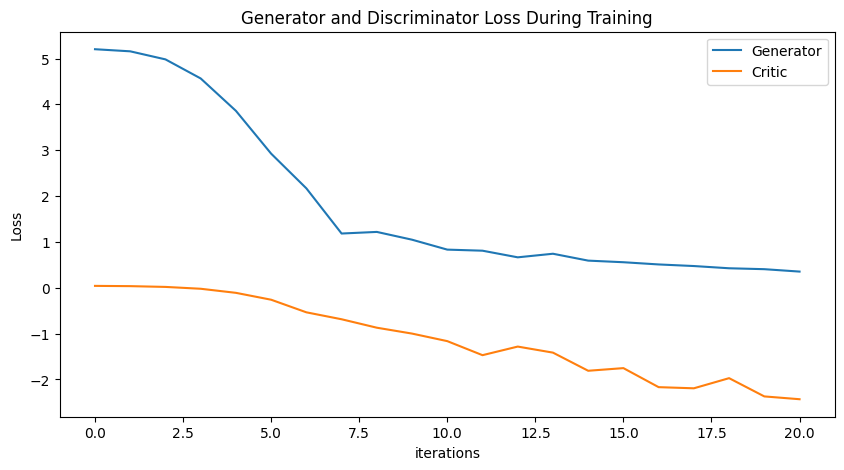

Epoch 30: Critic error ([5.2029758699789435, 5.157080505213027, 4.981214608466331, 4.565229046090716, 3.8587505128289963, 2.924853503125005, 2.167716499738731, 1.18236307607886, 1.21745392705383, 1.0476463287134763, 0.831244025366646, 0.8077893926015672, 0.6631527930261447, 0.7413225386118436, 0.5912606711701004, 0.5561260023639977, 0.5078742560418186, 0.47306033184730256, 0.42445329249889907, 0.40447990626535424, 0.3520996840425481, 0.3912986745649445, 0.31596291332712745, 0.344829157524987, 0.25894477493781765, 0.2753870139661455, 0.2716364594659329, 0.27013560470947695, 0.26396603294707127, 0.25659590881418404, 0.2401367879950463]) Generator err ([0.040142182260751724, 0.03448588773608208, 0.017625439912080765, -0.022605592384934425, -0.11158102750778198, -0.2617364823818207, -0.5365484356880188, -0.6879944205284119, -0.8722020387649536, -1.0005489587783813, -1.165055274963379, -1.4715049266815186, -1.2838857173919678, -1.4159399271011353, -1.8116331100463867, -1.7539749145507812, -

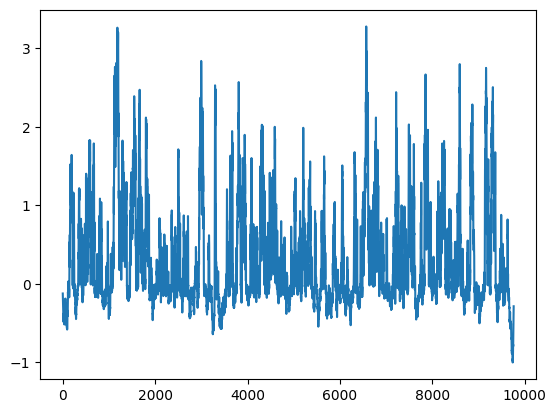

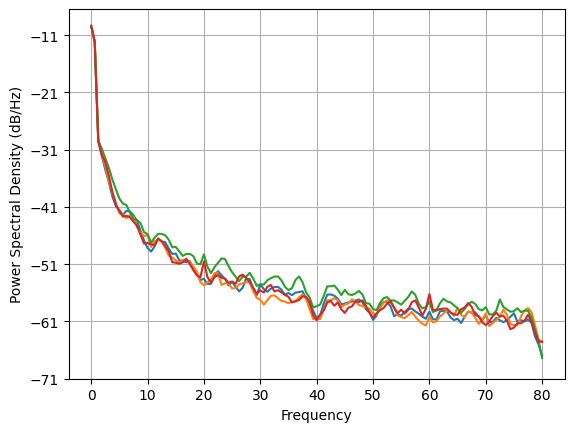

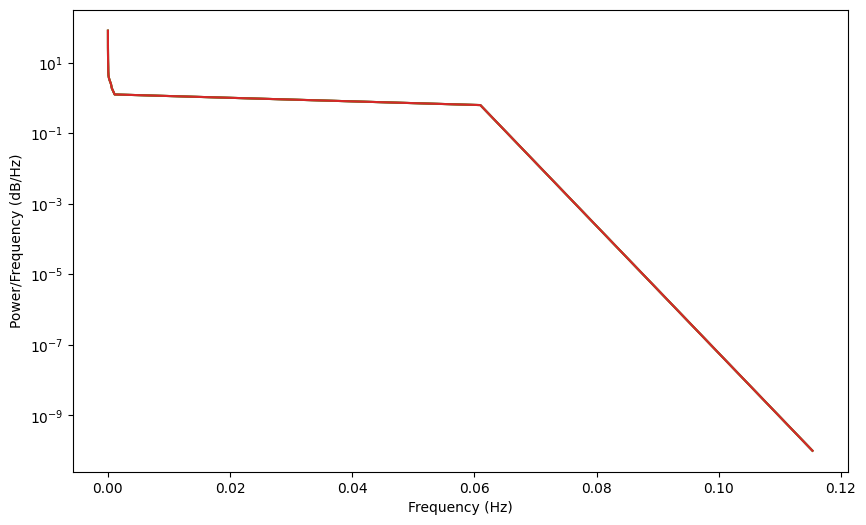

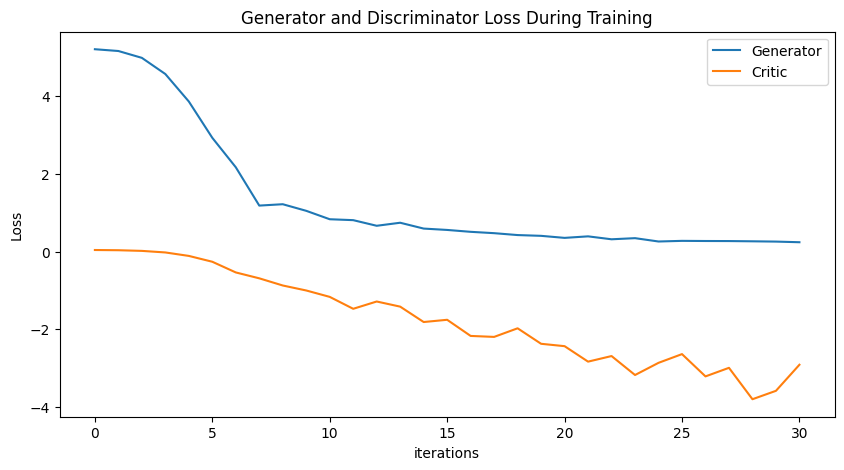

Epoch 40: Critic error ([5.2029758699789435, 5.157080505213027, 4.981214608466331, 4.565229046090716, 3.8587505128289963, 2.924853503125005, 2.167716499738731, 1.18236307607886, 1.21745392705383, 1.0476463287134763, 0.831244025366646, 0.8077893926015672, 0.6631527930261447, 0.7413225386118436, 0.5912606711701004, 0.5561260023639977, 0.5078742560418186, 0.47306033184730256, 0.42445329249889907, 0.40447990626535424, 0.3520996840425481, 0.3912986745649445, 0.31596291332712745, 0.344829157524987, 0.25894477493781765, 0.2753870139661455, 0.2716364594659329, 0.27013560470947695, 0.26396603294707127, 0.25659590881418404, 0.2401367879950463, 0.24672909237279422, 0.24021555245002704, 0.2537509307035082, 0.24231356859271408, 0.233579607503224, 0.2487463608273653, 0.24102881030301873, 0.24602730732635272, 0.2467362606236227, 0.2329399431850297]) Generator err ([0.040142182260751724, 0.03448588773608208, 0.017625439912080765, -0.022605592384934425, -0.11158102750778198, -0.2617364823818207, -0.536

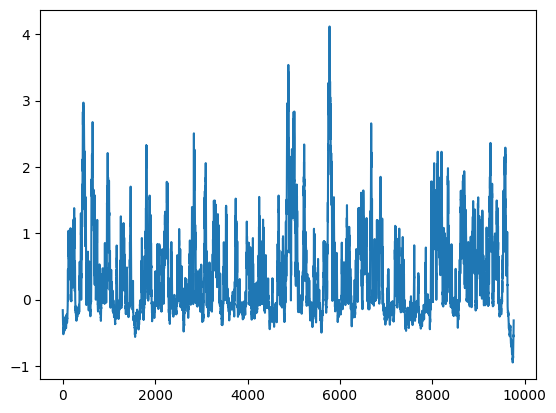

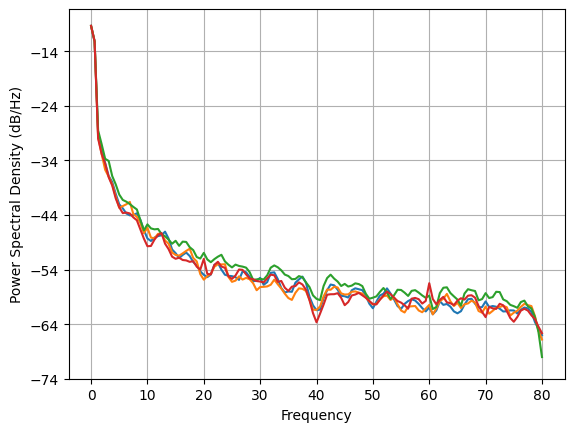

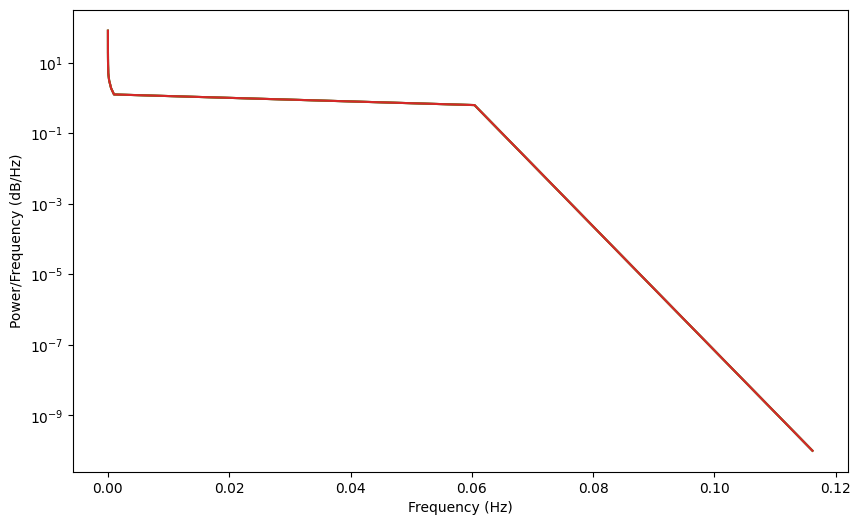

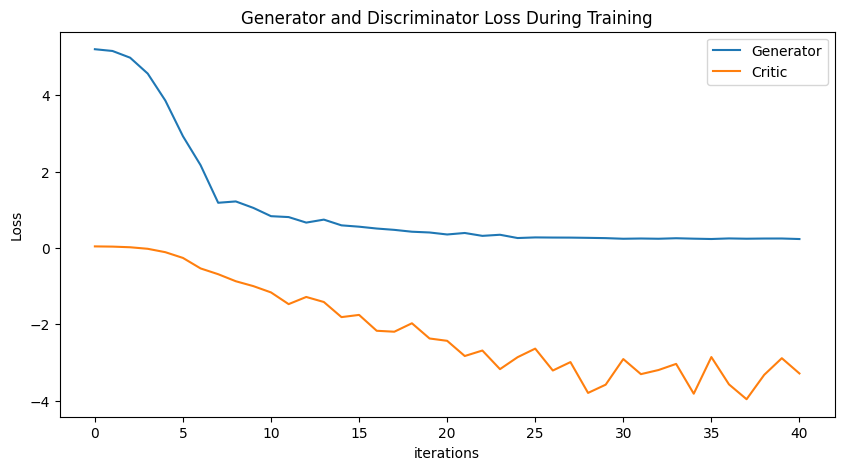

Epoch 50: Critic error ([5.2029758699789435, 5.157080505213027, 4.981214608466331, 4.565229046090716, 3.8587505128289963, 2.924853503125005, 2.167716499738731, 1.18236307607886, 1.21745392705383, 1.0476463287134763, 0.831244025366646, 0.8077893926015672, 0.6631527930261447, 0.7413225386118436, 0.5912606711701004, 0.5561260023639977, 0.5078742560418186, 0.47306033184730256, 0.42445329249889907, 0.40447990626535424, 0.3520996840425481, 0.3912986745649445, 0.31596291332712745, 0.344829157524987, 0.25894477493781765, 0.2753870139661455, 0.2716364594659329, 0.27013560470947695, 0.26396603294707127, 0.25659590881418404, 0.2401367879950463, 0.24672909237279422, 0.24021555245002704, 0.2537509307035082, 0.24231356859271408, 0.233579607503224, 0.2487463608273653, 0.24102881030301873, 0.24602730732635272, 0.2467362606236227, 0.2329399431850297, 0.23462530191176972, 0.24373311861217067, 0.2444754528633322, 0.23674483757000894, 0.2518274358534998, 0.24866165420216535, 0.23811611538909305, 0.2421749

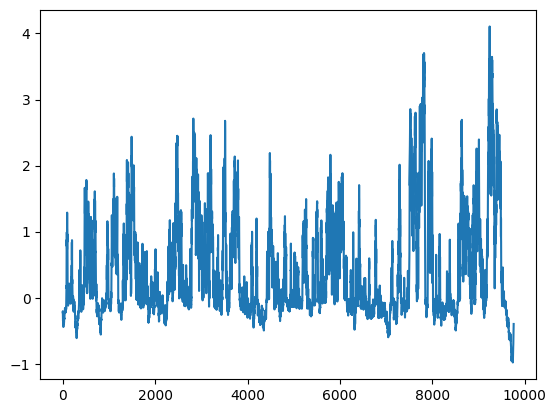

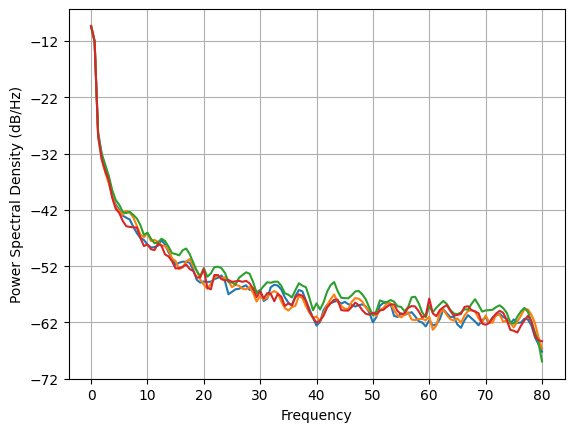

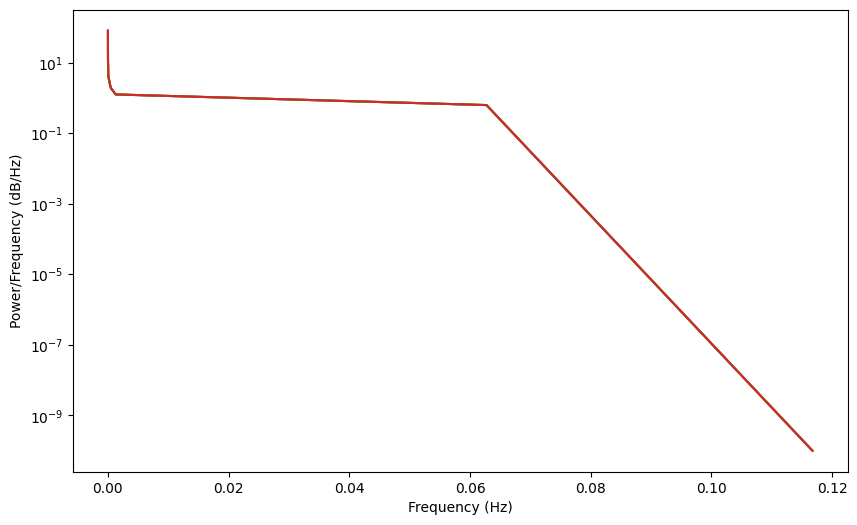

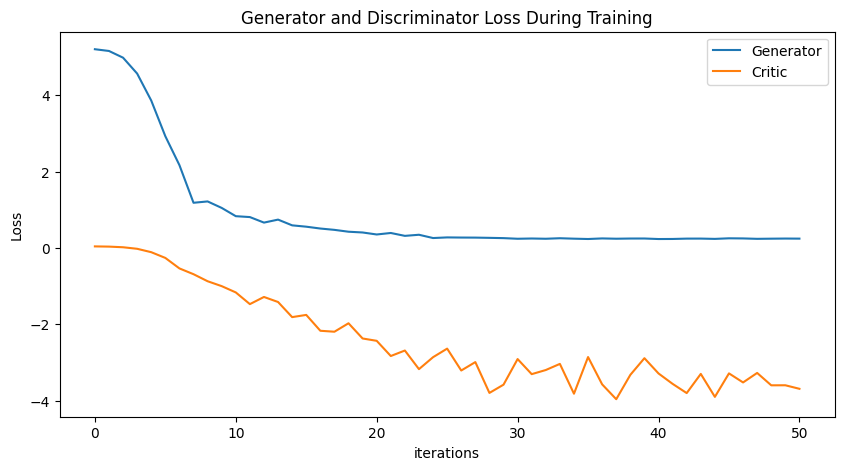

Epoch 60: Critic error ([5.2029758699789435, 5.157080505213027, 4.981214608466331, 4.565229046090716, 3.8587505128289963, 2.924853503125005, 2.167716499738731, 1.18236307607886, 1.21745392705383, 1.0476463287134763, 0.831244025366646, 0.8077893926015672, 0.6631527930261447, 0.7413225386118436, 0.5912606711701004, 0.5561260023639977, 0.5078742560418186, 0.47306033184730256, 0.42445329249889907, 0.40447990626535424, 0.3520996840425481, 0.3912986745649445, 0.31596291332712745, 0.344829157524987, 0.25894477493781765, 0.2753870139661455, 0.2716364594659329, 0.27013560470947695, 0.26396603294707127, 0.25659590881418404, 0.2401367879950463, 0.24672909237279422, 0.24021555245002704, 0.2537509307035082, 0.24231356859271408, 0.233579607503224, 0.2487463608273653, 0.24102881030301873, 0.24602730732635272, 0.2467362606236227, 0.2329399431850297, 0.23462530191176972, 0.24373311861217067, 0.2444754528633322, 0.23674483757000894, 0.2518274358534998, 0.24866165420216535, 0.23811611538909305, 0.2421749

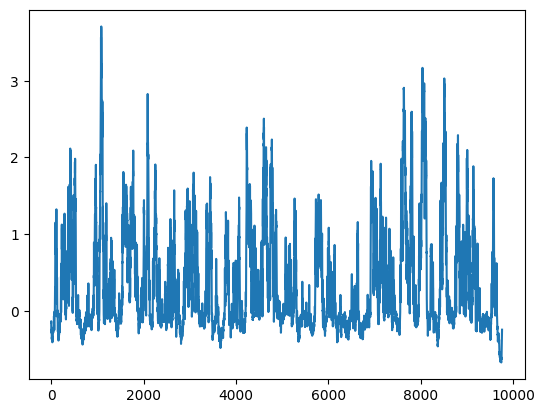

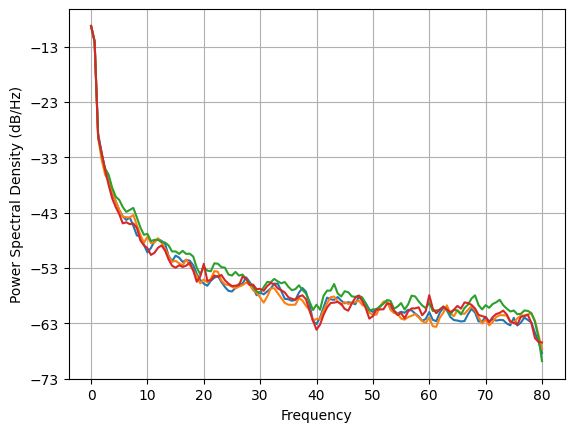

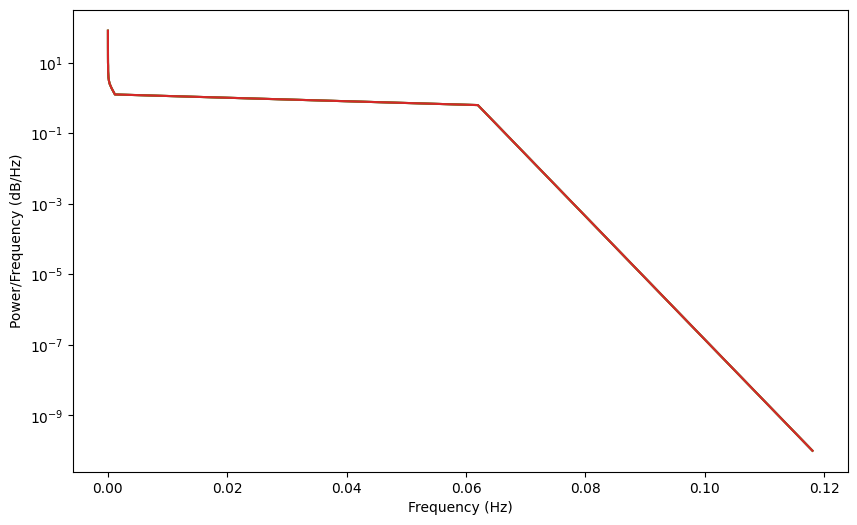

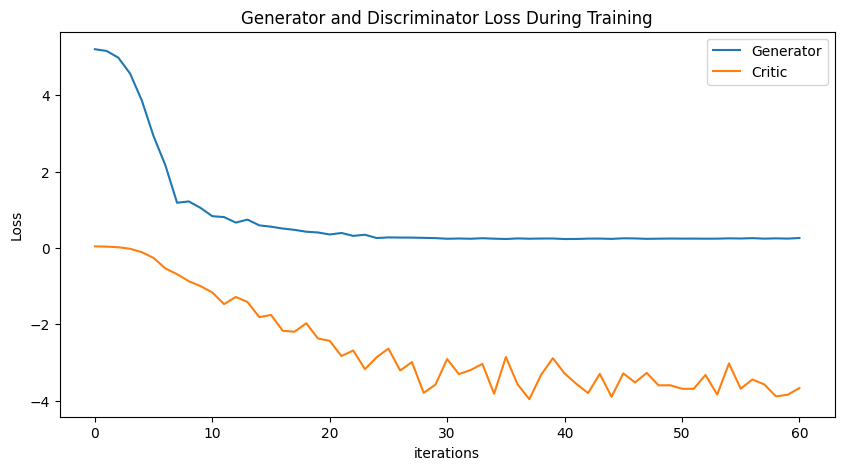

Epoch 70: Critic error ([5.2029758699789435, 5.157080505213027, 4.981214608466331, 4.565229046090716, 3.8587505128289963, 2.924853503125005, 2.167716499738731, 1.18236307607886, 1.21745392705383, 1.0476463287134763, 0.831244025366646, 0.8077893926015672, 0.6631527930261447, 0.7413225386118436, 0.5912606711701004, 0.5561260023639977, 0.5078742560418186, 0.47306033184730256, 0.42445329249889907, 0.40447990626535424, 0.3520996840425481, 0.3912986745649445, 0.31596291332712745, 0.344829157524987, 0.25894477493781765, 0.2753870139661455, 0.2716364594659329, 0.27013560470947695, 0.26396603294707127, 0.25659590881418404, 0.2401367879950463, 0.24672909237279422, 0.24021555245002704, 0.2537509307035082, 0.24231356859271408, 0.233579607503224, 0.2487463608273653, 0.24102881030301873, 0.24602730732635272, 0.2467362606236227, 0.2329399431850297, 0.23462530191176972, 0.24373311861217067, 0.2444754528633322, 0.23674483757000894, 0.2518274358534998, 0.24866165420216535, 0.23811611538909305, 0.2421749

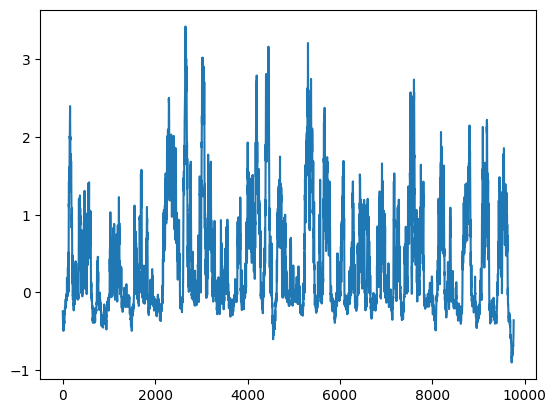

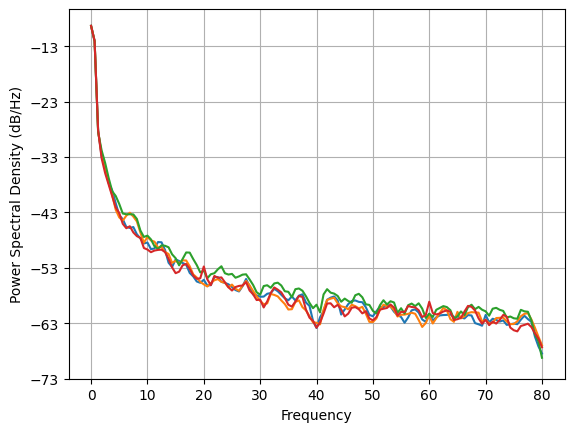

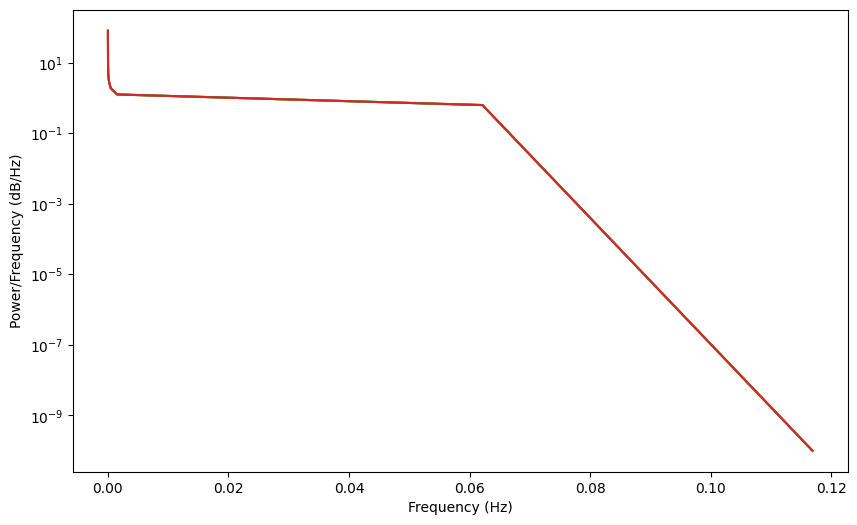

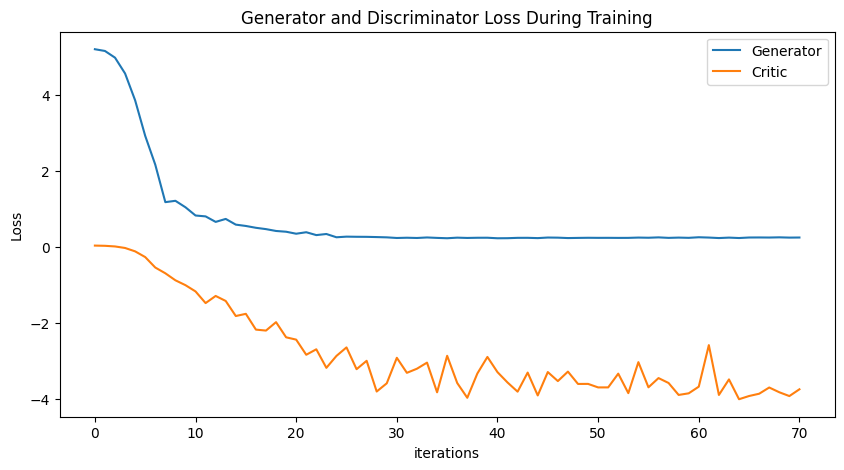

Epoch 80: Critic error ([5.2029758699789435, 5.157080505213027, 4.981214608466331, 4.565229046090716, 3.8587505128289963, 2.924853503125005, 2.167716499738731, 1.18236307607886, 1.21745392705383, 1.0476463287134763, 0.831244025366646, 0.8077893926015672, 0.6631527930261447, 0.7413225386118436, 0.5912606711701004, 0.5561260023639977, 0.5078742560418186, 0.47306033184730256, 0.42445329249889907, 0.40447990626535424, 0.3520996840425481, 0.3912986745649445, 0.31596291332712745, 0.344829157524987, 0.25894477493781765, 0.2753870139661455, 0.2716364594659329, 0.27013560470947695, 0.26396603294707127, 0.25659590881418404, 0.2401367879950463, 0.24672909237279422, 0.24021555245002704, 0.2537509307035082, 0.24231356859271408, 0.233579607503224, 0.2487463608273653, 0.24102881030301873, 0.24602730732635272, 0.2467362606236227, 0.2329399431850297, 0.23462530191176972, 0.24373311861217067, 0.2444754528633322, 0.23674483757000894, 0.2518274358534998, 0.24866165420216535, 0.23811611538909305, 0.2421749

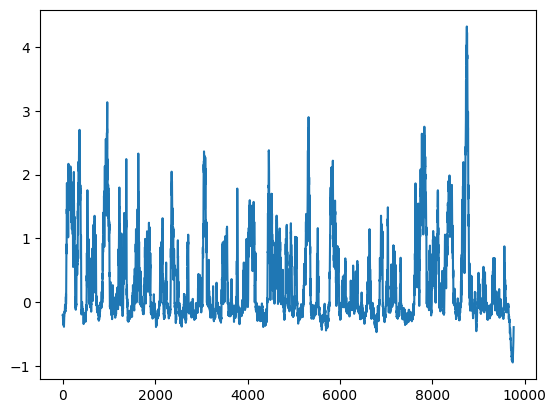

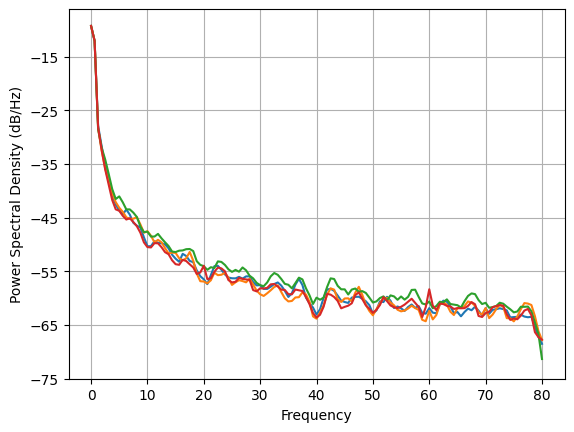

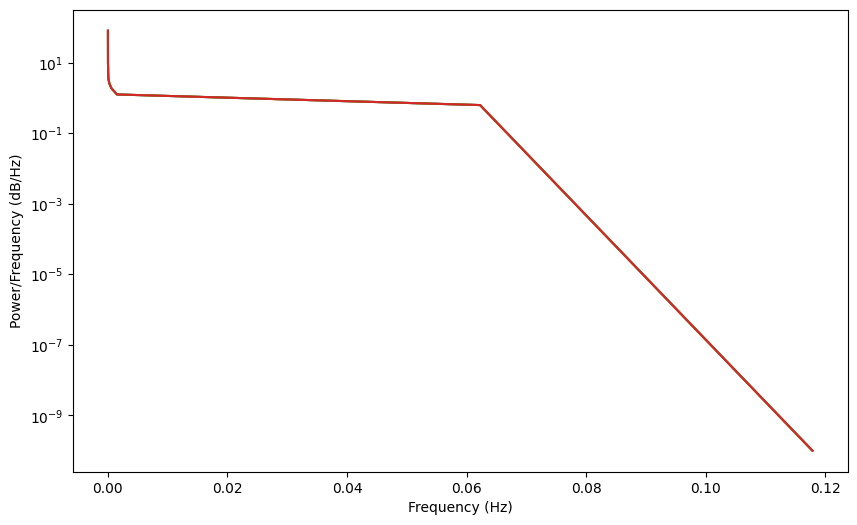

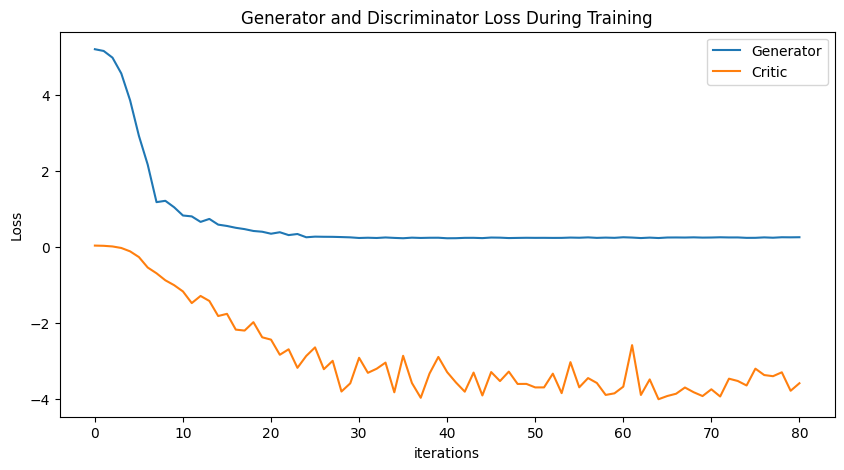

Epoch 90: Critic error ([5.2029758699789435, 5.157080505213027, 4.981214608466331, 4.565229046090716, 3.8587505128289963, 2.924853503125005, 2.167716499738731, 1.18236307607886, 1.21745392705383, 1.0476463287134763, 0.831244025366646, 0.8077893926015672, 0.6631527930261447, 0.7413225386118436, 0.5912606711701004, 0.5561260023639977, 0.5078742560418186, 0.47306033184730256, 0.42445329249889907, 0.40447990626535424, 0.3520996840425481, 0.3912986745649445, 0.31596291332712745, 0.344829157524987, 0.25894477493781765, 0.2753870139661455, 0.2716364594659329, 0.27013560470947695, 0.26396603294707127, 0.25659590881418404, 0.2401367879950463, 0.24672909237279422, 0.24021555245002704, 0.2537509307035082, 0.24231356859271408, 0.233579607503224, 0.2487463608273653, 0.24102881030301873, 0.24602730732635272, 0.2467362606236227, 0.2329399431850297, 0.23462530191176972, 0.24373311861217067, 0.2444754528633322, 0.23674483757000894, 0.2518274358534998, 0.24866165420216535, 0.23811611538909305, 0.2421749

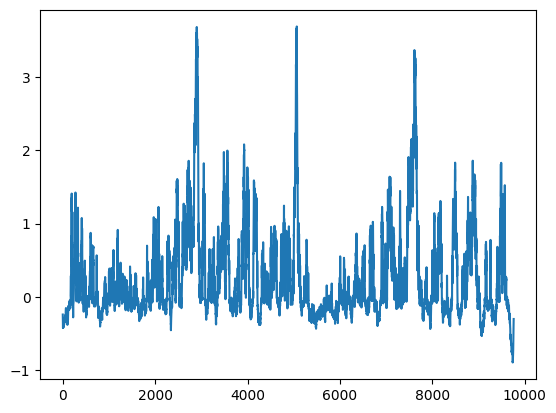

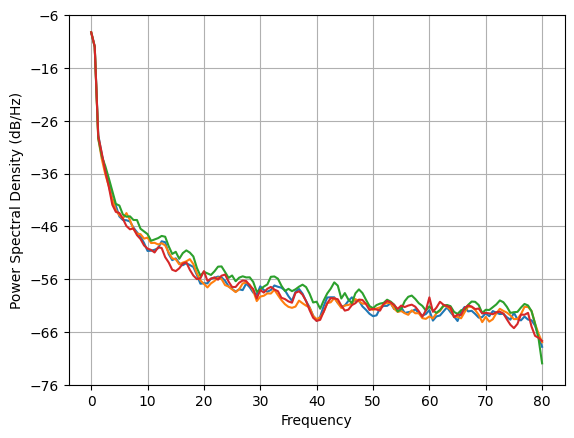

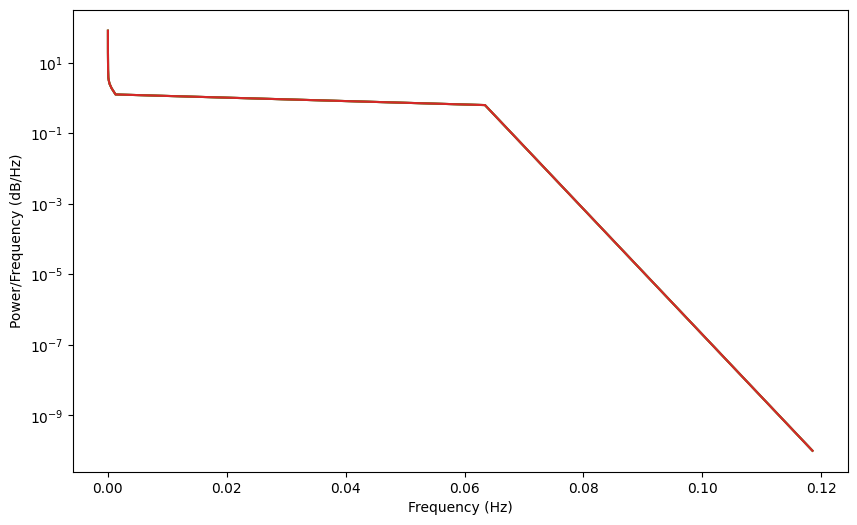

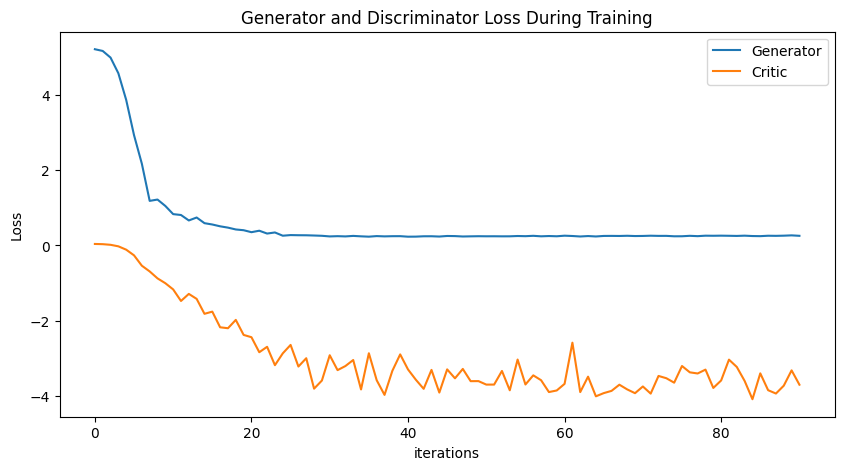

Epoch 100: Critic error ([5.2029758699789435, 5.157080505213027, 4.981214608466331, 4.565229046090716, 3.8587505128289963, 2.924853503125005, 2.167716499738731, 1.18236307607886, 1.21745392705383, 1.0476463287134763, 0.831244025366646, 0.8077893926015672, 0.6631527930261447, 0.7413225386118436, 0.5912606711701004, 0.5561260023639977, 0.5078742560418186, 0.47306033184730256, 0.42445329249889907, 0.40447990626535424, 0.3520996840425481, 0.3912986745649445, 0.31596291332712745, 0.344829157524987, 0.25894477493781765, 0.2753870139661455, 0.2716364594659329, 0.27013560470947695, 0.26396603294707127, 0.25659590881418404, 0.2401367879950463, 0.24672909237279422, 0.24021555245002704, 0.2537509307035082, 0.24231356859271408, 0.233579607503224, 0.2487463608273653, 0.24102881030301873, 0.24602730732635272, 0.2467362606236227, 0.2329399431850297, 0.23462530191176972, 0.24373311861217067, 0.2444754528633322, 0.23674483757000894, 0.2518274358534998, 0.24866165420216535, 0.23811611538909305, 0.242174

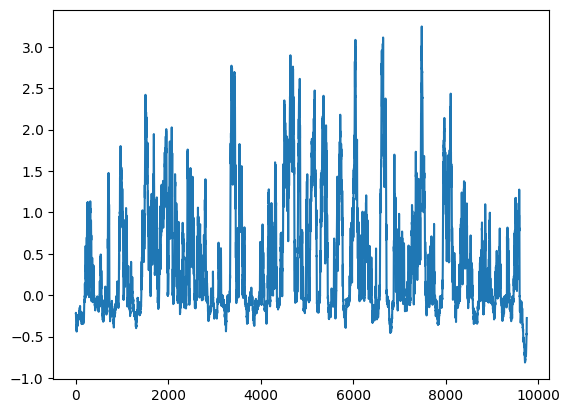

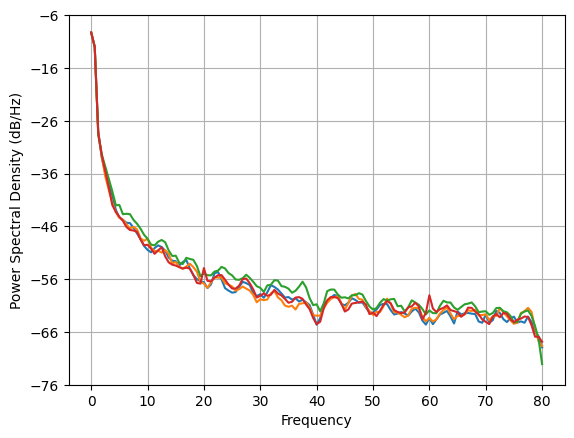

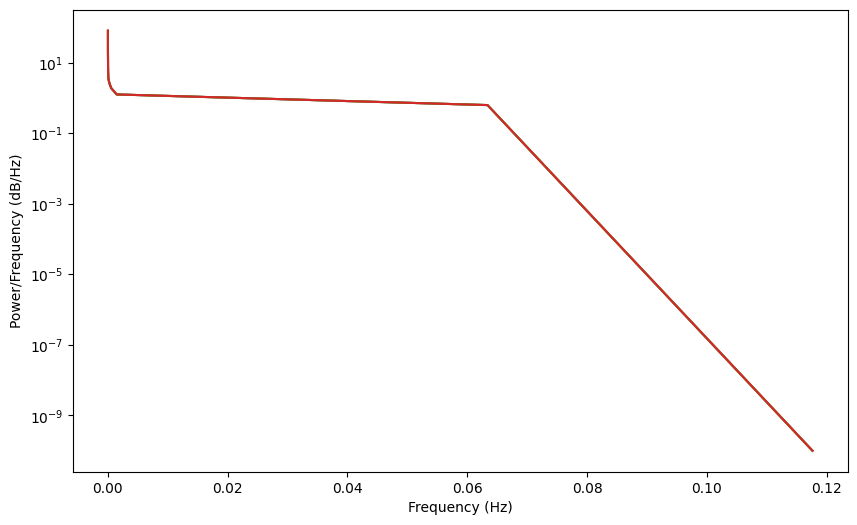

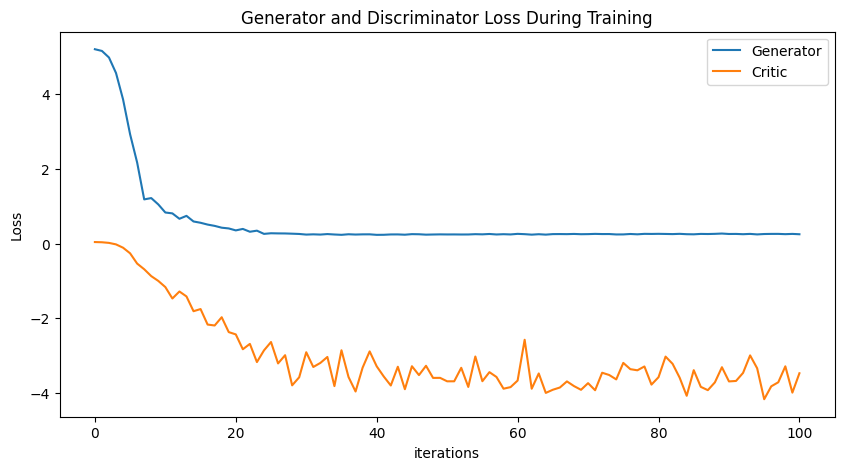

Epoch 110: Critic error ([5.2029758699789435, 5.157080505213027, 4.981214608466331, 4.565229046090716, 3.8587505128289963, 2.924853503125005, 2.167716499738731, 1.18236307607886, 1.21745392705383, 1.0476463287134763, 0.831244025366646, 0.8077893926015672, 0.6631527930261447, 0.7413225386118436, 0.5912606711701004, 0.5561260023639977, 0.5078742560418186, 0.47306033184730256, 0.42445329249889907, 0.40447990626535424, 0.3520996840425481, 0.3912986745649445, 0.31596291332712745, 0.344829157524987, 0.25894477493781765, 0.2753870139661455, 0.2716364594659329, 0.27013560470947695, 0.26396603294707127, 0.25659590881418404, 0.2401367879950463, 0.24672909237279422, 0.24021555245002704, 0.2537509307035082, 0.24231356859271408, 0.233579607503224, 0.2487463608273653, 0.24102881030301873, 0.24602730732635272, 0.2467362606236227, 0.2329399431850297, 0.23462530191176972, 0.24373311861217067, 0.2444754528633322, 0.23674483757000894, 0.2518274358534998, 0.24866165420216535, 0.23811611538909305, 0.242174

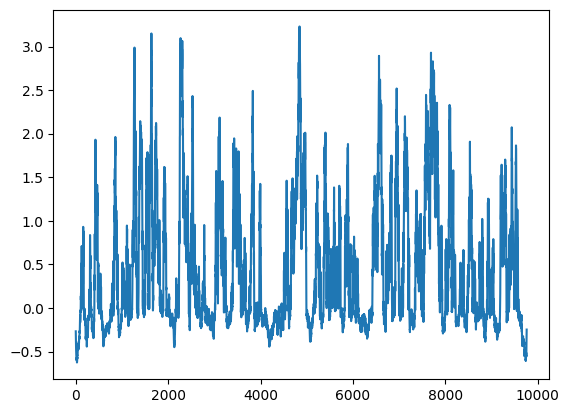

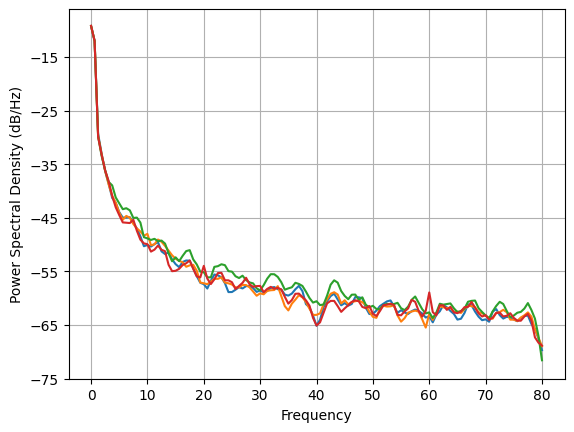

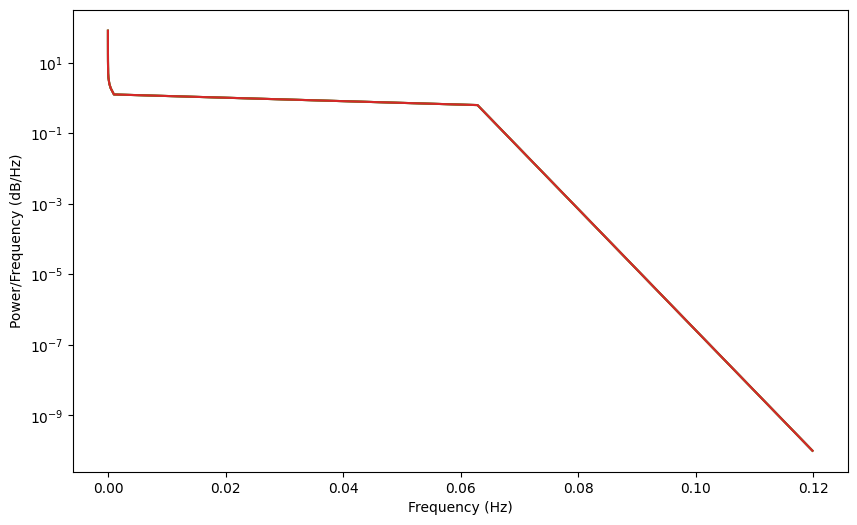

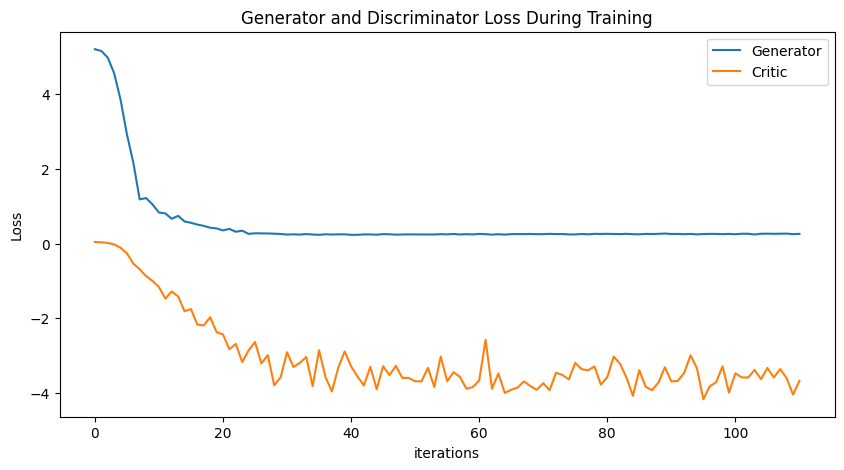

Epoch 120: Critic error ([5.2029758699789435, 5.157080505213027, 4.981214608466331, 4.565229046090716, 3.8587505128289963, 2.924853503125005, 2.167716499738731, 1.18236307607886, 1.21745392705383, 1.0476463287134763, 0.831244025366646, 0.8077893926015672, 0.6631527930261447, 0.7413225386118436, 0.5912606711701004, 0.5561260023639977, 0.5078742560418186, 0.47306033184730256, 0.42445329249889907, 0.40447990626535424, 0.3520996840425481, 0.3912986745649445, 0.31596291332712745, 0.344829157524987, 0.25894477493781765, 0.2753870139661455, 0.2716364594659329, 0.27013560470947695, 0.26396603294707127, 0.25659590881418404, 0.2401367879950463, 0.24672909237279422, 0.24021555245002704, 0.2537509307035082, 0.24231356859271408, 0.233579607503224, 0.2487463608273653, 0.24102881030301873, 0.24602730732635272, 0.2467362606236227, 0.2329399431850297, 0.23462530191176972, 0.24373311861217067, 0.2444754528633322, 0.23674483757000894, 0.2518274358534998, 0.24866165420216535, 0.23811611538909305, 0.242174

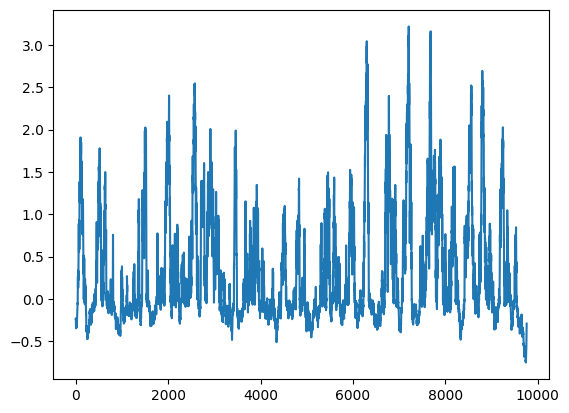

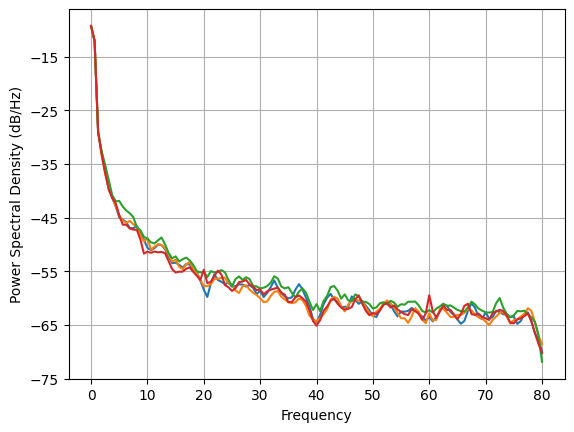

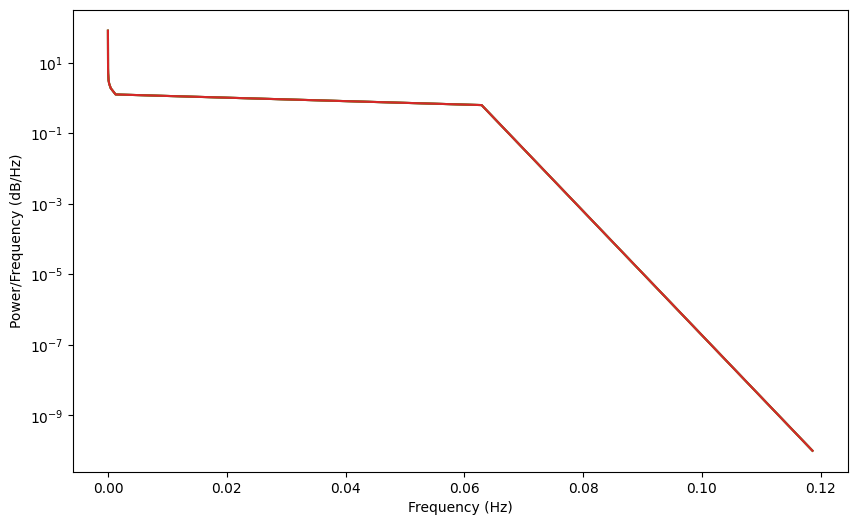

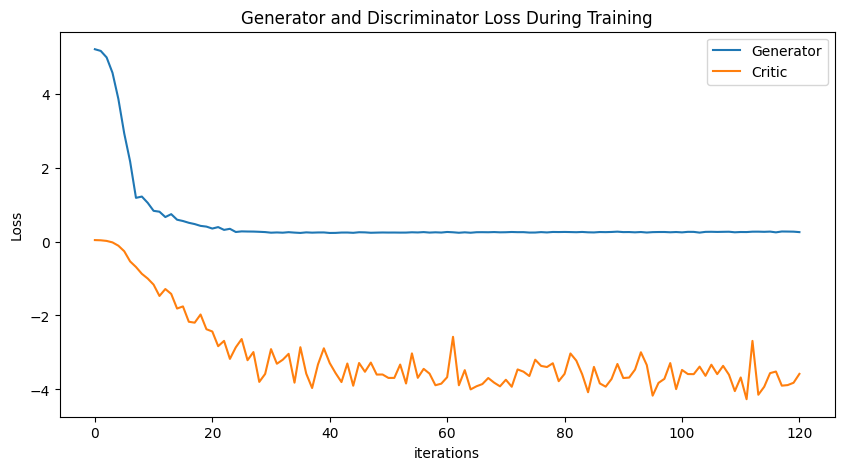

Epoch 130: Critic error ([5.2029758699789435, 5.157080505213027, 4.981214608466331, 4.565229046090716, 3.8587505128289963, 2.924853503125005, 2.167716499738731, 1.18236307607886, 1.21745392705383, 1.0476463287134763, 0.831244025366646, 0.8077893926015672, 0.6631527930261447, 0.7413225386118436, 0.5912606711701004, 0.5561260023639977, 0.5078742560418186, 0.47306033184730256, 0.42445329249889907, 0.40447990626535424, 0.3520996840425481, 0.3912986745649445, 0.31596291332712745, 0.344829157524987, 0.25894477493781765, 0.2753870139661455, 0.2716364594659329, 0.27013560470947695, 0.26396603294707127, 0.25659590881418404, 0.2401367879950463, 0.24672909237279422, 0.24021555245002704, 0.2537509307035082, 0.24231356859271408, 0.233579607503224, 0.2487463608273653, 0.24102881030301873, 0.24602730732635272, 0.2467362606236227, 0.2329399431850297, 0.23462530191176972, 0.24373311861217067, 0.2444754528633322, 0.23674483757000894, 0.2518274358534998, 0.24866165420216535, 0.23811611538909305, 0.242174

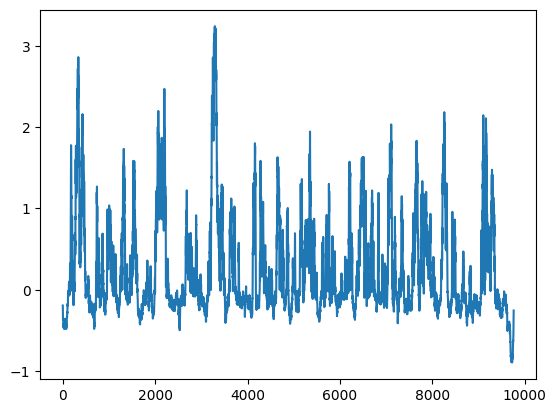

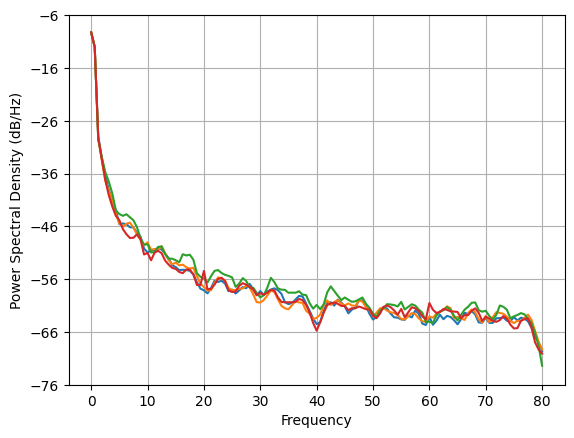

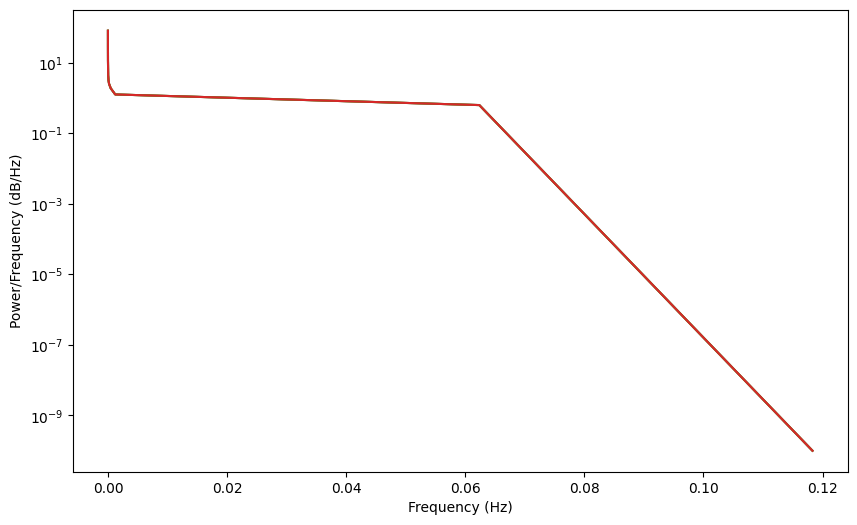

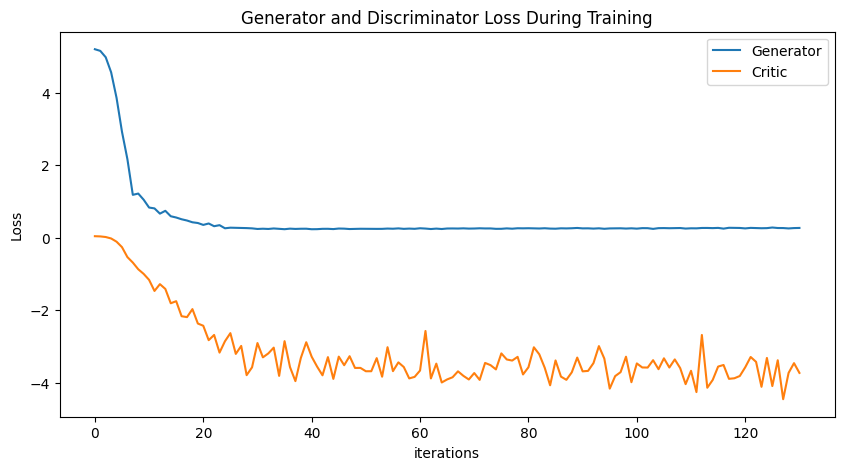

Epoch 140: Critic error ([5.2029758699789435, 5.157080505213027, 4.981214608466331, 4.565229046090716, 3.8587505128289963, 2.924853503125005, 2.167716499738731, 1.18236307607886, 1.21745392705383, 1.0476463287134763, 0.831244025366646, 0.8077893926015672, 0.6631527930261447, 0.7413225386118436, 0.5912606711701004, 0.5561260023639977, 0.5078742560418186, 0.47306033184730256, 0.42445329249889907, 0.40447990626535424, 0.3520996840425481, 0.3912986745649445, 0.31596291332712745, 0.344829157524987, 0.25894477493781765, 0.2753870139661455, 0.2716364594659329, 0.27013560470947695, 0.26396603294707127, 0.25659590881418404, 0.2401367879950463, 0.24672909237279422, 0.24021555245002704, 0.2537509307035082, 0.24231356859271408, 0.233579607503224, 0.2487463608273653, 0.24102881030301873, 0.24602730732635272, 0.2467362606236227, 0.2329399431850297, 0.23462530191176972, 0.24373311861217067, 0.2444754528633322, 0.23674483757000894, 0.2518274358534998, 0.24866165420216535, 0.23811611538909305, 0.242174

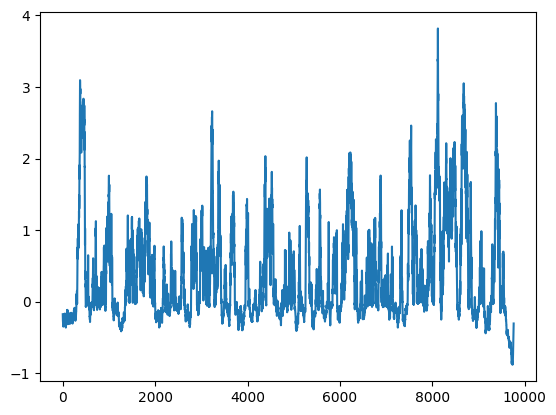

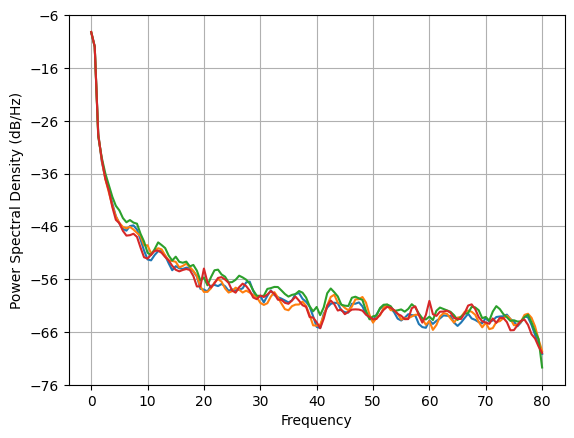

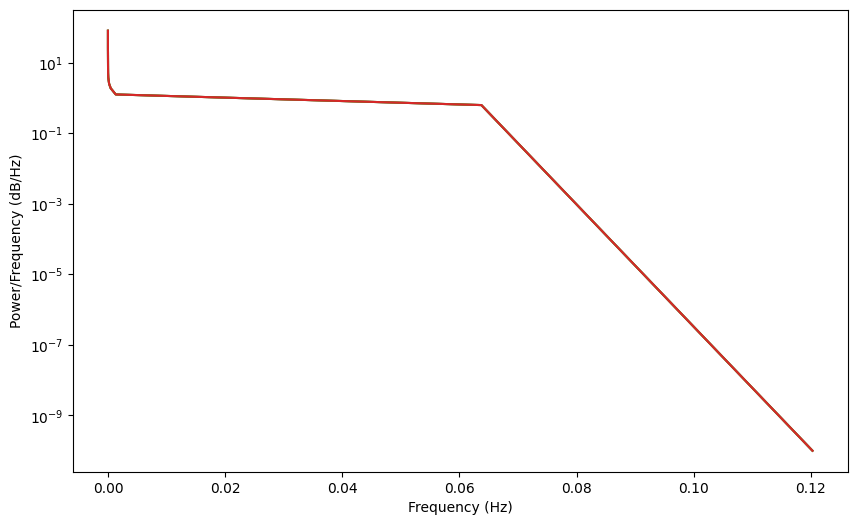

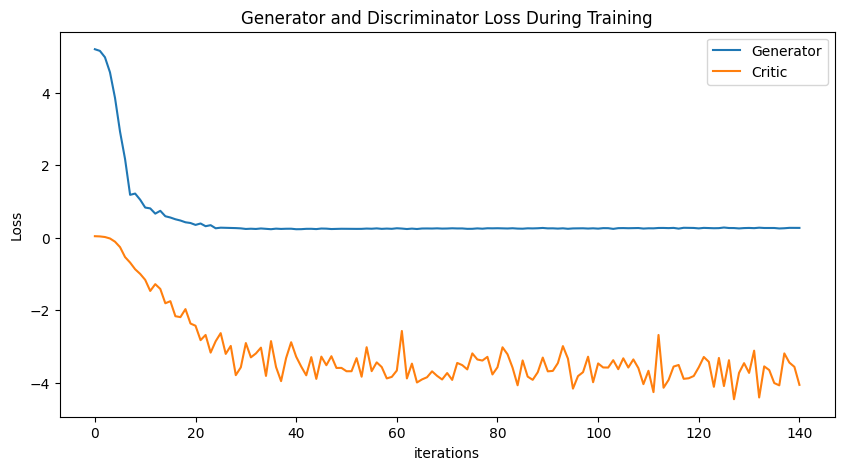

Epoch 150: Critic error ([5.2029758699789435, 5.157080505213027, 4.981214608466331, 4.565229046090716, 3.8587505128289963, 2.924853503125005, 2.167716499738731, 1.18236307607886, 1.21745392705383, 1.0476463287134763, 0.831244025366646, 0.8077893926015672, 0.6631527930261447, 0.7413225386118436, 0.5912606711701004, 0.5561260023639977, 0.5078742560418186, 0.47306033184730256, 0.42445329249889907, 0.40447990626535424, 0.3520996840425481, 0.3912986745649445, 0.31596291332712745, 0.344829157524987, 0.25894477493781765, 0.2753870139661455, 0.2716364594659329, 0.27013560470947695, 0.26396603294707127, 0.25659590881418404, 0.2401367879950463, 0.24672909237279422, 0.24021555245002704, 0.2537509307035082, 0.24231356859271408, 0.233579607503224, 0.2487463608273653, 0.24102881030301873, 0.24602730732635272, 0.2467362606236227, 0.2329399431850297, 0.23462530191176972, 0.24373311861217067, 0.2444754528633322, 0.23674483757000894, 0.2518274358534998, 0.24866165420216535, 0.23811611538909305, 0.242174

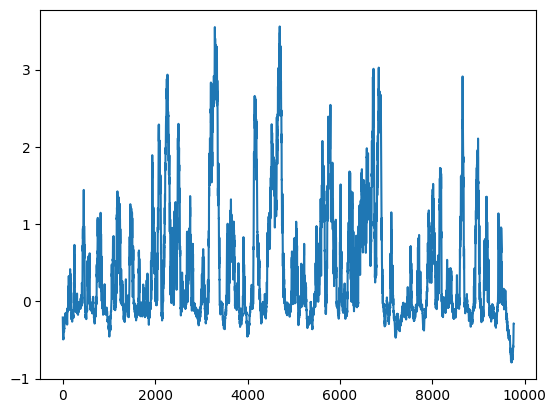

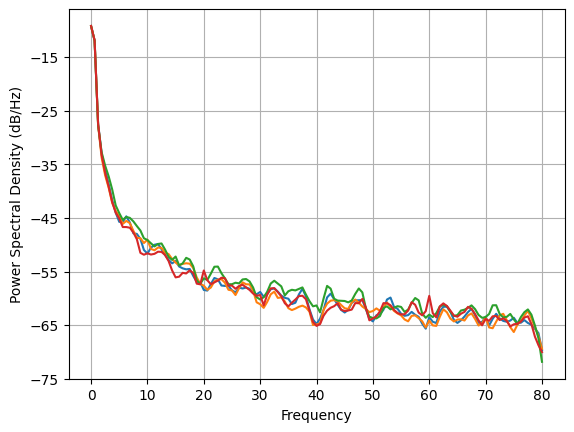

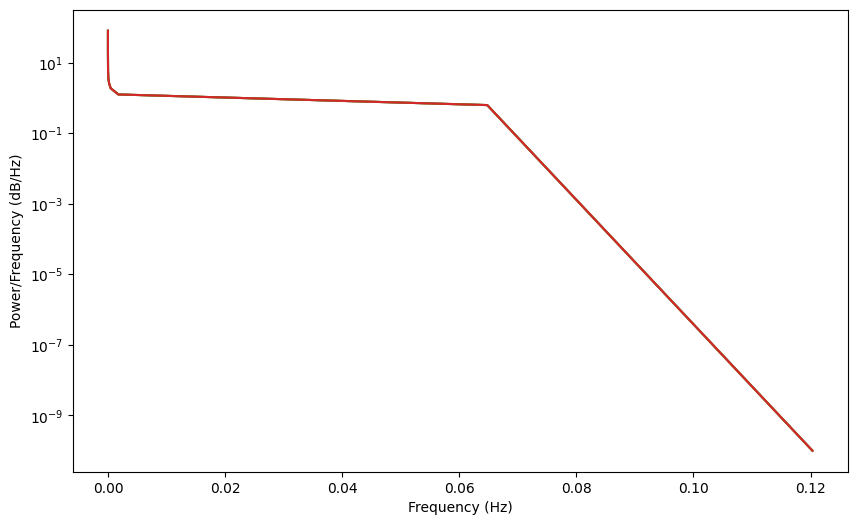

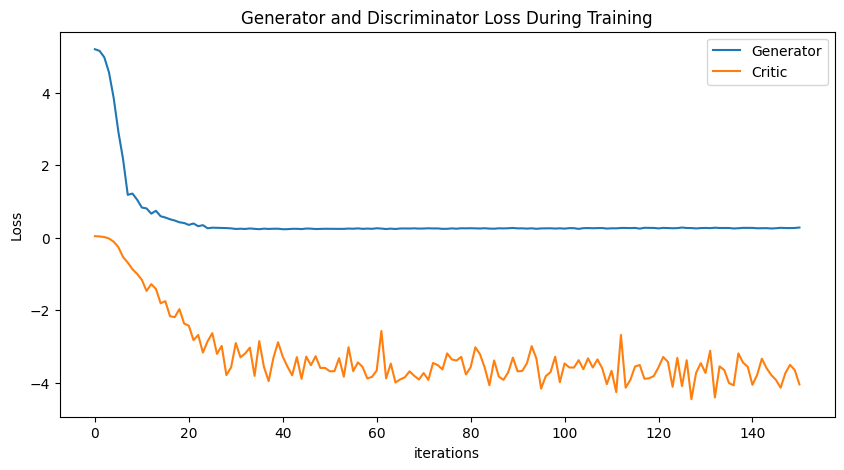

Epoch 160: Critic error ([5.2029758699789435, 5.157080505213027, 4.981214608466331, 4.565229046090716, 3.8587505128289963, 2.924853503125005, 2.167716499738731, 1.18236307607886, 1.21745392705383, 1.0476463287134763, 0.831244025366646, 0.8077893926015672, 0.6631527930261447, 0.7413225386118436, 0.5912606711701004, 0.5561260023639977, 0.5078742560418186, 0.47306033184730256, 0.42445329249889907, 0.40447990626535424, 0.3520996840425481, 0.3912986745649445, 0.31596291332712745, 0.344829157524987, 0.25894477493781765, 0.2753870139661455, 0.2716364594659329, 0.27013560470947695, 0.26396603294707127, 0.25659590881418404, 0.2401367879950463, 0.24672909237279422, 0.24021555245002704, 0.2537509307035082, 0.24231356859271408, 0.233579607503224, 0.2487463608273653, 0.24102881030301873, 0.24602730732635272, 0.2467362606236227, 0.2329399431850297, 0.23462530191176972, 0.24373311861217067, 0.2444754528633322, 0.23674483757000894, 0.2518274358534998, 0.24866165420216535, 0.23811611538909305, 0.242174

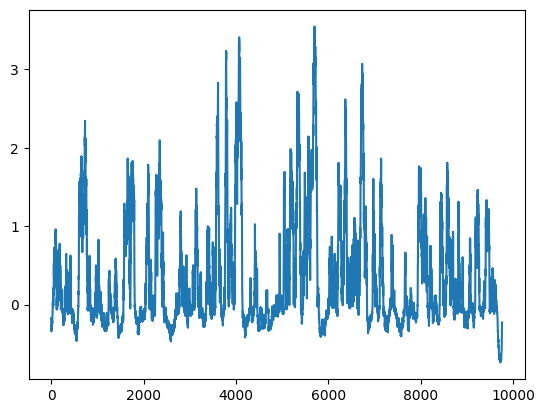

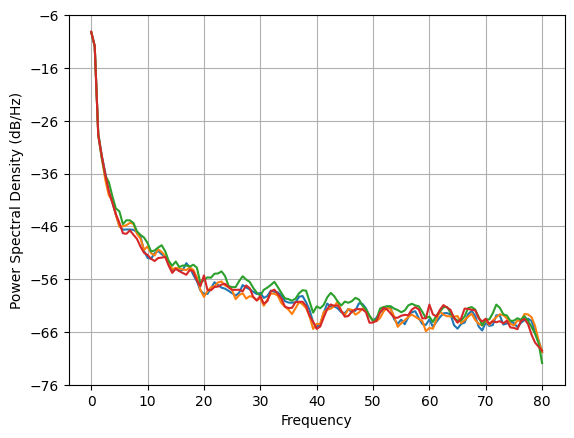

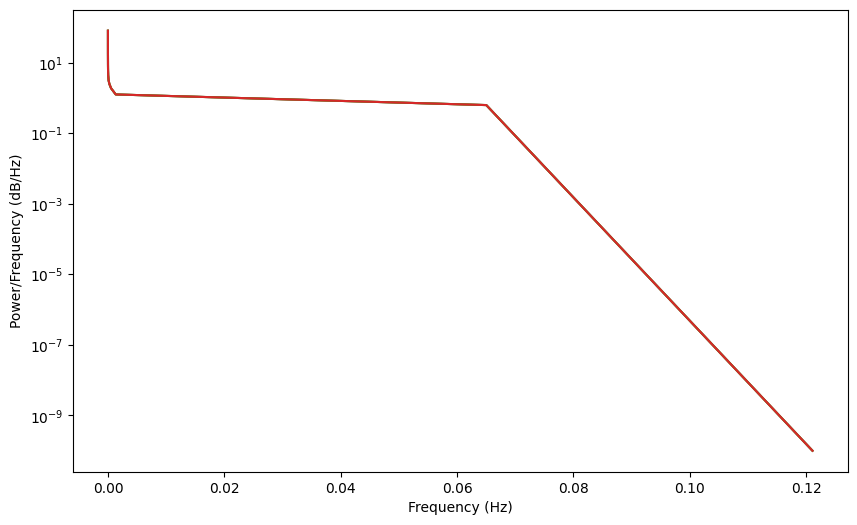

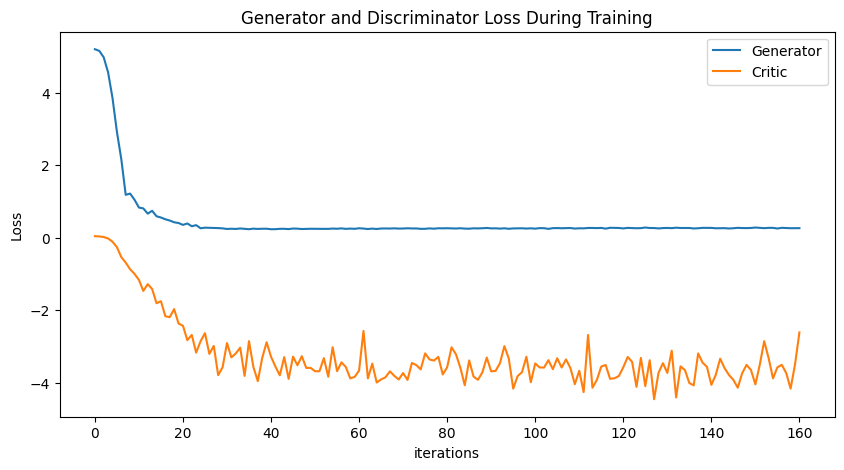

Epoch 170: Critic error ([5.2029758699789435, 5.157080505213027, 4.981214608466331, 4.565229046090716, 3.8587505128289963, 2.924853503125005, 2.167716499738731, 1.18236307607886, 1.21745392705383, 1.0476463287134763, 0.831244025366646, 0.8077893926015672, 0.6631527930261447, 0.7413225386118436, 0.5912606711701004, 0.5561260023639977, 0.5078742560418186, 0.47306033184730256, 0.42445329249889907, 0.40447990626535424, 0.3520996840425481, 0.3912986745649445, 0.31596291332712745, 0.344829157524987, 0.25894477493781765, 0.2753870139661455, 0.2716364594659329, 0.27013560470947695, 0.26396603294707127, 0.25659590881418404, 0.2401367879950463, 0.24672909237279422, 0.24021555245002704, 0.2537509307035082, 0.24231356859271408, 0.233579607503224, 0.2487463608273653, 0.24102881030301873, 0.24602730732635272, 0.2467362606236227, 0.2329399431850297, 0.23462530191176972, 0.24373311861217067, 0.2444754528633322, 0.23674483757000894, 0.2518274358534998, 0.24866165420216535, 0.23811611538909305, 0.242174

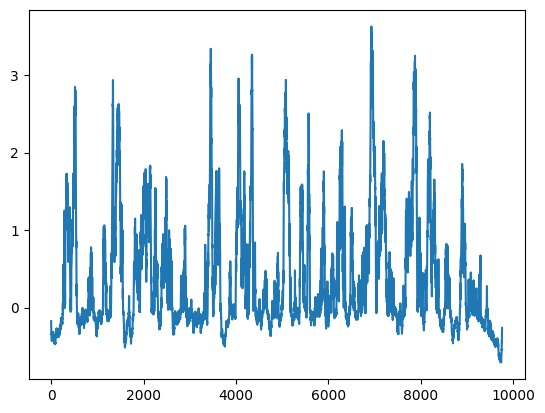

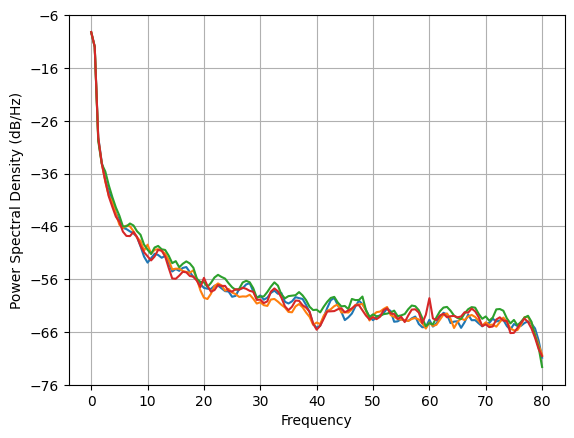

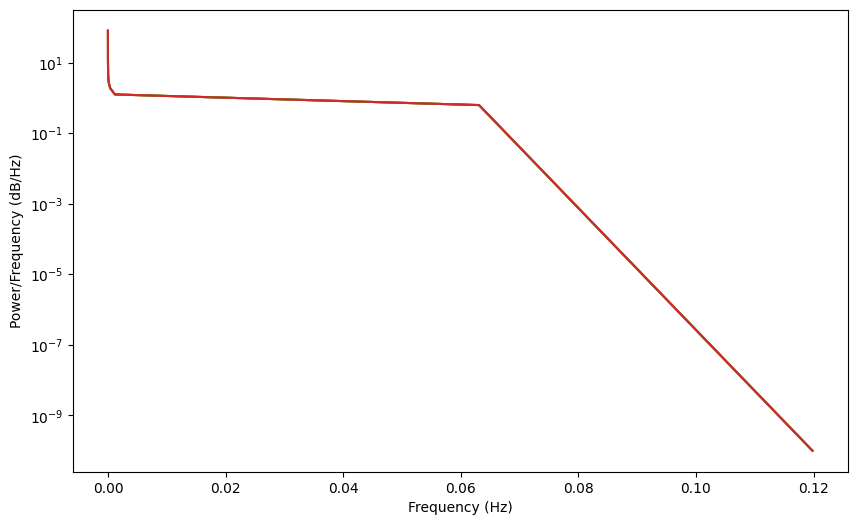

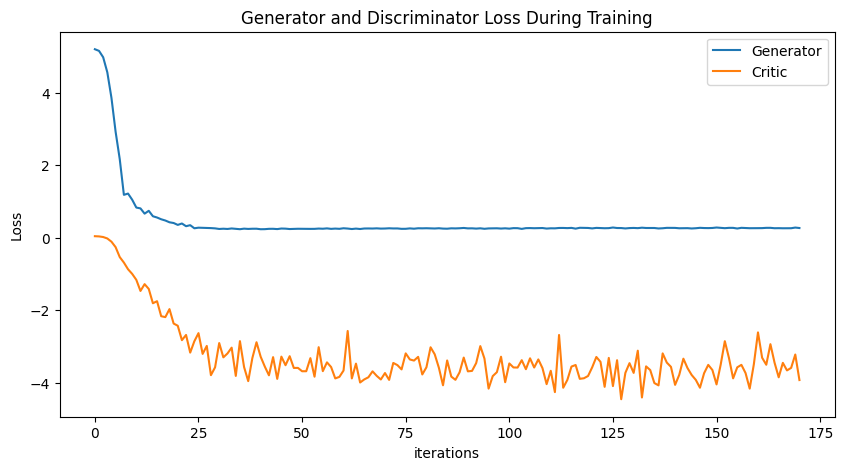

KeyboardInterrupt: 

In [23]:
SPECTRAL_FACTOR = 1000
NUM_EPOCHS = 300
PRINT_INTERVAL = 10
BATCH_SIZE = np.shape(training_data_closed)[0]
train_loader = DataLoader(TensorDataset(torch.tensor(training_data_closed).detach()), batch_size=BATCH_SIZE, shuffle=True)


def compute_psd_only(data, fs, nperseg=256, noverlap=None):
    n_channels, n_samples = data.shape
    psd = np.zeros((n_channels, nperseg // 2 + 1))

    for ch_idx in range(n_channels):
        f, Pxx = welch(data[ch_idx], fs=fs, nperseg=256, noverlap=128, window='hann', scaling='spectrum')
        psd[ch_idx] = Pxx + 1e-10

    return f, psd

def compute_psd_loss(real, fake):
    real = real.detach().numpy()
    fake = fake.detach().numpy()
    reals, fakes = [], []
    
    for btch in range(np.shape(real)[0]):
        _, psd_real = compute_psd_only(real[btch], fs)
        reals.append(psd_real)

    for btch in range(np.shape(fake)[0]):
        _, psd_fake = compute_psd_only(fake[btch], fs)
        fakes.append(psd_fake)

    reals, fakes = np.asarray(reals), np.asarray(fakes)
    psd_loss = ((reals - fakes)**2).mean()
    return torch.tensor(psd_loss, requires_grad=True)

def train():
    critic_err, gen_err, critic_psd_err, gen_psd_err = [], [], [], []
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=1e-5)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=1e-5)

    for epoch in range(NUM_EPOCHS):
        (real, ) = next(iter(train_loader))
        real.requires_grad = True

        for _ in range(5):
            fake = G(sample_normal_distribution(BATCH_SIZE, 200, 305))
            D.zero_grad()
            loss_critic_psd = compute_psd_loss(real, fake) * SPECTRAL_FACTOR
            loss_critic = (gradient_penalty(D, real, fake) * LAMBDA_GP) + loss_critic_psd
            loss_critic.backward()
            critic_optimizer.step()  

        fake = G(sample_normal_distribution(BATCH_SIZE, 200, 305))
        gen_fake = D(fake).reshape(-1)
        G.zero_grad()
        loss_gen = -torch.mean(gen_fake)
        loss_gen.backward()
        gen_optimizer.step()
        
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(fake, critic_err, gen_err)

    return critic_err, gen_err, fake, D, G

critic_err, gen_err, generated, disc, gen = train()

torch.save(gen, 'generator-v12-1.pt')
torch.save(disc, 'discriminator-v12-1.pt')
np.save('closed-v12-1.npy', generated.detach())
plot_everything(generated, gen_err, critic_err)
generated_data_closed = None

# Fourier transformation D only

Epoch 0: Critic error ([15656.52517951649]) Generator err ([0.027550339698791504])
Epoch 0: Critic PSD error ([15651.605056152996])


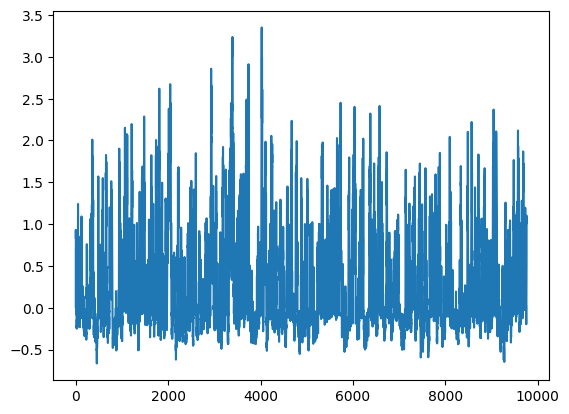

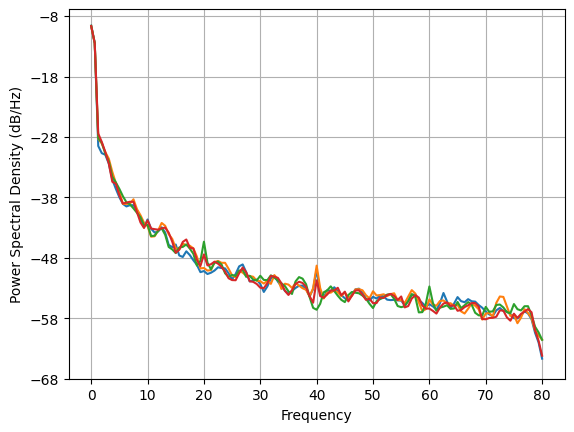

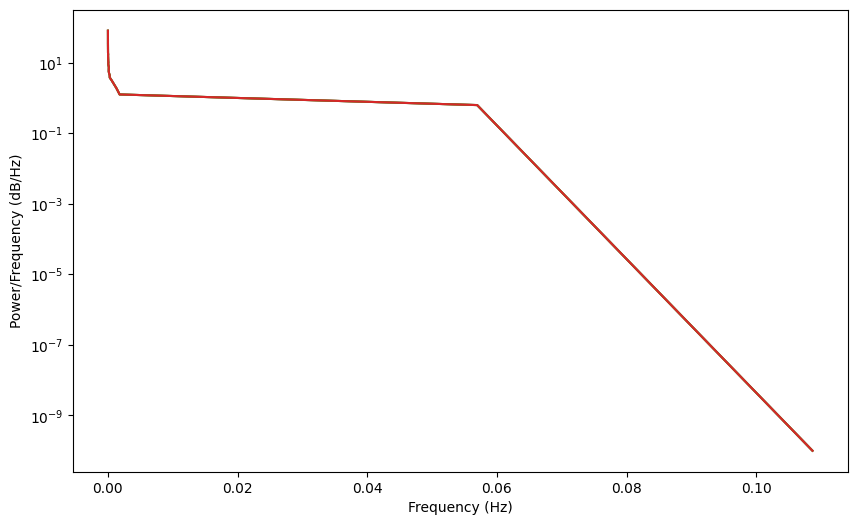

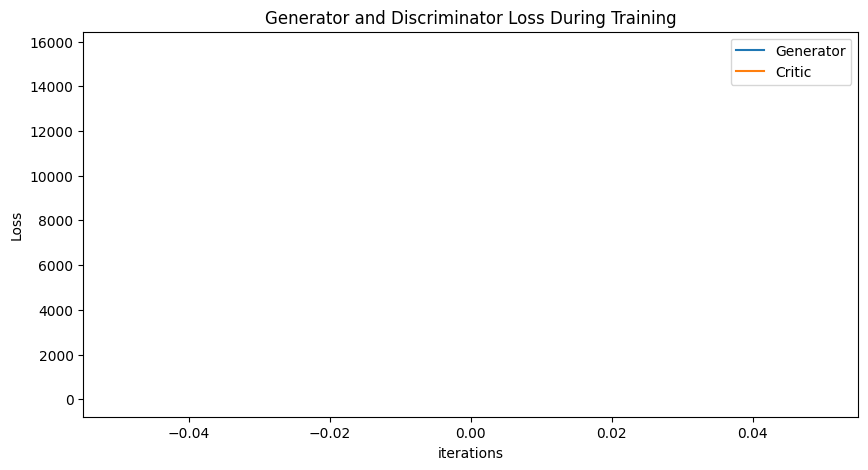

Epoch 10: Critic error ([15656.52517951649, 15650.466662330911, 15099.347580348443, 15307.647488619165, 16380.49052044201, 16871.364213016303, 17036.60888050054, 18248.061142520553, 19242.85786836324, 18550.172156691813, 18430.47932223647]) Generator err ([0.027550339698791504, 0.030276959761977196, 0.029685450717806816, 0.005940358620136976, -0.02454068325459957, -0.1495654135942459, -0.19558824598789215, -0.513938307762146, -0.6868963837623596, -1.1229338645935059, -1.0189263820648193])
Epoch 10: Critic PSD error ([15651.605056152996, 15645.680513603009, 15094.869111304704, 15303.826194809442, 16377.561176863355, 16869.924173989835, 17036.734909971332, 18250.066054212268, 19246.517424174177, 18555.54040491268, 18437.309913384674])


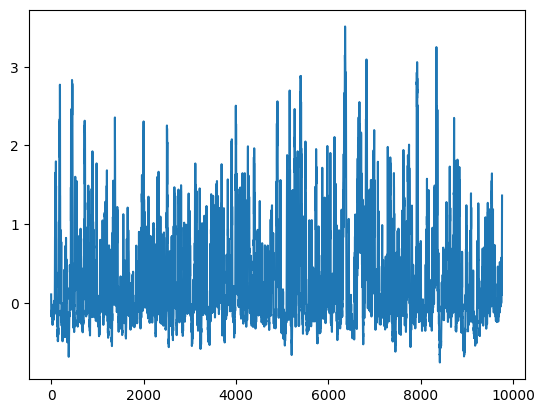

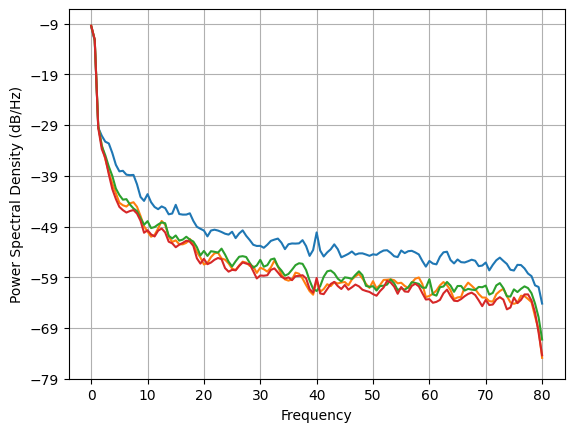

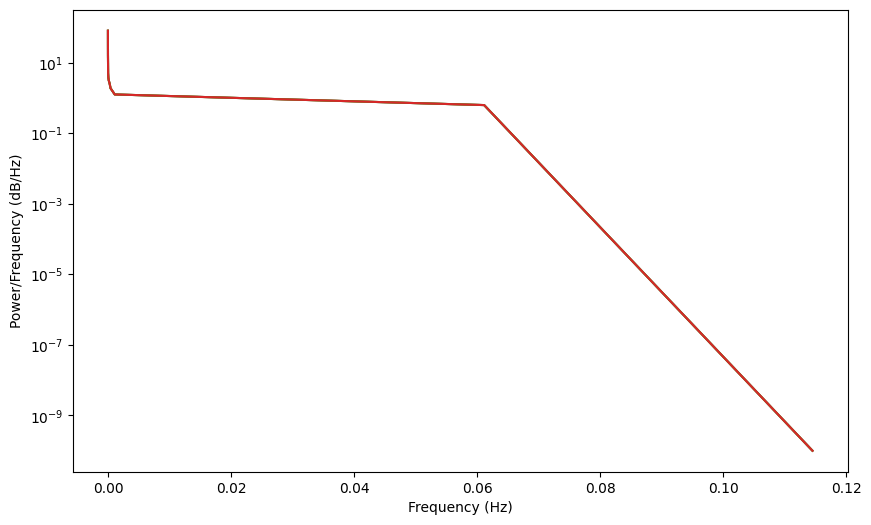

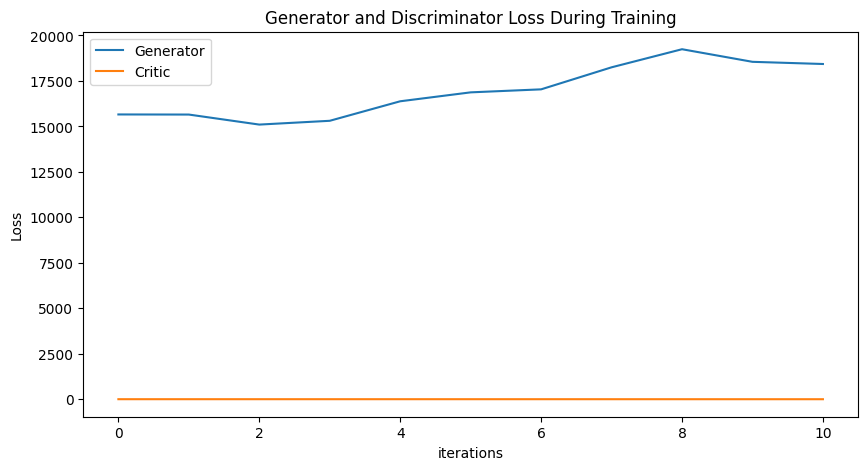

Epoch 20: Critic error ([15656.52517951649, 15650.466662330911, 15099.347580348443, 15307.647488619165, 16380.49052044201, 16871.364213016303, 17036.60888050054, 18248.061142520553, 19242.85786836324, 18550.172156691813, 18430.47932223647, 18219.11029051877, 17319.784120736505, 16521.366770957153, 16475.234740594344, 16576.441255189206, 16514.705830165483, 15887.877219095493, 15665.005532467721, 16032.013366958487, 15143.906486330918]) Generator err ([0.027550339698791504, 0.030276959761977196, 0.029685450717806816, 0.005940358620136976, -0.02454068325459957, -0.1495654135942459, -0.19558824598789215, -0.513938307762146, -0.6868963837623596, -1.1229338645935059, -1.0189263820648193, -1.6096771955490112, -1.9418363571166992, -2.2445521354675293, -2.309713840484619, -3.882028341293335, -5.3593621253967285, -5.928407669067383, -9.513816833496094, -11.348617553710938, -14.369034767150879])
Epoch 20: Critic PSD error ([15651.605056152996, 15645.680513603009, 15094.869111304704, 15303.826194

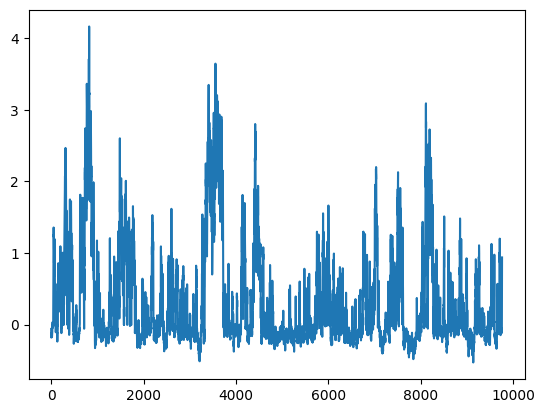

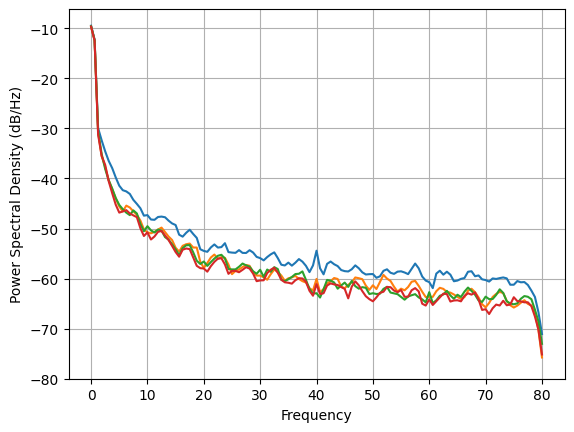

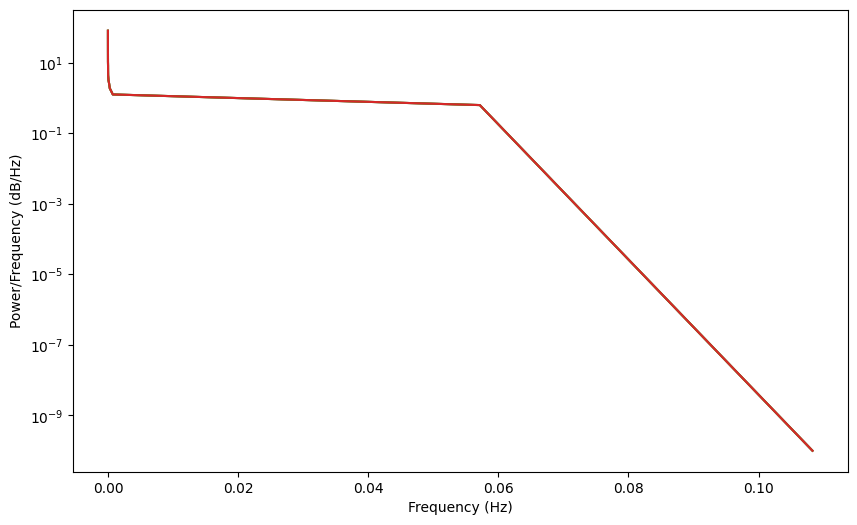

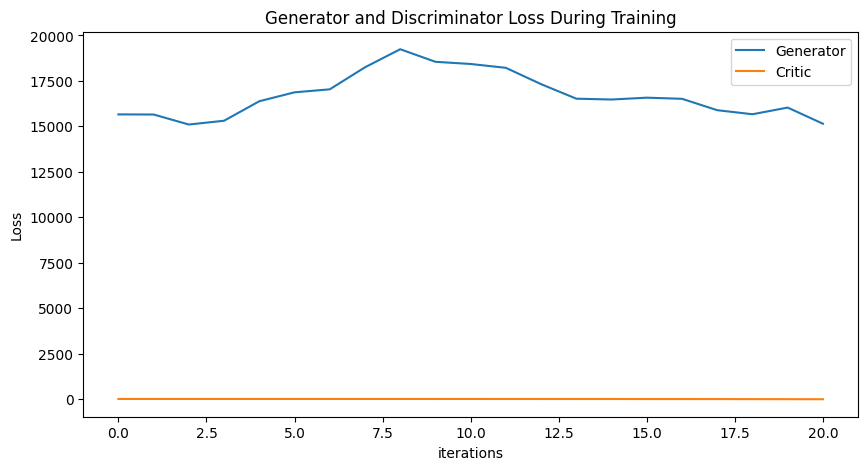

Epoch 30: Critic error ([15656.52517951649, 15650.466662330911, 15099.347580348443, 15307.647488619165, 16380.49052044201, 16871.364213016303, 17036.60888050054, 18248.061142520553, 19242.85786836324, 18550.172156691813, 18430.47932223647, 18219.11029051877, 17319.784120736505, 16521.366770957153, 16475.234740594344, 16576.441255189206, 16514.705830165483, 15887.877219095493, 15665.005532467721, 16032.013366958487, 15143.906486330918, 15426.251795435299, 15454.176259456484, 16233.159786344848, 16517.65173512317, 17113.76683166544, 18525.7475168334, 18448.09346664961, 18975.64828449555, 18295.63916272414, 17723.630497655176]) Generator err ([0.027550339698791504, 0.030276959761977196, 0.029685450717806816, 0.005940358620136976, -0.02454068325459957, -0.1495654135942459, -0.19558824598789215, -0.513938307762146, -0.6868963837623596, -1.1229338645935059, -1.0189263820648193, -1.6096771955490112, -1.9418363571166992, -2.2445521354675293, -2.309713840484619, -3.882028341293335, -5.359362125

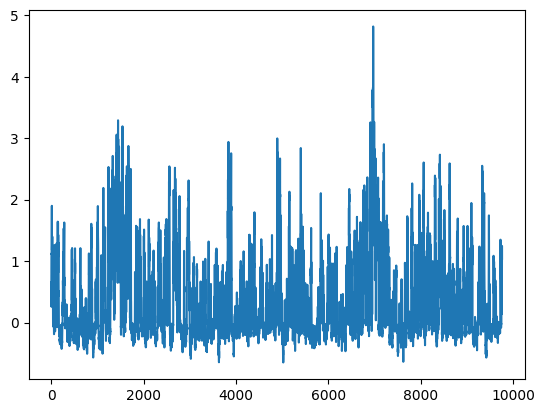

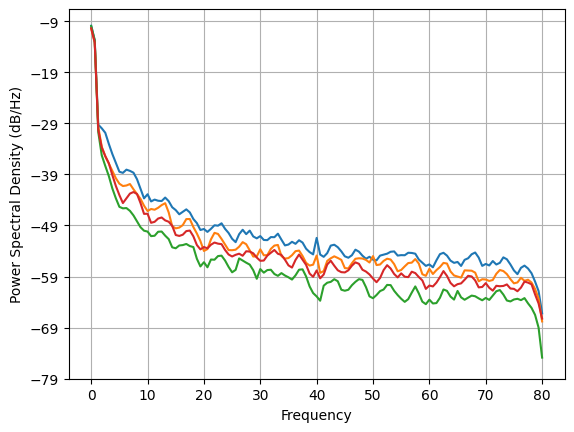

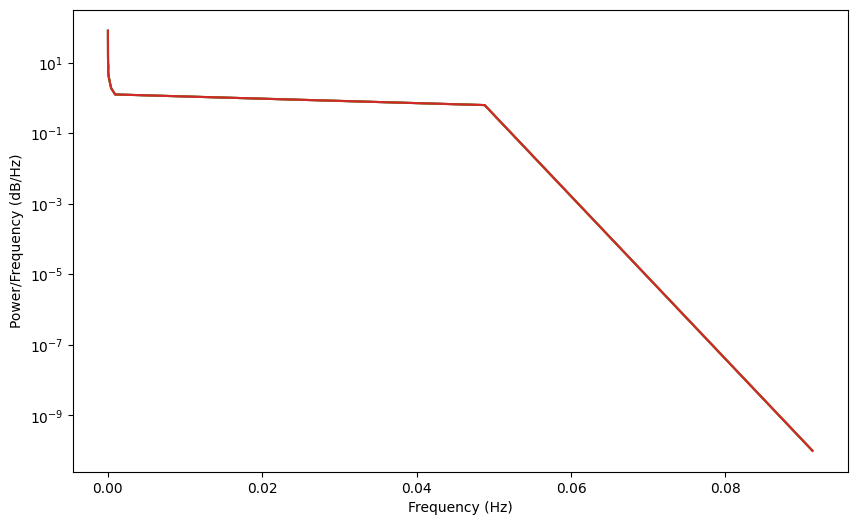

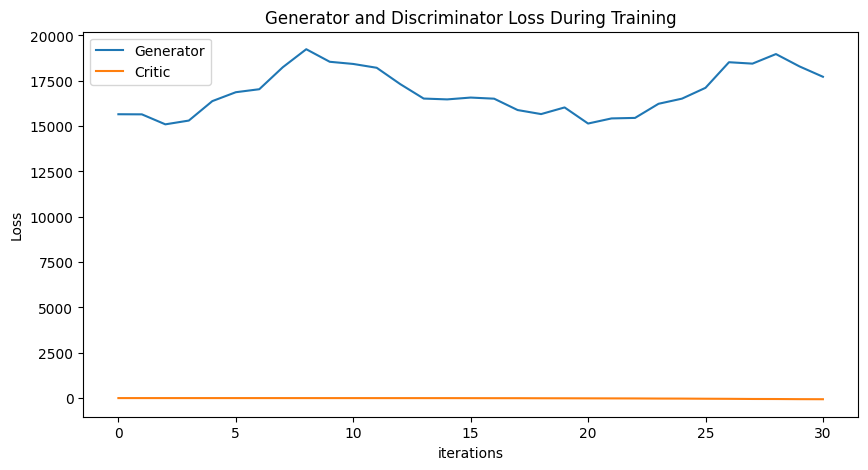

Epoch 40: Critic error ([15656.52517951649, 15650.466662330911, 15099.347580348443, 15307.647488619165, 16380.49052044201, 16871.364213016303, 17036.60888050054, 18248.061142520553, 19242.85786836324, 18550.172156691813, 18430.47932223647, 18219.11029051877, 17319.784120736505, 16521.366770957153, 16475.234740594344, 16576.441255189206, 16514.705830165483, 15887.877219095493, 15665.005532467721, 16032.013366958487, 15143.906486330918, 15426.251795435299, 15454.176259456484, 16233.159786344848, 16517.65173512317, 17113.76683166544, 18525.7475168334, 18448.09346664961, 18975.64828449555, 18295.63916272414, 17723.630497655176, 17463.873413421014, 17303.702848806213, 17514.34753282788, 17798.321099786197, 16977.091382804174, 17144.12890833507, 17066.922613330928, 16655.16035644873, 16641.208682048124, 16336.419289870719]) Generator err ([0.027550339698791504, 0.030276959761977196, 0.029685450717806816, 0.005940358620136976, -0.02454068325459957, -0.1495654135942459, -0.19558824598789215, -

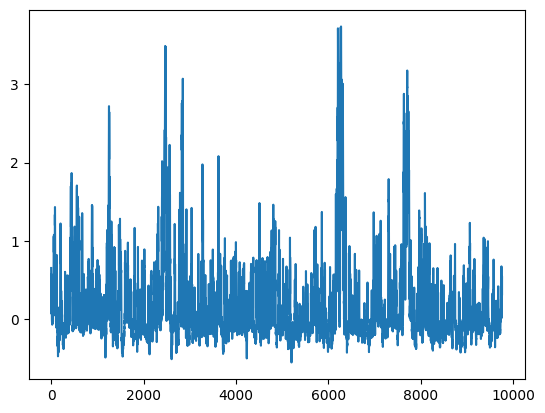

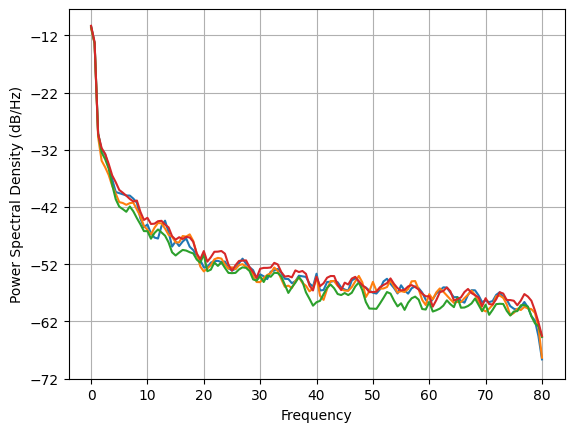

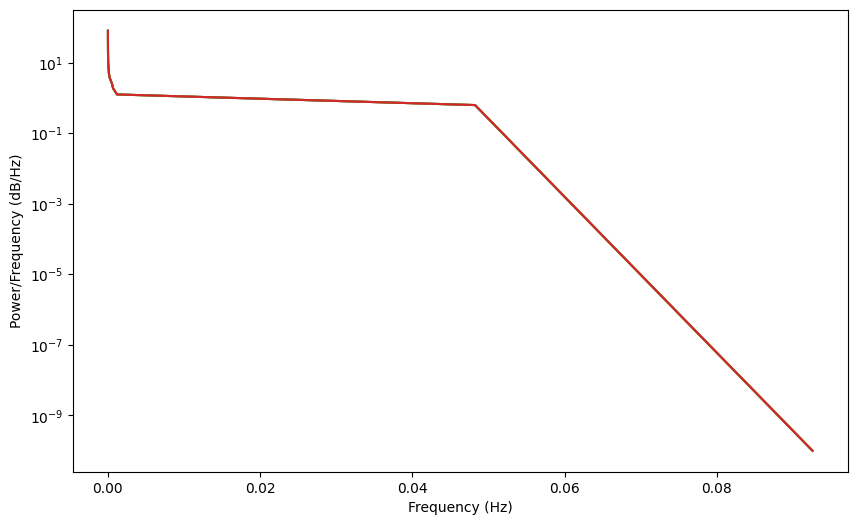

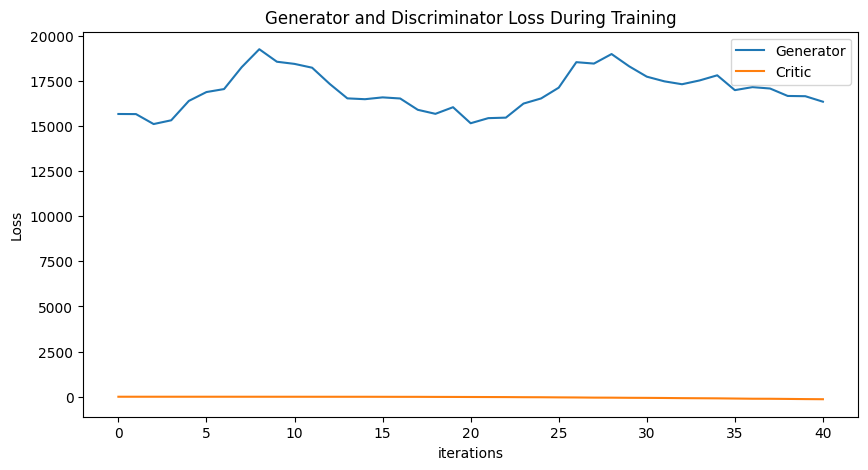

Epoch 50: Critic error ([15656.52517951649, 15650.466662330911, 15099.347580348443, 15307.647488619165, 16380.49052044201, 16871.364213016303, 17036.60888050054, 18248.061142520553, 19242.85786836324, 18550.172156691813, 18430.47932223647, 18219.11029051877, 17319.784120736505, 16521.366770957153, 16475.234740594344, 16576.441255189206, 16514.705830165483, 15887.877219095493, 15665.005532467721, 16032.013366958487, 15143.906486330918, 15426.251795435299, 15454.176259456484, 16233.159786344848, 16517.65173512317, 17113.76683166544, 18525.7475168334, 18448.09346664961, 18975.64828449555, 18295.63916272414, 17723.630497655176, 17463.873413421014, 17303.702848806213, 17514.34753282788, 17798.321099786197, 16977.091382804174, 17144.12890833507, 17066.922613330928, 16655.16035644873, 16641.208682048124, 16336.419289870719, 16421.033175364882, 16589.675630338712, 16853.68983241805, 16477.11935051584, 17084.919691326555, 16782.243681790747, 17302.36865260745, 17322.80485442122, 16992.358750268

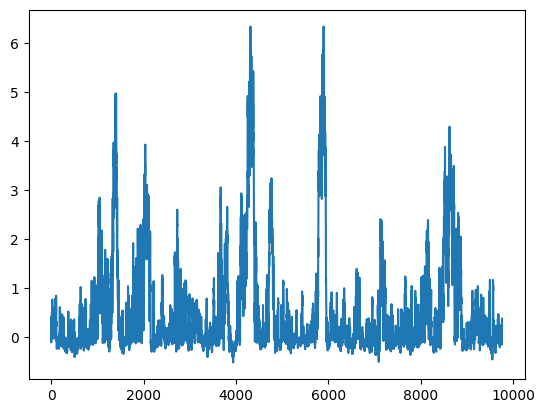

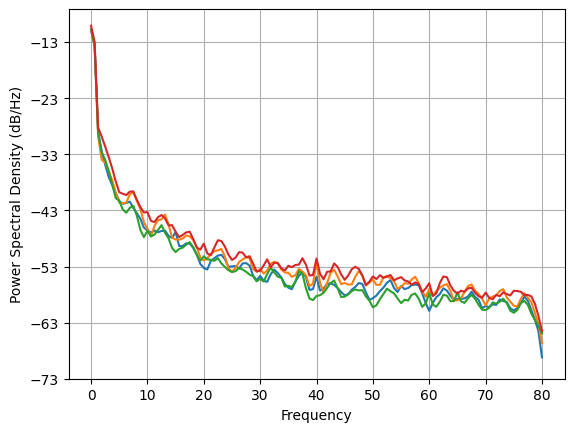

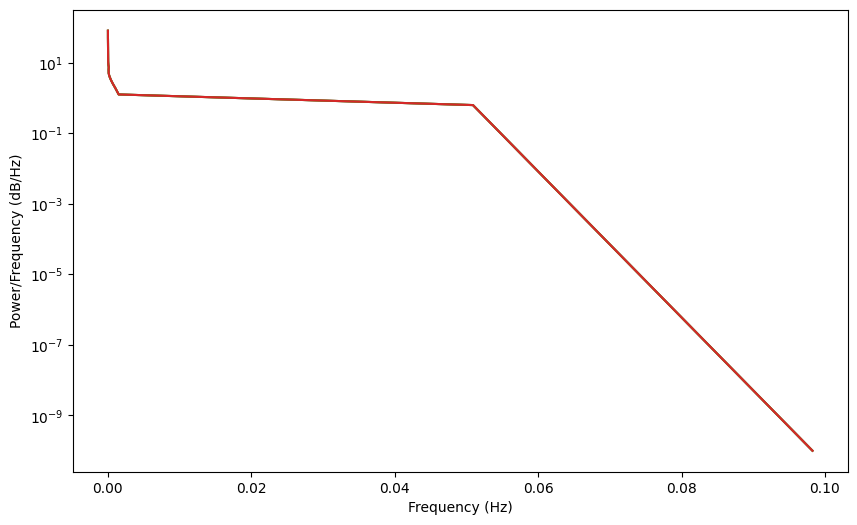

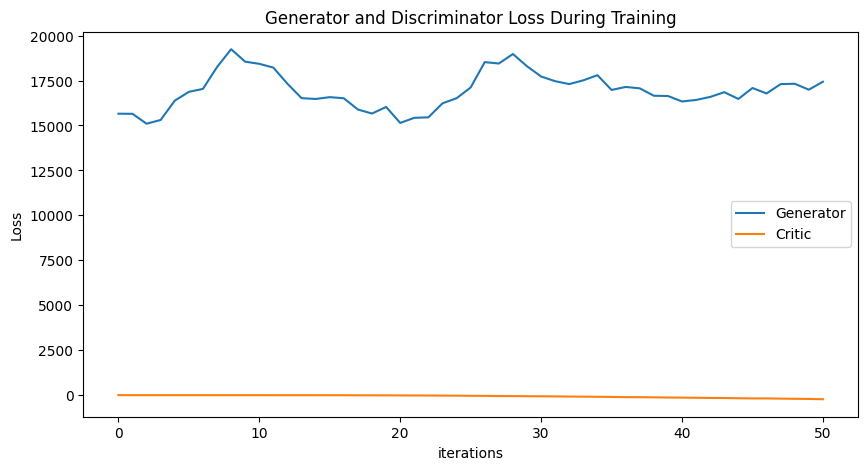

Epoch 60: Critic error ([15656.52517951649, 15650.466662330911, 15099.347580348443, 15307.647488619165, 16380.49052044201, 16871.364213016303, 17036.60888050054, 18248.061142520553, 19242.85786836324, 18550.172156691813, 18430.47932223647, 18219.11029051877, 17319.784120736505, 16521.366770957153, 16475.234740594344, 16576.441255189206, 16514.705830165483, 15887.877219095493, 15665.005532467721, 16032.013366958487, 15143.906486330918, 15426.251795435299, 15454.176259456484, 16233.159786344848, 16517.65173512317, 17113.76683166544, 18525.7475168334, 18448.09346664961, 18975.64828449555, 18295.63916272414, 17723.630497655176, 17463.873413421014, 17303.702848806213, 17514.34753282788, 17798.321099786197, 16977.091382804174, 17144.12890833507, 17066.922613330928, 16655.16035644873, 16641.208682048124, 16336.419289870719, 16421.033175364882, 16589.675630338712, 16853.68983241805, 16477.11935051584, 17084.919691326555, 16782.243681790747, 17302.36865260745, 17322.80485442122, 16992.358750268

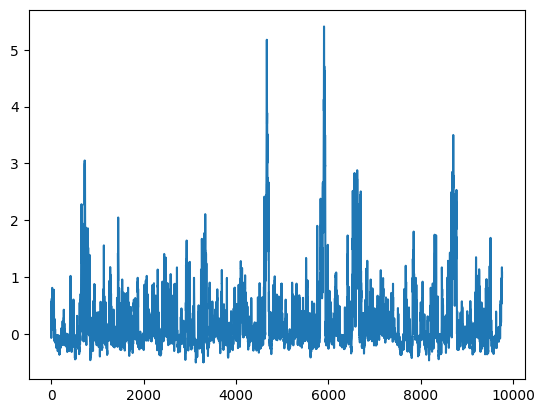

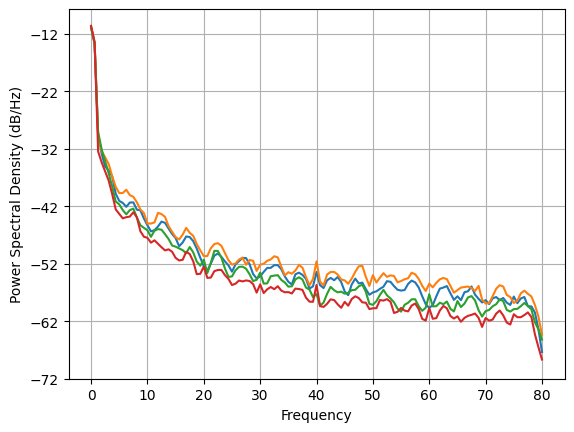

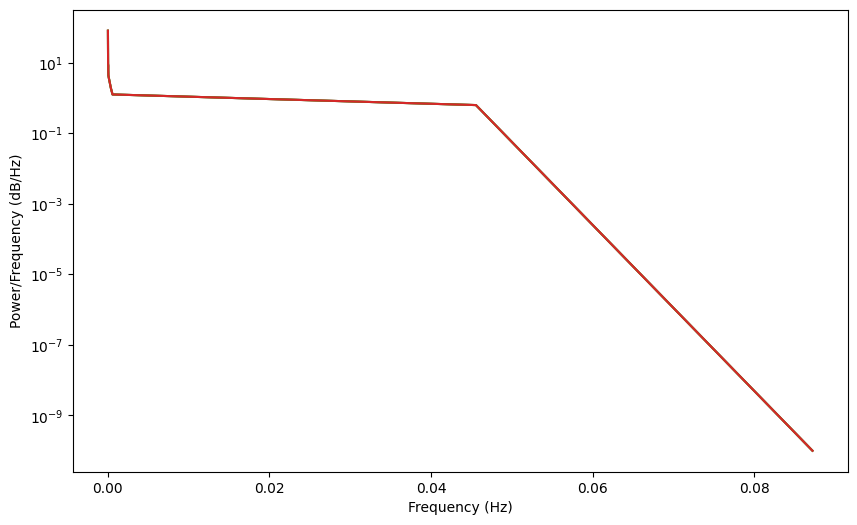

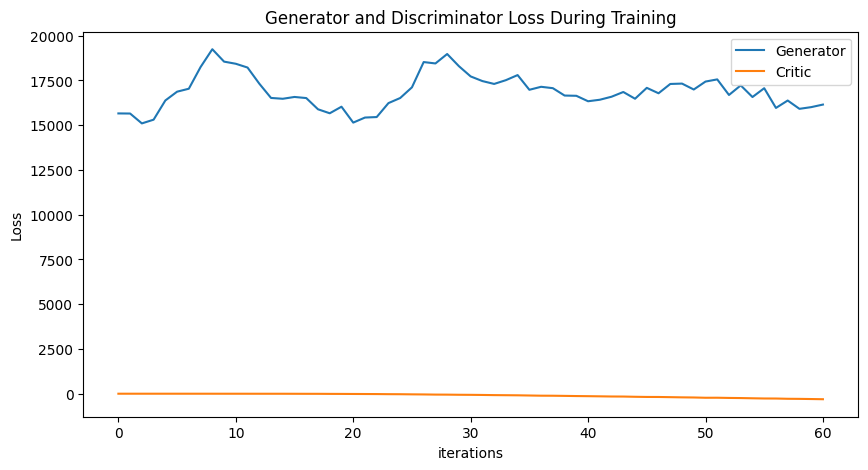

Epoch 70: Critic error ([15656.52517951649, 15650.466662330911, 15099.347580348443, 15307.647488619165, 16380.49052044201, 16871.364213016303, 17036.60888050054, 18248.061142520553, 19242.85786836324, 18550.172156691813, 18430.47932223647, 18219.11029051877, 17319.784120736505, 16521.366770957153, 16475.234740594344, 16576.441255189206, 16514.705830165483, 15887.877219095493, 15665.005532467721, 16032.013366958487, 15143.906486330918, 15426.251795435299, 15454.176259456484, 16233.159786344848, 16517.65173512317, 17113.76683166544, 18525.7475168334, 18448.09346664961, 18975.64828449555, 18295.63916272414, 17723.630497655176, 17463.873413421014, 17303.702848806213, 17514.34753282788, 17798.321099786197, 16977.091382804174, 17144.12890833507, 17066.922613330928, 16655.16035644873, 16641.208682048124, 16336.419289870719, 16421.033175364882, 16589.675630338712, 16853.68983241805, 16477.11935051584, 17084.919691326555, 16782.243681790747, 17302.36865260745, 17322.80485442122, 16992.358750268

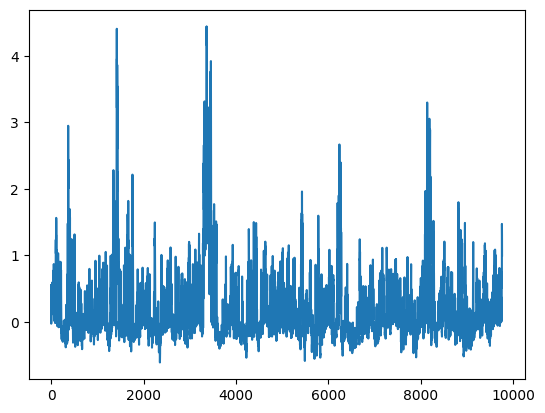

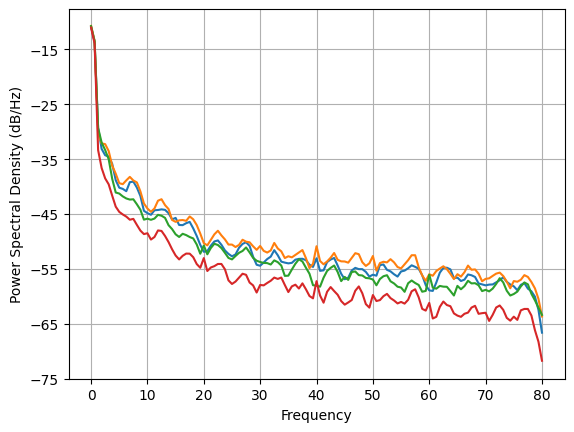

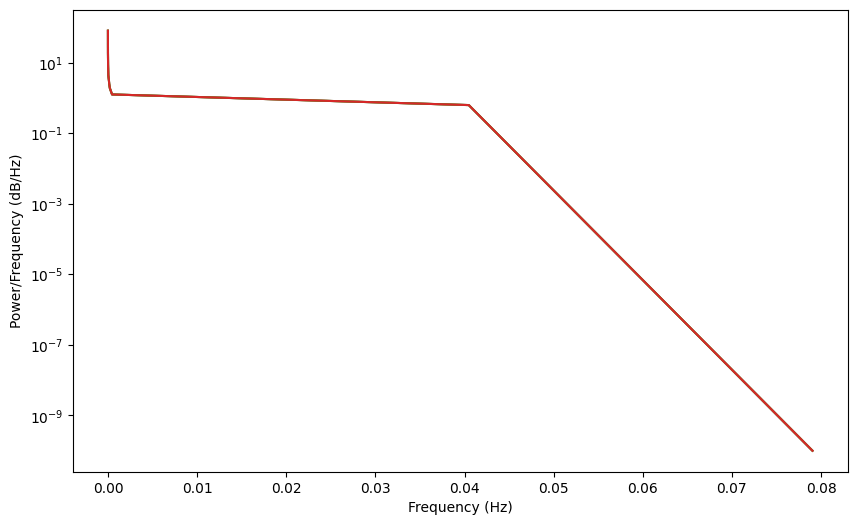

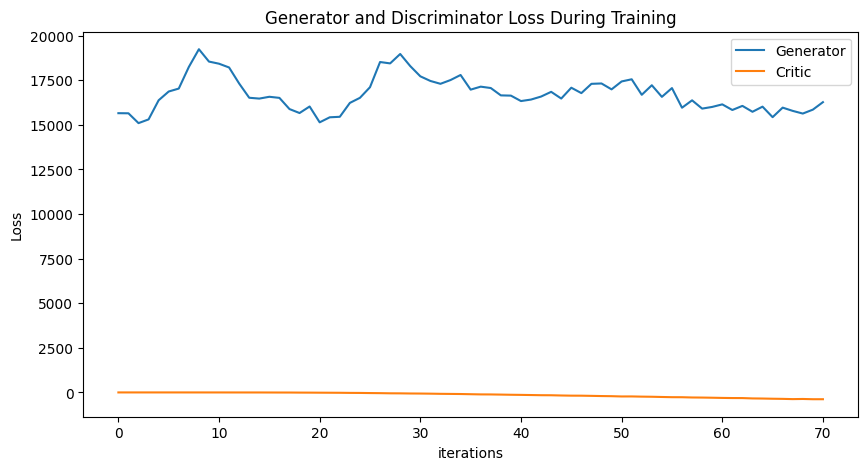

Epoch 80: Critic error ([15656.52517951649, 15650.466662330911, 15099.347580348443, 15307.647488619165, 16380.49052044201, 16871.364213016303, 17036.60888050054, 18248.061142520553, 19242.85786836324, 18550.172156691813, 18430.47932223647, 18219.11029051877, 17319.784120736505, 16521.366770957153, 16475.234740594344, 16576.441255189206, 16514.705830165483, 15887.877219095493, 15665.005532467721, 16032.013366958487, 15143.906486330918, 15426.251795435299, 15454.176259456484, 16233.159786344848, 16517.65173512317, 17113.76683166544, 18525.7475168334, 18448.09346664961, 18975.64828449555, 18295.63916272414, 17723.630497655176, 17463.873413421014, 17303.702848806213, 17514.34753282788, 17798.321099786197, 16977.091382804174, 17144.12890833507, 17066.922613330928, 16655.16035644873, 16641.208682048124, 16336.419289870719, 16421.033175364882, 16589.675630338712, 16853.68983241805, 16477.11935051584, 17084.919691326555, 16782.243681790747, 17302.36865260745, 17322.80485442122, 16992.358750268

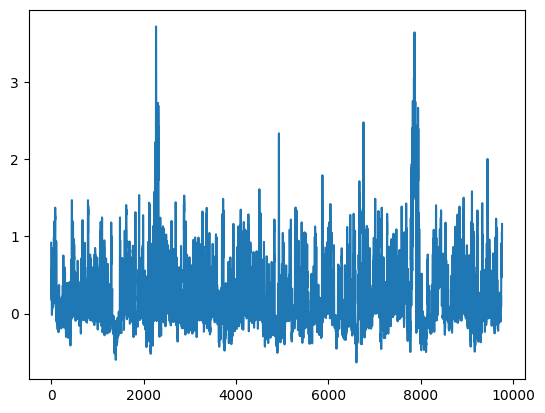

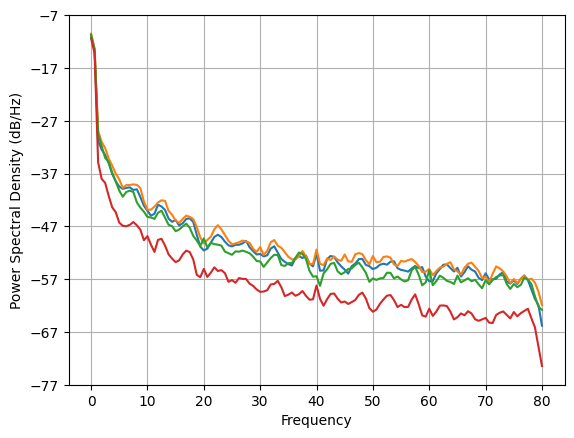

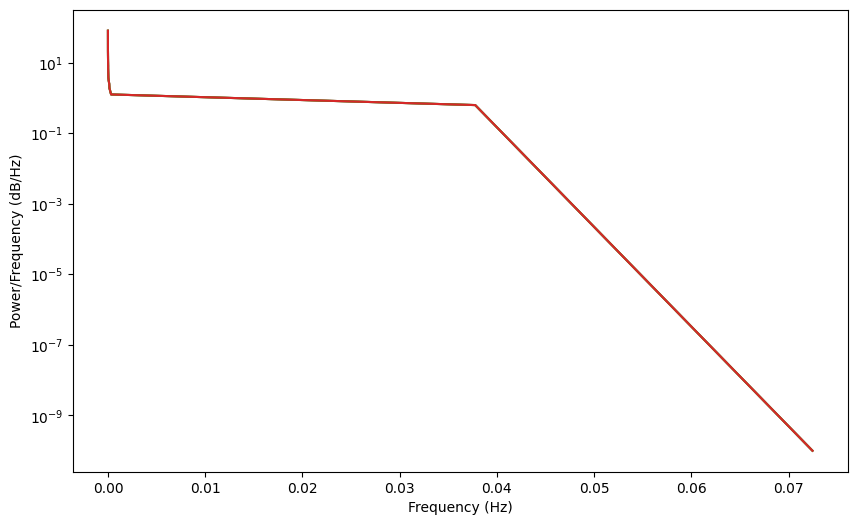

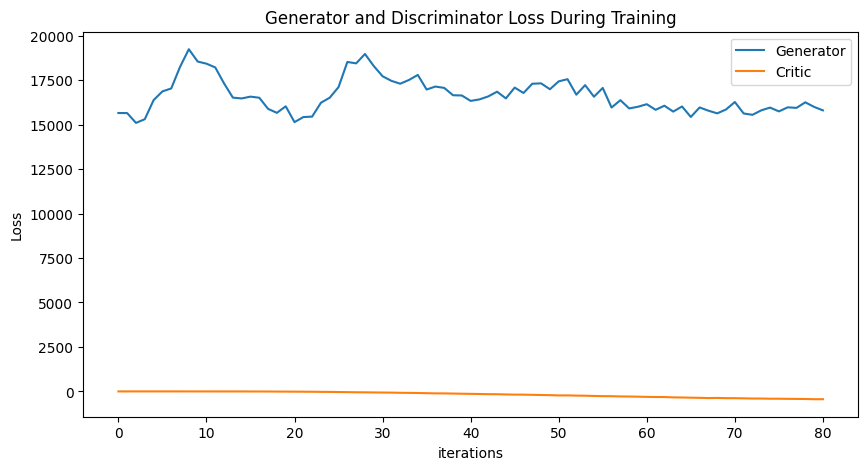

Epoch 90: Critic error ([15656.52517951649, 15650.466662330911, 15099.347580348443, 15307.647488619165, 16380.49052044201, 16871.364213016303, 17036.60888050054, 18248.061142520553, 19242.85786836324, 18550.172156691813, 18430.47932223647, 18219.11029051877, 17319.784120736505, 16521.366770957153, 16475.234740594344, 16576.441255189206, 16514.705830165483, 15887.877219095493, 15665.005532467721, 16032.013366958487, 15143.906486330918, 15426.251795435299, 15454.176259456484, 16233.159786344848, 16517.65173512317, 17113.76683166544, 18525.7475168334, 18448.09346664961, 18975.64828449555, 18295.63916272414, 17723.630497655176, 17463.873413421014, 17303.702848806213, 17514.34753282788, 17798.321099786197, 16977.091382804174, 17144.12890833507, 17066.922613330928, 16655.16035644873, 16641.208682048124, 16336.419289870719, 16421.033175364882, 16589.675630338712, 16853.68983241805, 16477.11935051584, 17084.919691326555, 16782.243681790747, 17302.36865260745, 17322.80485442122, 16992.358750268

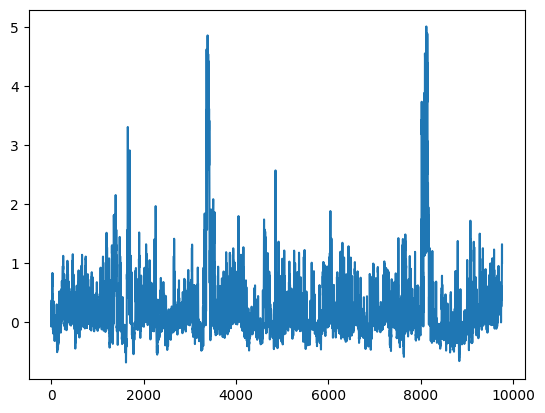

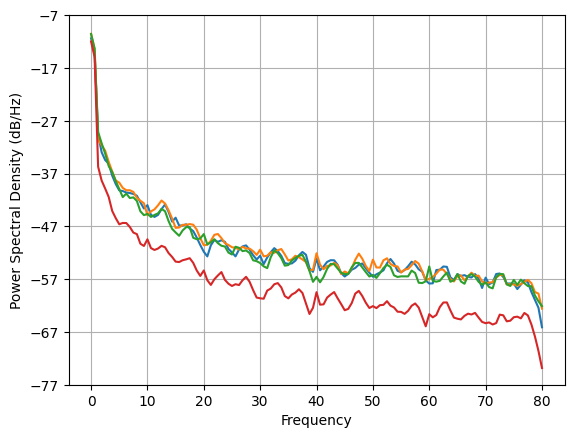

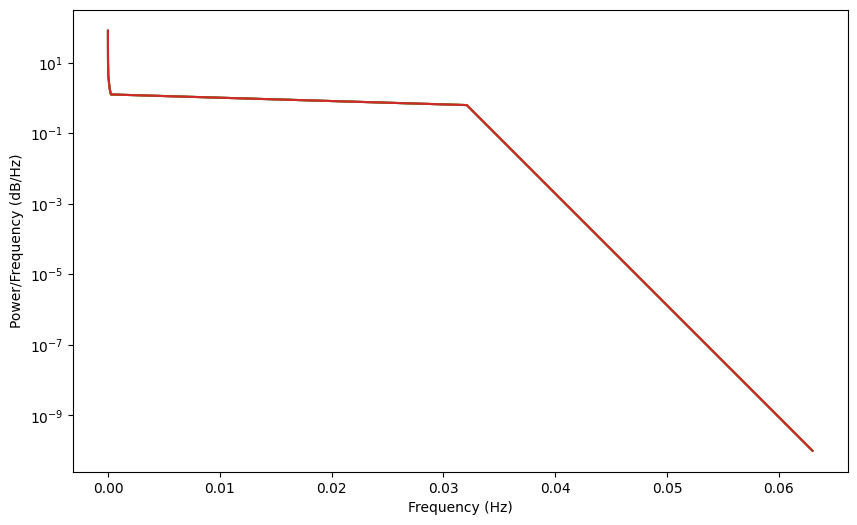

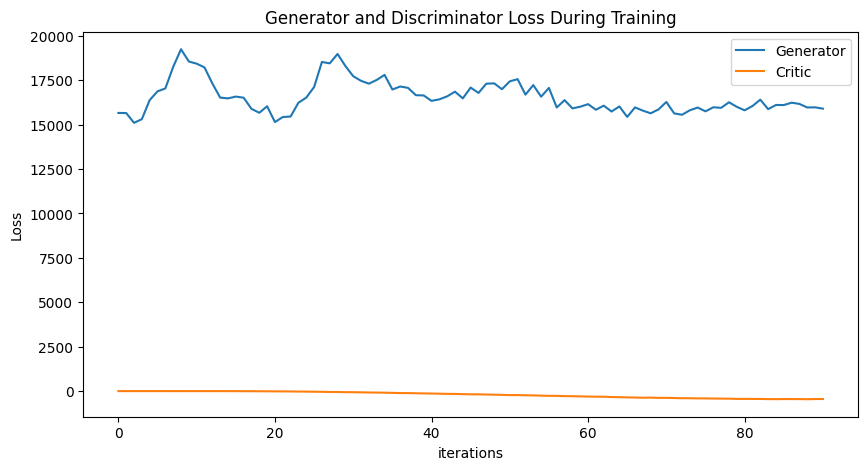

Epoch 100: Critic error ([15656.52517951649, 15650.466662330911, 15099.347580348443, 15307.647488619165, 16380.49052044201, 16871.364213016303, 17036.60888050054, 18248.061142520553, 19242.85786836324, 18550.172156691813, 18430.47932223647, 18219.11029051877, 17319.784120736505, 16521.366770957153, 16475.234740594344, 16576.441255189206, 16514.705830165483, 15887.877219095493, 15665.005532467721, 16032.013366958487, 15143.906486330918, 15426.251795435299, 15454.176259456484, 16233.159786344848, 16517.65173512317, 17113.76683166544, 18525.7475168334, 18448.09346664961, 18975.64828449555, 18295.63916272414, 17723.630497655176, 17463.873413421014, 17303.702848806213, 17514.34753282788, 17798.321099786197, 16977.091382804174, 17144.12890833507, 17066.922613330928, 16655.16035644873, 16641.208682048124, 16336.419289870719, 16421.033175364882, 16589.675630338712, 16853.68983241805, 16477.11935051584, 17084.919691326555, 16782.243681790747, 17302.36865260745, 17322.80485442122, 16992.35875026

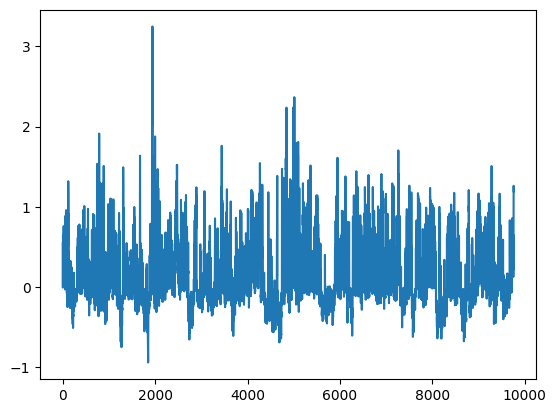

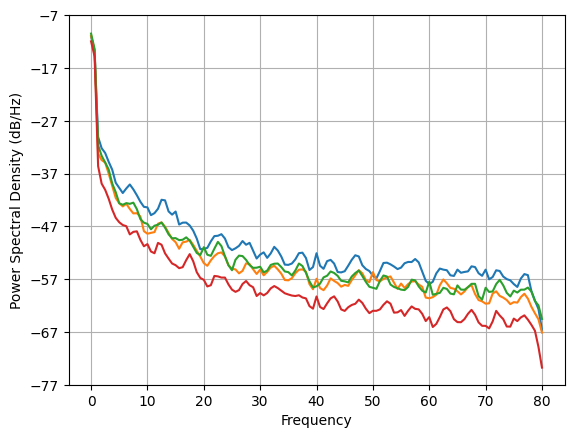

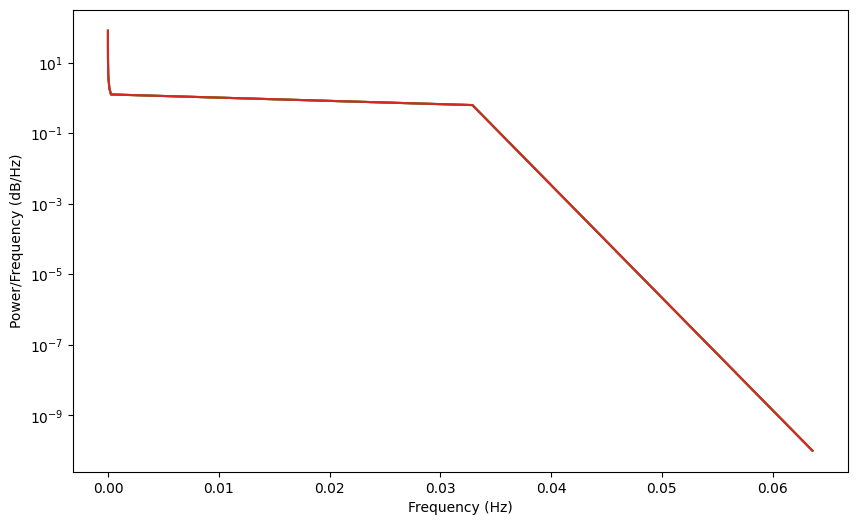

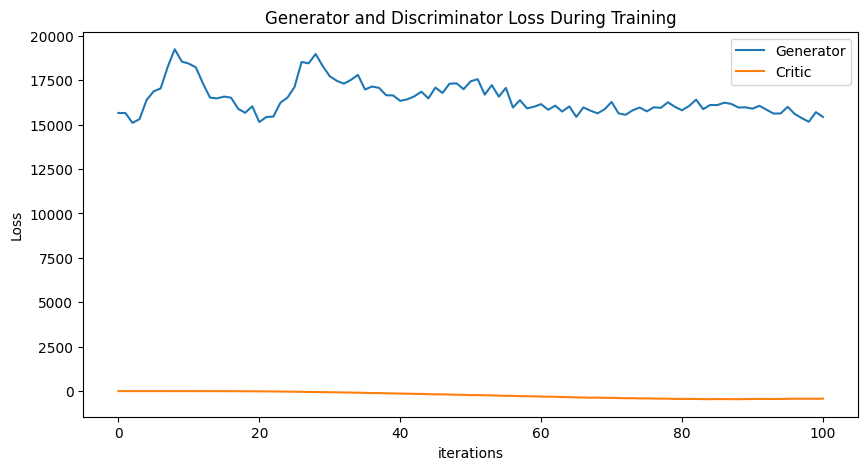

Epoch 110: Critic error ([15656.52517951649, 15650.466662330911, 15099.347580348443, 15307.647488619165, 16380.49052044201, 16871.364213016303, 17036.60888050054, 18248.061142520553, 19242.85786836324, 18550.172156691813, 18430.47932223647, 18219.11029051877, 17319.784120736505, 16521.366770957153, 16475.234740594344, 16576.441255189206, 16514.705830165483, 15887.877219095493, 15665.005532467721, 16032.013366958487, 15143.906486330918, 15426.251795435299, 15454.176259456484, 16233.159786344848, 16517.65173512317, 17113.76683166544, 18525.7475168334, 18448.09346664961, 18975.64828449555, 18295.63916272414, 17723.630497655176, 17463.873413421014, 17303.702848806213, 17514.34753282788, 17798.321099786197, 16977.091382804174, 17144.12890833507, 17066.922613330928, 16655.16035644873, 16641.208682048124, 16336.419289870719, 16421.033175364882, 16589.675630338712, 16853.68983241805, 16477.11935051584, 17084.919691326555, 16782.243681790747, 17302.36865260745, 17322.80485442122, 16992.35875026

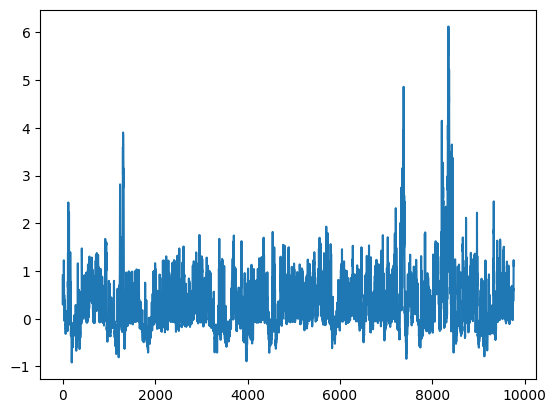

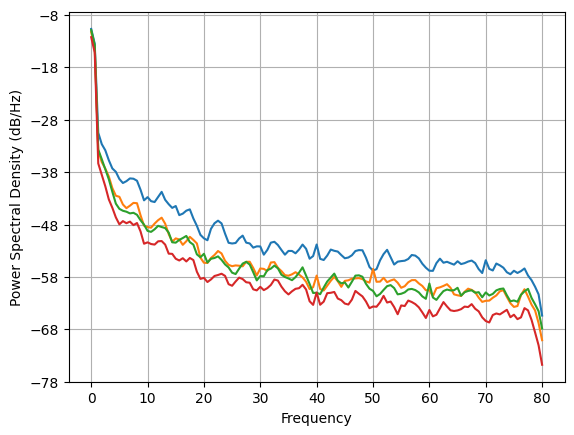

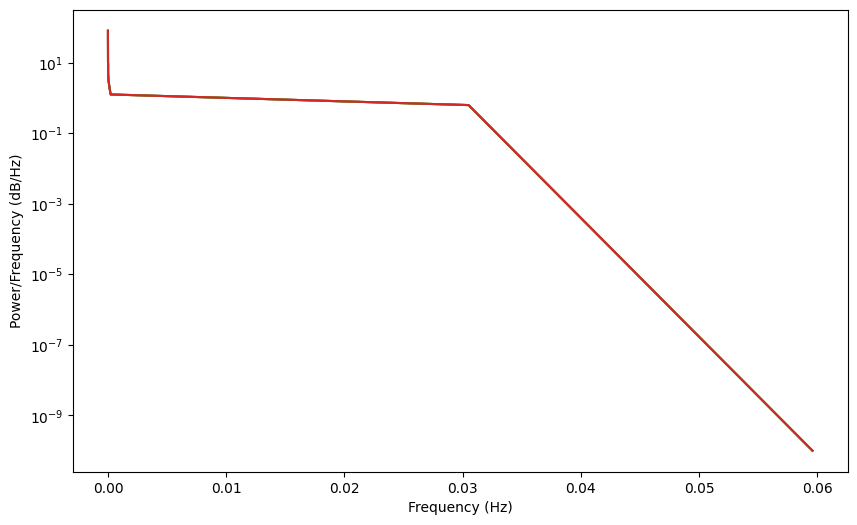

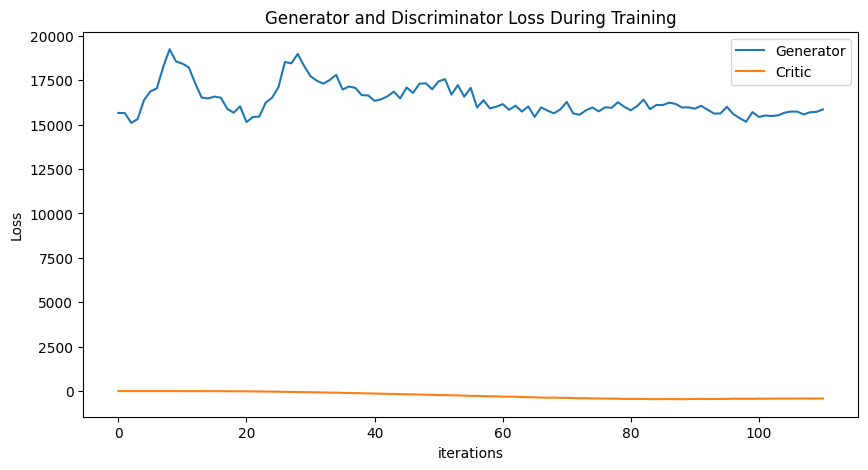

Epoch 120: Critic error ([15656.52517951649, 15650.466662330911, 15099.347580348443, 15307.647488619165, 16380.49052044201, 16871.364213016303, 17036.60888050054, 18248.061142520553, 19242.85786836324, 18550.172156691813, 18430.47932223647, 18219.11029051877, 17319.784120736505, 16521.366770957153, 16475.234740594344, 16576.441255189206, 16514.705830165483, 15887.877219095493, 15665.005532467721, 16032.013366958487, 15143.906486330918, 15426.251795435299, 15454.176259456484, 16233.159786344848, 16517.65173512317, 17113.76683166544, 18525.7475168334, 18448.09346664961, 18975.64828449555, 18295.63916272414, 17723.630497655176, 17463.873413421014, 17303.702848806213, 17514.34753282788, 17798.321099786197, 16977.091382804174, 17144.12890833507, 17066.922613330928, 16655.16035644873, 16641.208682048124, 16336.419289870719, 16421.033175364882, 16589.675630338712, 16853.68983241805, 16477.11935051584, 17084.919691326555, 16782.243681790747, 17302.36865260745, 17322.80485442122, 16992.35875026

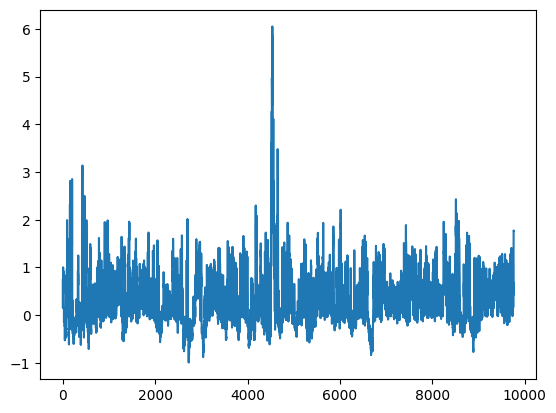

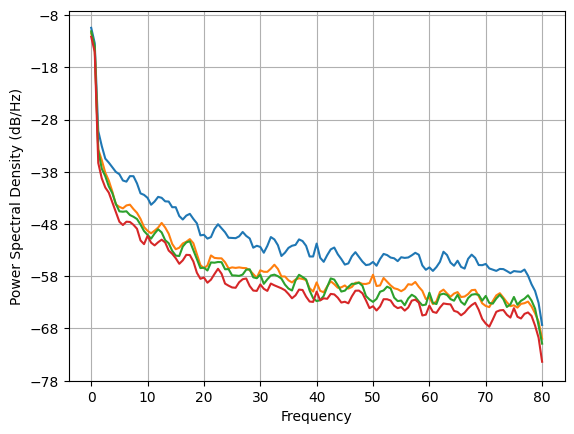

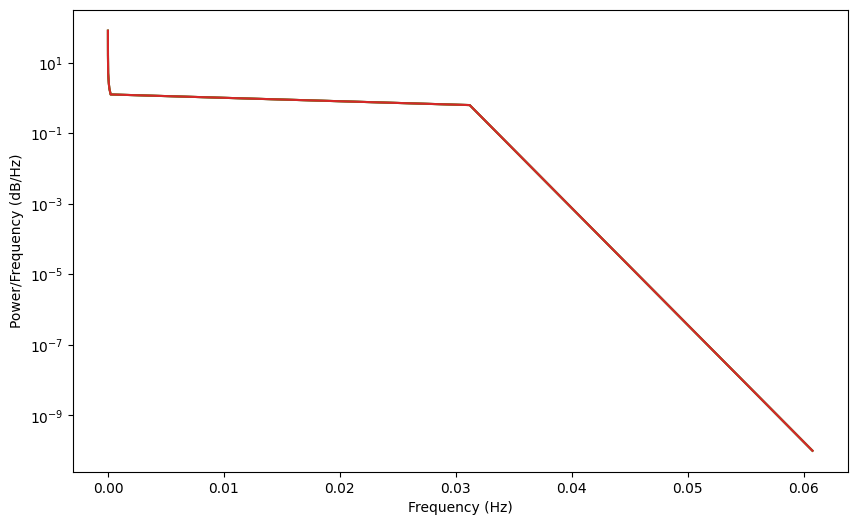

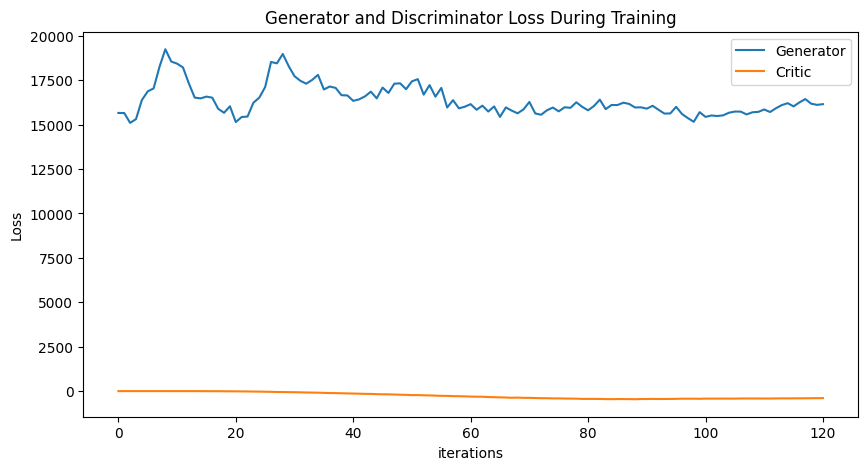

Epoch 130: Critic error ([15656.52517951649, 15650.466662330911, 15099.347580348443, 15307.647488619165, 16380.49052044201, 16871.364213016303, 17036.60888050054, 18248.061142520553, 19242.85786836324, 18550.172156691813, 18430.47932223647, 18219.11029051877, 17319.784120736505, 16521.366770957153, 16475.234740594344, 16576.441255189206, 16514.705830165483, 15887.877219095493, 15665.005532467721, 16032.013366958487, 15143.906486330918, 15426.251795435299, 15454.176259456484, 16233.159786344848, 16517.65173512317, 17113.76683166544, 18525.7475168334, 18448.09346664961, 18975.64828449555, 18295.63916272414, 17723.630497655176, 17463.873413421014, 17303.702848806213, 17514.34753282788, 17798.321099786197, 16977.091382804174, 17144.12890833507, 17066.922613330928, 16655.16035644873, 16641.208682048124, 16336.419289870719, 16421.033175364882, 16589.675630338712, 16853.68983241805, 16477.11935051584, 17084.919691326555, 16782.243681790747, 17302.36865260745, 17322.80485442122, 16992.35875026

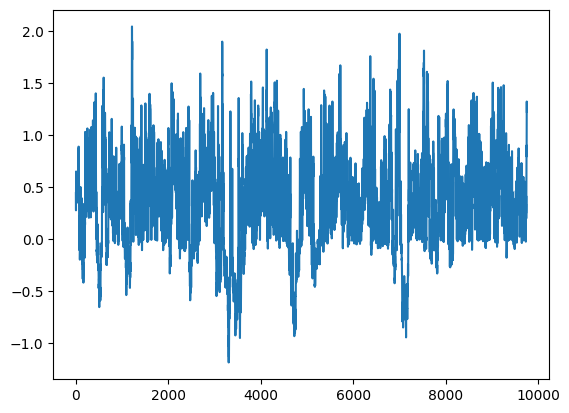

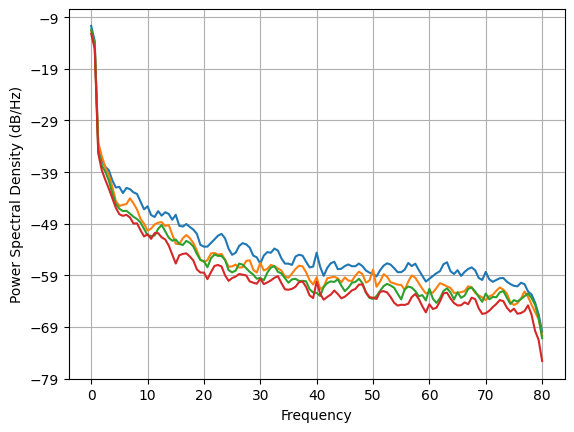

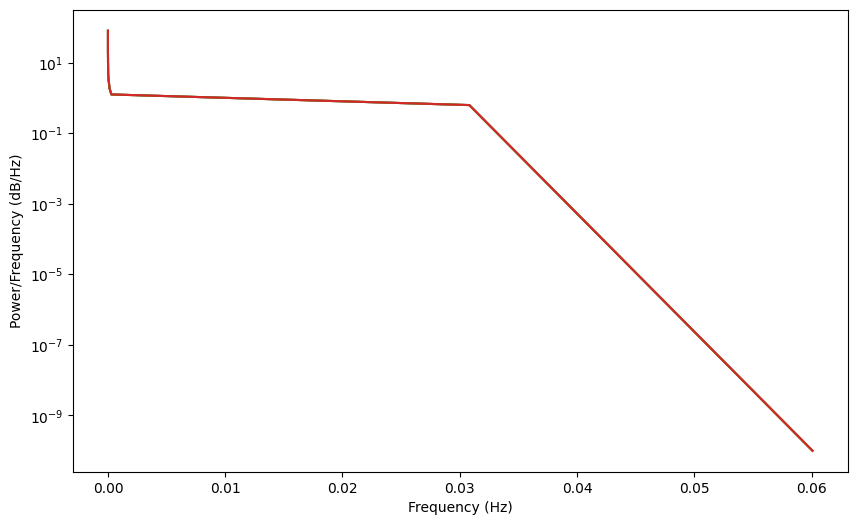

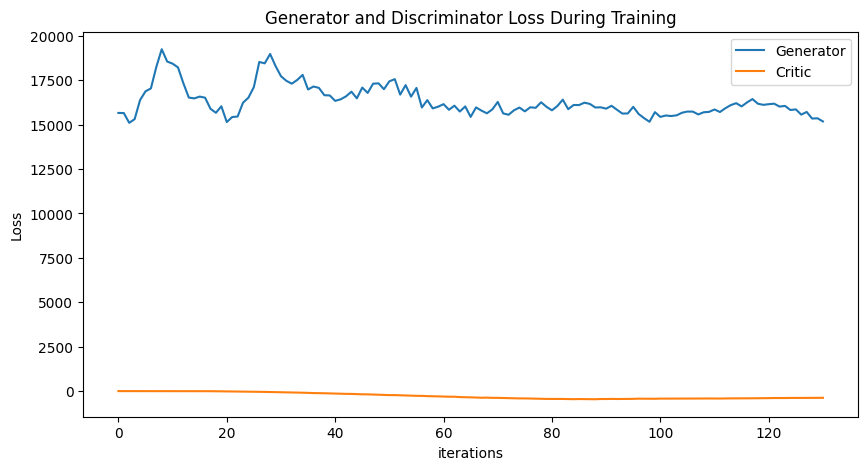

KeyboardInterrupt: 

In [20]:
SPECTRAL_FACTOR = 100
NUM_EPOCHS = 300
PRINT_INTERVAL = 10
BATCH_SIZE = np.shape(training_data_closed)[0]
train_loader = DataLoader(TensorDataset(torch.tensor(training_data_closed).detach()), batch_size=BATCH_SIZE, shuffle=True)

def compute_psd_torch(data, fs, nperseg=256, noverlap=None):
    n_channels, n_samples = data.shape
    psd = np.zeros((n_channels, nperseg // 2 + 1))

    for ch_idx in range(n_channels):
        fft_result = torch.fft.fft(data[ch_idx], n=nperseg // 2 + 1)
        Pxx = torch.abs(fft_result)**2
        psd[ch_idx] = torch.from_numpy(Pxx.detach().numpy() + 1e-10)

    return psd

def compute_psd_loss(real, fake):
    reals, fakes = [], []
    
    for btch in range(np.shape(real)[0]):
        psd_real = compute_psd_torch(real[btch], fs)
        reals.append(psd_real)

    for btch in range(np.shape(fake)[0]):
        psd_fake = compute_psd_torch(fake[btch], fs)
        fakes.append(psd_fake)
    reals, fakes = torch.tensor(reals), torch.tensor(fakes)

    # Normalize each sample independently
    psd_real = F.normalize(reals, p=2, dim=1)
    psd_fake = F.normalize(fakes, p=2, dim=1)

    psd_loss = ((psd_real - psd_fake)**2).mean()  # Check calculated PSD
    return psd_loss

def train():
    critic_err, gen_err, critic_psd_err, gen_psd_err = [], [], [], []
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=1e-5)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=1e-5)

    for epoch in range(NUM_EPOCHS):
        (real, ) = next(iter(train_loader))
        real.requires_grad = True

        for _ in range(5):
            fake = G(sample_normal_distribution(BATCH_SIZE, 200, 305))
            critic_real = D(real).reshape(-1)
            critic_fake = D(fake).reshape(-1)
            D.zero_grad()            
            loss_critic_psd = compute_psd_loss(real.detach(), fake.detach()) * SPECTRAL_FACTOR
            loss_critic = -torch.mean(critic_real) + torch.mean(critic_fake) + (gradient_penalty(D, real, fake) * LAMBDA_GP) + loss_critic_psd
            loss_critic.backward()
            critic_optimizer.step()  

        fake = G(sample_normal_distribution(BATCH_SIZE, 200, 305))
        gen_fake = D(fake).reshape(-1)
        G.zero_grad()
        loss_gen = -torch.mean(gen_fake)
        loss_gen.backward()
        gen_optimizer.step()
        
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())
        critic_psd_err.append(loss_critic_psd.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            print("Epoch %s: Critic PSD error (%s)" % (epoch, critic_psd_err))
            plot_everything(fake, critic_err, gen_err)

    return critic_err, gen_err, fake, D, G

critic_err, gen_err, generated, disc, gen = train()

torch.save(gen, 'generator-v12-2.pt')
torch.save(disc, 'discriminator-v12-2.pt')
np.save('closed-v12-2.npy', generated.detach())
plot_everything(generated, gen_err, critic_err)
generated_data_closed = None

# Spectral loss with peaks at (10,60)

Epoch 0: Critic error ([6.03157683795341]) Generator err ([0.027309909462928772])
Epoch 0: Critic PSD error ([])


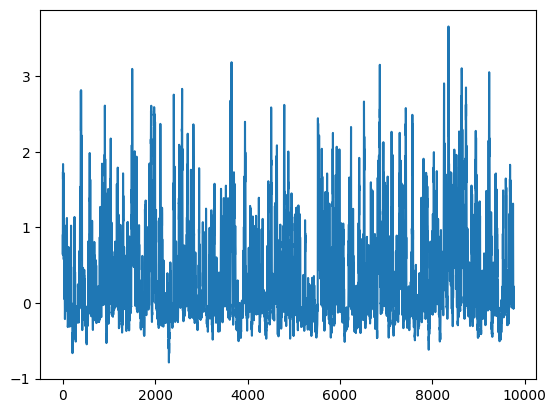

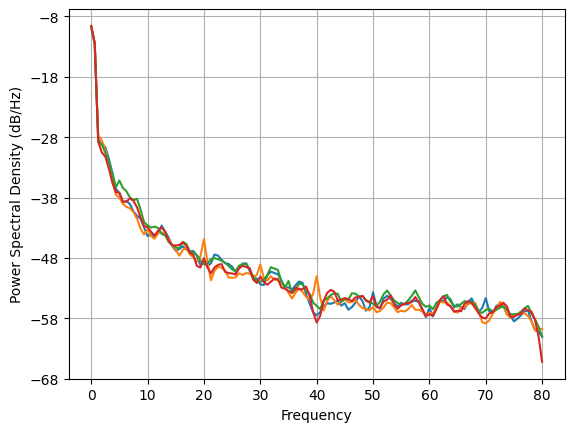

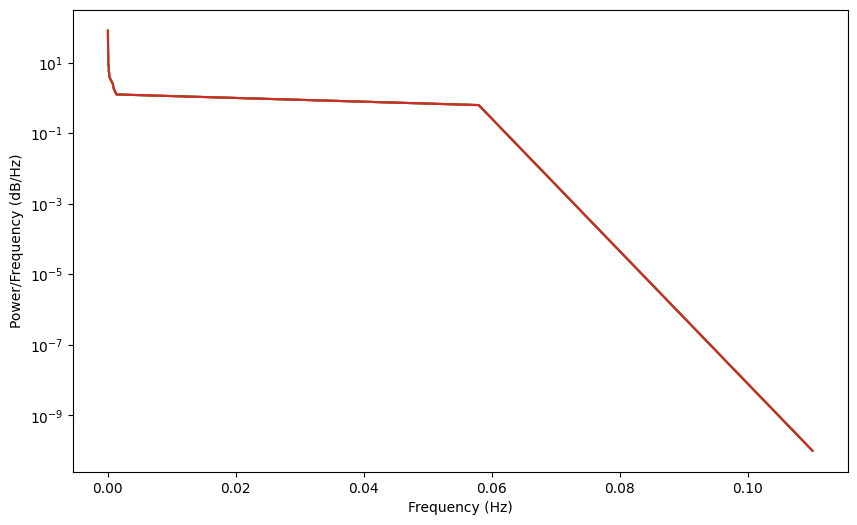

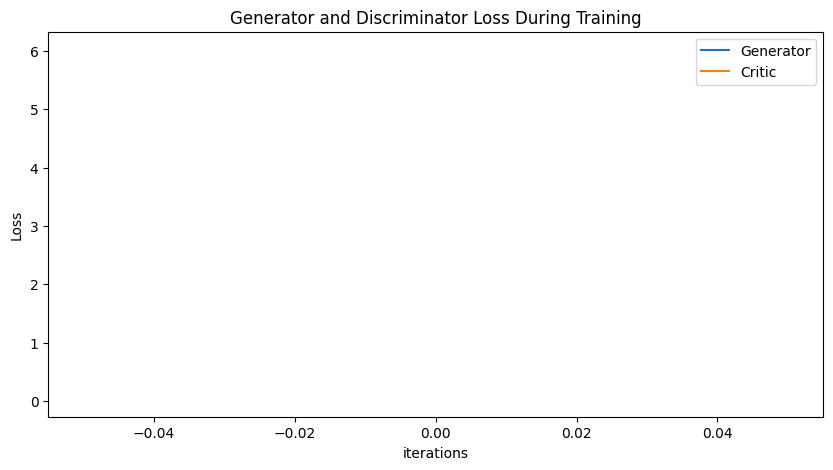

Epoch 10: Critic error ([6.03157683795341, 5.77002010822778, 5.3973092405169645, 4.821762048145038, 3.9745411799774604, 2.896624668084928, 1.947065145772009, 1.2335137552849815, 0.6719422516321178, 0.6233030593095678, 0.5730505680414905]) Generator err ([0.027309909462928772, 0.02915985882282257, 0.03321615606546402, 0.05818821117281914, 0.06641477346420288, 0.12817594408988953, 0.2186703383922577, 0.23722101747989655, 0.37373289465904236, 0.30431362986564636, 0.2658778131008148])
Epoch 10: Critic PSD error ([])


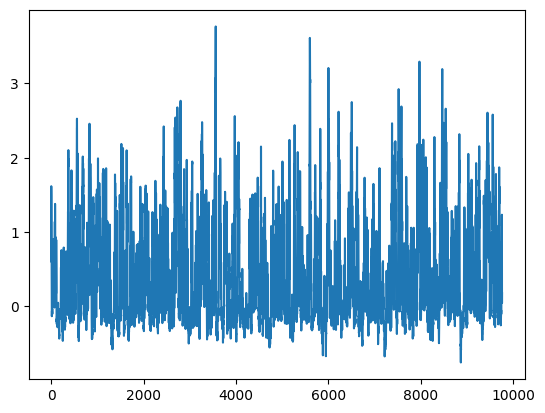

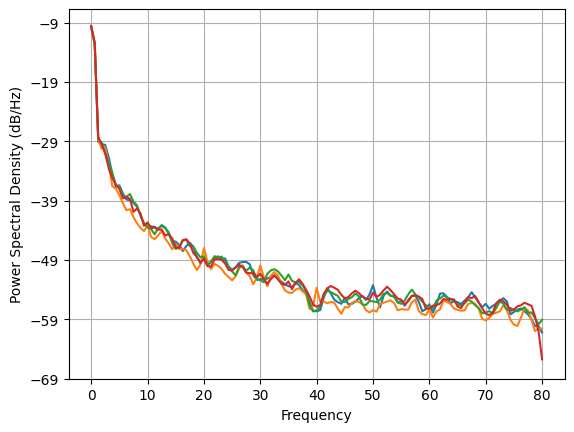

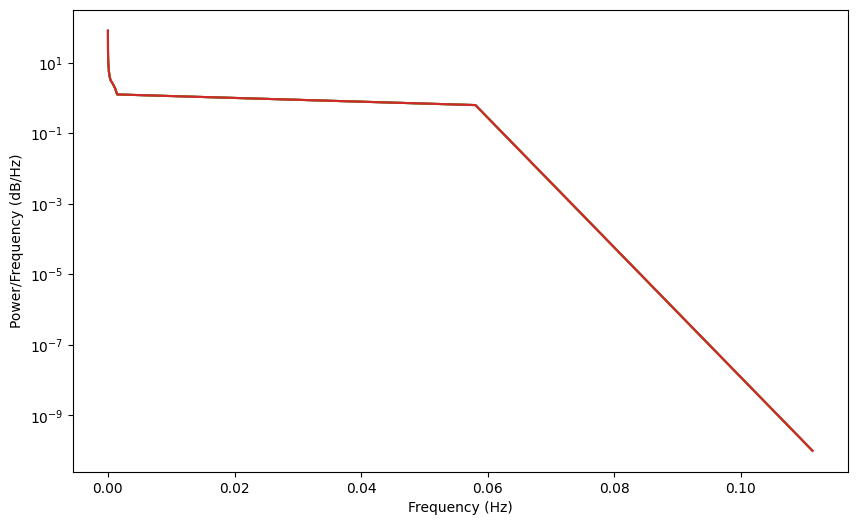

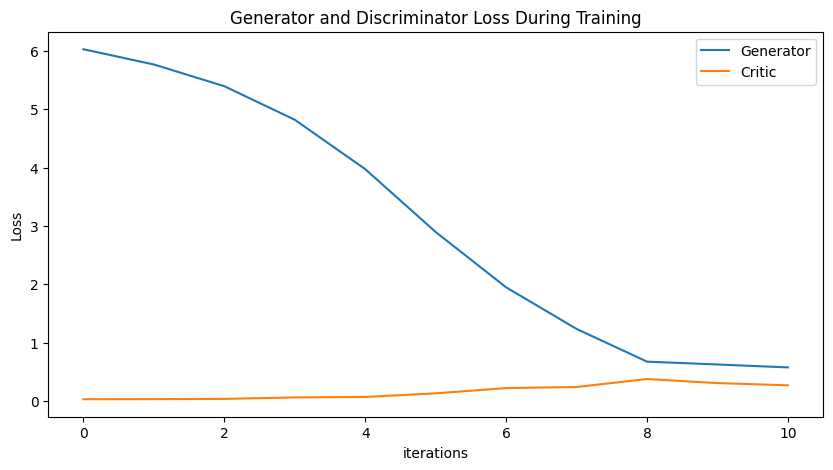

Epoch 20: Critic error ([6.03157683795341, 5.77002010822778, 5.3973092405169645, 4.821762048145038, 3.9745411799774604, 2.896624668084928, 1.947065145772009, 1.2335137552849815, 0.6719422516321178, 0.6233030593095678, 0.5730505680414905, 0.49053316475370146, 0.44497115833931505, 0.29998943318655824, 0.4931004145557981, 0.3339334928029769, 0.40336420004483753, 0.15971796363384871, -0.021404454572920284, -0.27354821710484145, -0.2691690581466001]) Generator err ([0.027309909462928772, 0.02915985882282257, 0.03321615606546402, 0.05818821117281914, 0.06641477346420288, 0.12817594408988953, 0.2186703383922577, 0.23722101747989655, 0.37373289465904236, 0.30431362986564636, 0.2658778131008148, 0.46372660994529724, 0.5195072889328003, 0.626929759979248, 0.5706817507743835, 0.5108670592308044, 0.7161717414855957, 0.7974302172660828, 0.8871410489082336, 1.1741729974746704, 1.5652837753295898])
Epoch 20: Critic PSD error ([])


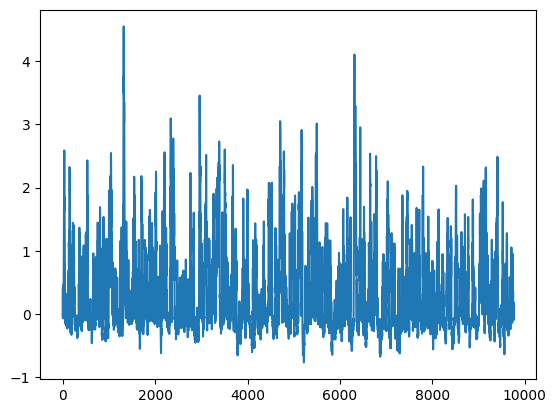

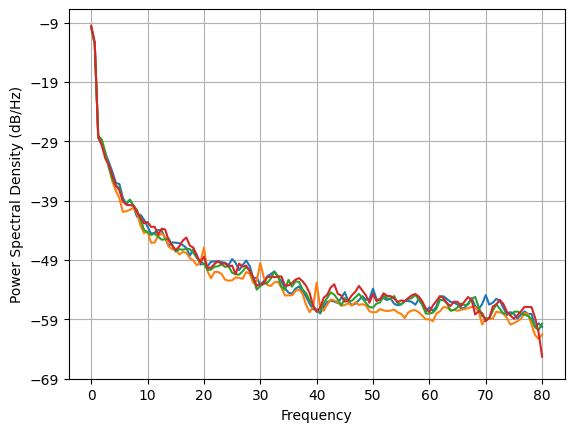

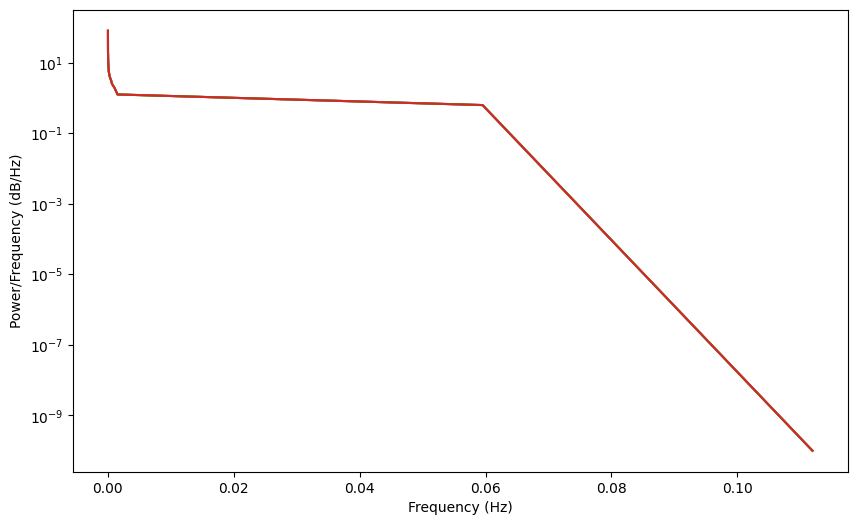

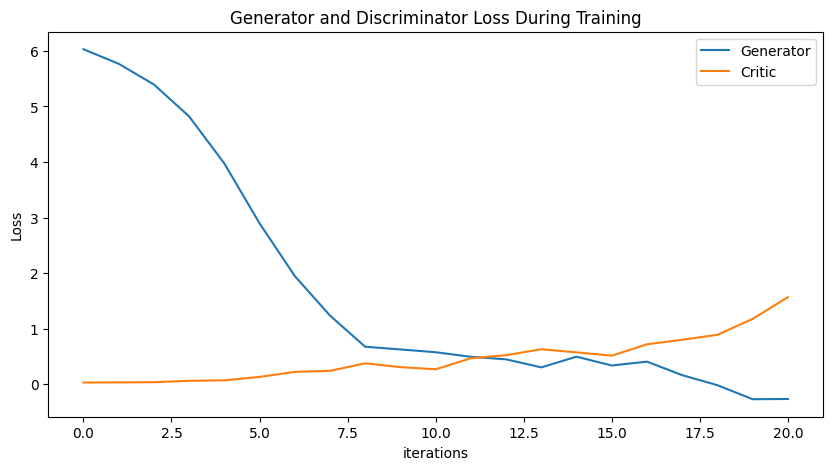

Epoch 30: Critic error ([6.03157683795341, 5.77002010822778, 5.3973092405169645, 4.821762048145038, 3.9745411799774604, 2.896624668084928, 1.947065145772009, 1.2335137552849815, 0.6719422516321178, 0.6233030593095678, 0.5730505680414905, 0.49053316475370146, 0.44497115833931505, 0.29998943318655824, 0.4931004145557981, 0.3339334928029769, 0.40336420004483753, 0.15971796363384871, -0.021404454572920284, -0.27354821710484145, -0.2691690581466001, -0.6714050103564633, -1.136592397789438, -1.7048308285363942, -2.4293943944029026, -3.1175331462713416, -4.04167574866176, -5.082184541621828, -5.852325180952772, -7.147909945903833, -8.073115877564048]) Generator err ([0.027309909462928772, 0.02915985882282257, 0.03321615606546402, 0.05818821117281914, 0.06641477346420288, 0.12817594408988953, 0.2186703383922577, 0.23722101747989655, 0.37373289465904236, 0.30431362986564636, 0.2658778131008148, 0.46372660994529724, 0.5195072889328003, 0.626929759979248, 0.5706817507743835, 0.5108670592308044, 0

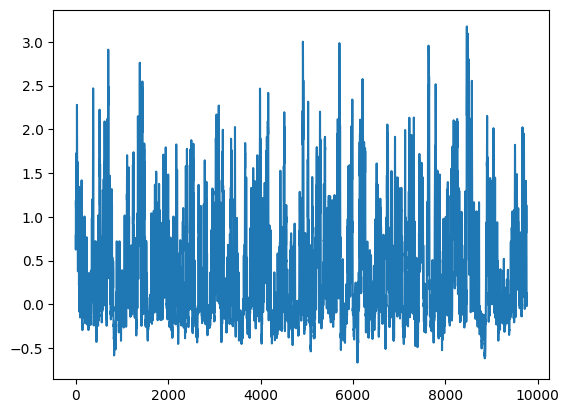

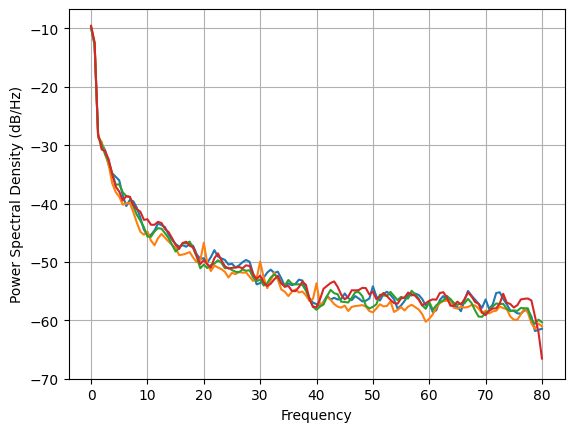

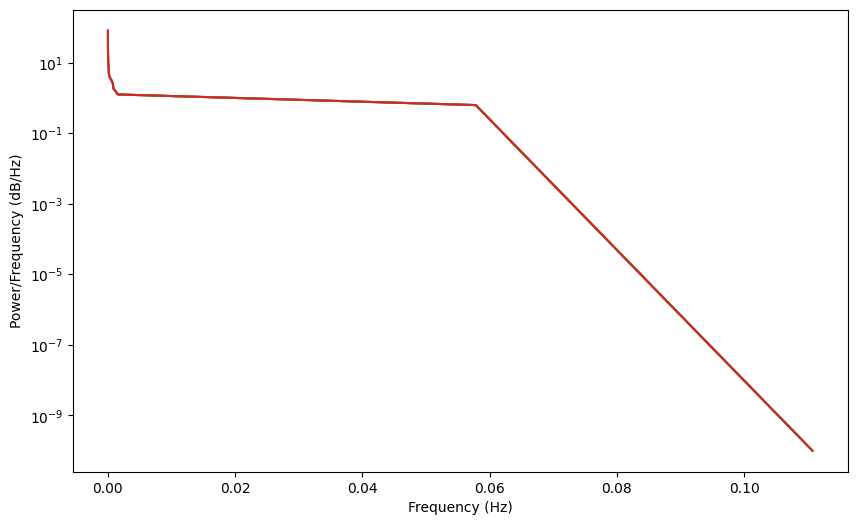

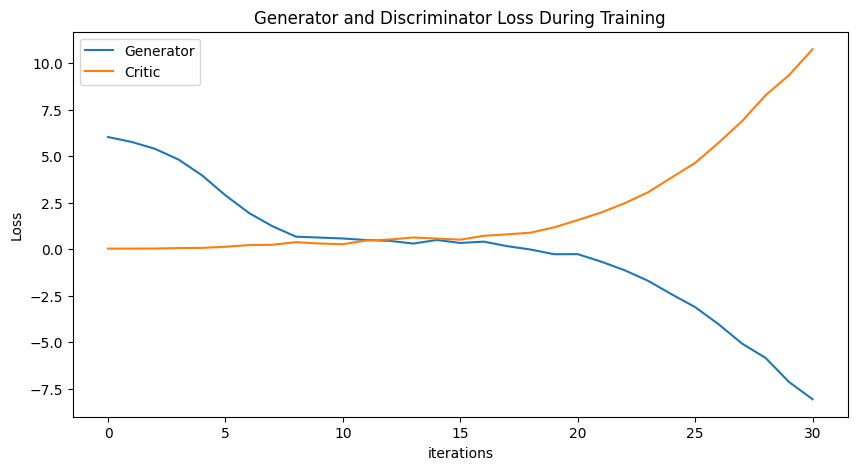

Epoch 40: Critic error ([6.03157683795341, 5.77002010822778, 5.3973092405169645, 4.821762048145038, 3.9745411799774604, 2.896624668084928, 1.947065145772009, 1.2335137552849815, 0.6719422516321178, 0.6233030593095678, 0.5730505680414905, 0.49053316475370146, 0.44497115833931505, 0.29998943318655824, 0.4931004145557981, 0.3339334928029769, 0.40336420004483753, 0.15971796363384871, -0.021404454572920284, -0.27354821710484145, -0.2691690581466001, -0.6714050103564633, -1.136592397789438, -1.7048308285363942, -2.4293943944029026, -3.1175331462713416, -4.04167574866176, -5.082184541621828, -5.852325180952772, -7.147909945903833, -8.073115877564048, -9.366525643195349, -10.409624909496959, -11.039350367076082, -12.290981935613559, -13.806384969795609, -14.818841206893422, -15.752781980310571, -17.026018340257302, -17.881141231102195, -18.50776145330011]) Generator err ([0.027309909462928772, 0.02915985882282257, 0.03321615606546402, 0.05818821117281914, 0.06641477346420288, 0.128175944089889

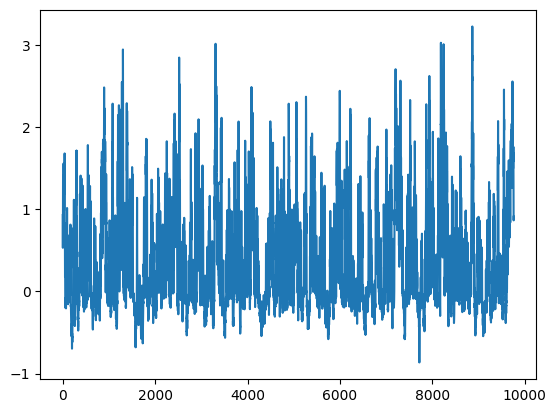

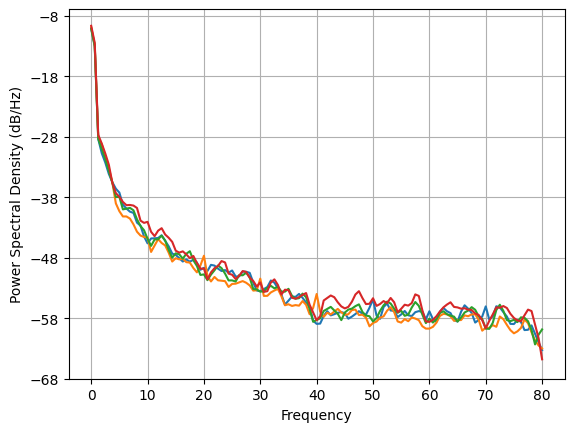

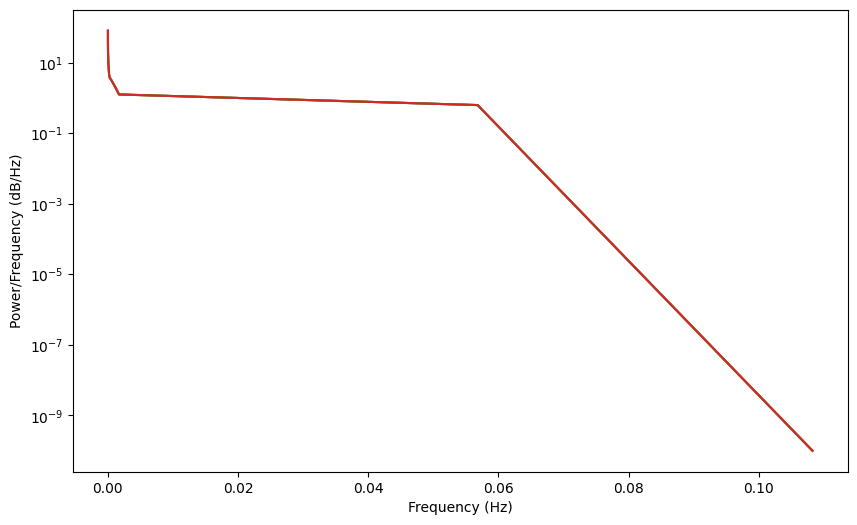

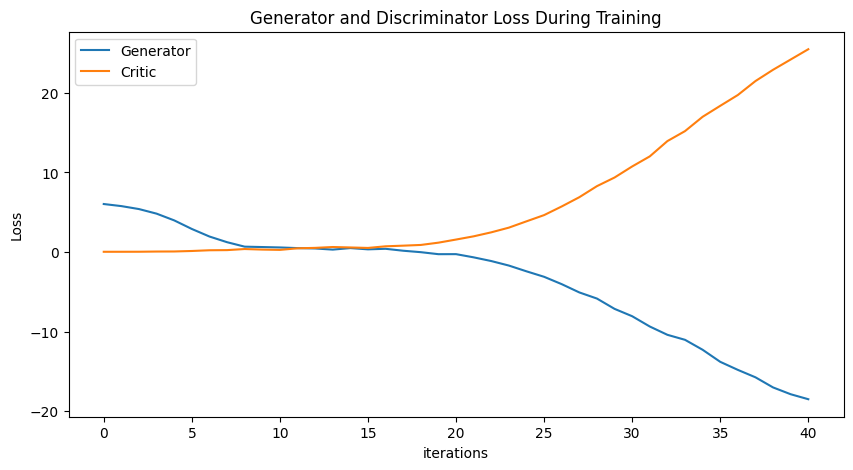

Epoch 50: Critic error ([6.03157683795341, 5.77002010822778, 5.3973092405169645, 4.821762048145038, 3.9745411799774604, 2.896624668084928, 1.947065145772009, 1.2335137552849815, 0.6719422516321178, 0.6233030593095678, 0.5730505680414905, 0.49053316475370146, 0.44497115833931505, 0.29998943318655824, 0.4931004145557981, 0.3339334928029769, 0.40336420004483753, 0.15971796363384871, -0.021404454572920284, -0.27354821710484145, -0.2691690581466001, -0.6714050103564633, -1.136592397789438, -1.7048308285363942, -2.4293943944029026, -3.1175331462713416, -4.04167574866176, -5.082184541621828, -5.852325180952772, -7.147909945903833, -8.073115877564048, -9.366525643195349, -10.409624909496959, -11.039350367076082, -12.290981935613559, -13.806384969795609, -14.818841206893422, -15.752781980310571, -17.026018340257302, -17.881141231102195, -18.50776145330011, -19.502199544683336, -20.05153717820207, -22.41164267345048, -21.373551363787175, -23.680565205677826, -23.15875913086945, -24.4547716542267

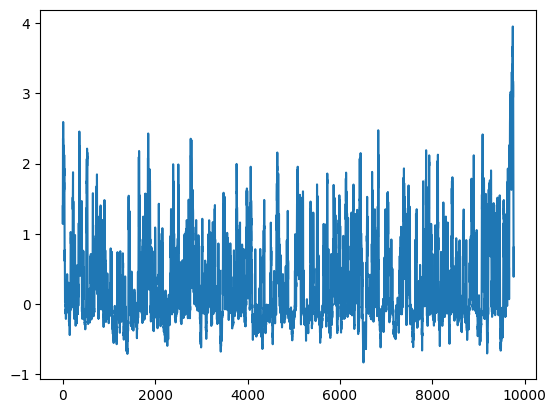

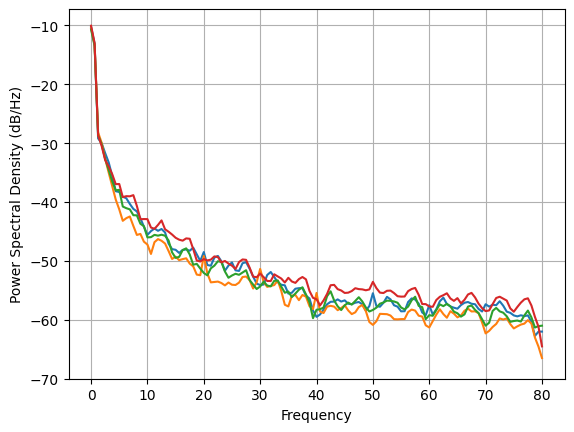

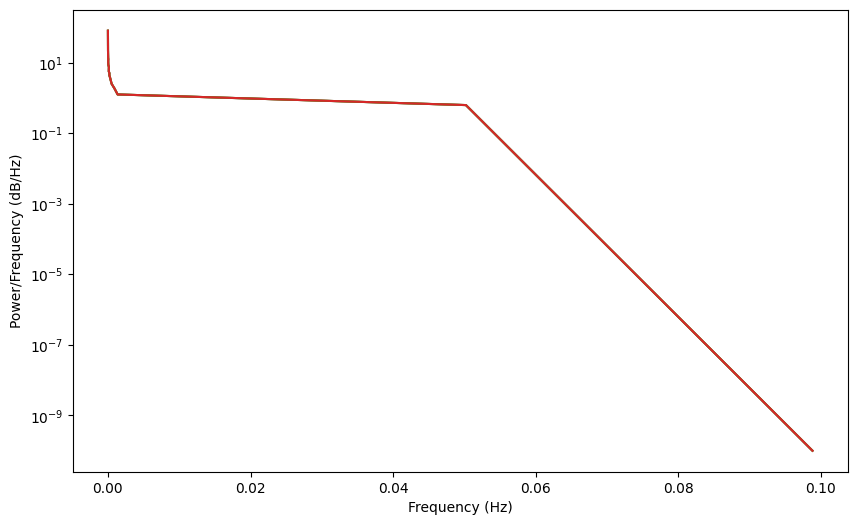

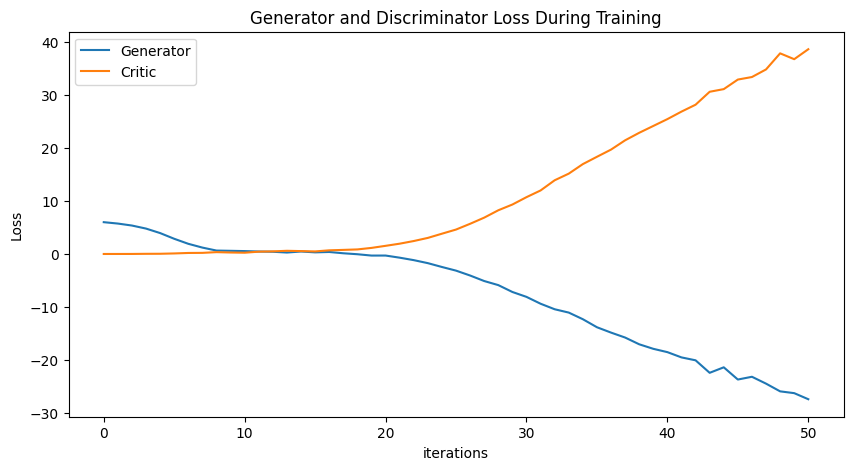

Epoch 60: Critic error ([6.03157683795341, 5.77002010822778, 5.3973092405169645, 4.821762048145038, 3.9745411799774604, 2.896624668084928, 1.947065145772009, 1.2335137552849815, 0.6719422516321178, 0.6233030593095678, 0.5730505680414905, 0.49053316475370146, 0.44497115833931505, 0.29998943318655824, 0.4931004145557981, 0.3339334928029769, 0.40336420004483753, 0.15971796363384871, -0.021404454572920284, -0.27354821710484145, -0.2691690581466001, -0.6714050103564633, -1.136592397789438, -1.7048308285363942, -2.4293943944029026, -3.1175331462713416, -4.04167574866176, -5.082184541621828, -5.852325180952772, -7.147909945903833, -8.073115877564048, -9.366525643195349, -10.409624909496959, -11.039350367076082, -12.290981935613559, -13.806384969795609, -14.818841206893422, -15.752781980310571, -17.026018340257302, -17.881141231102195, -18.50776145330011, -19.502199544683336, -20.05153717820207, -22.41164267345048, -21.373551363787175, -23.680565205677826, -23.15875913086945, -24.4547716542267

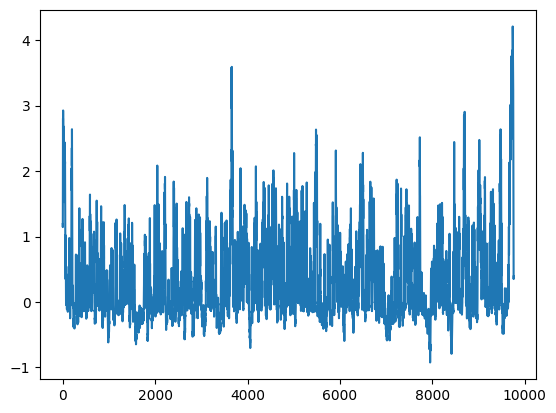

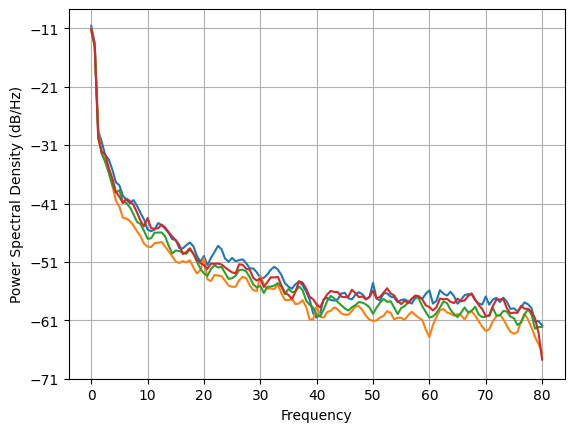

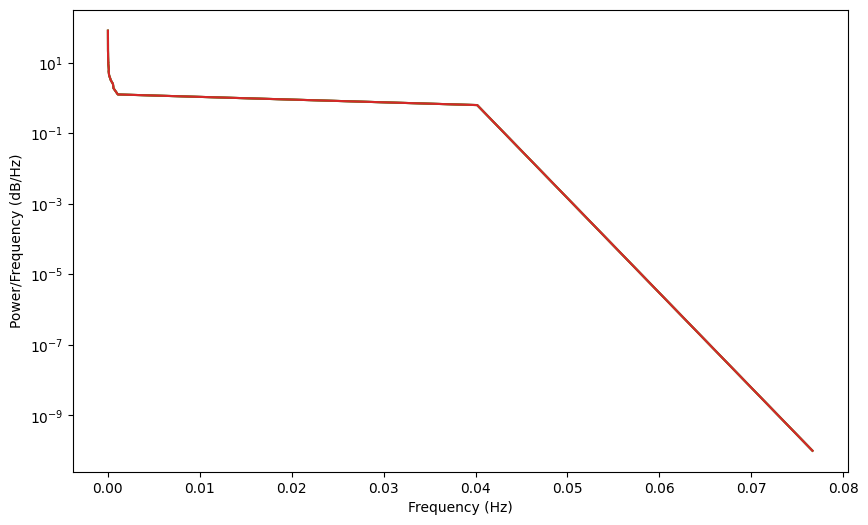

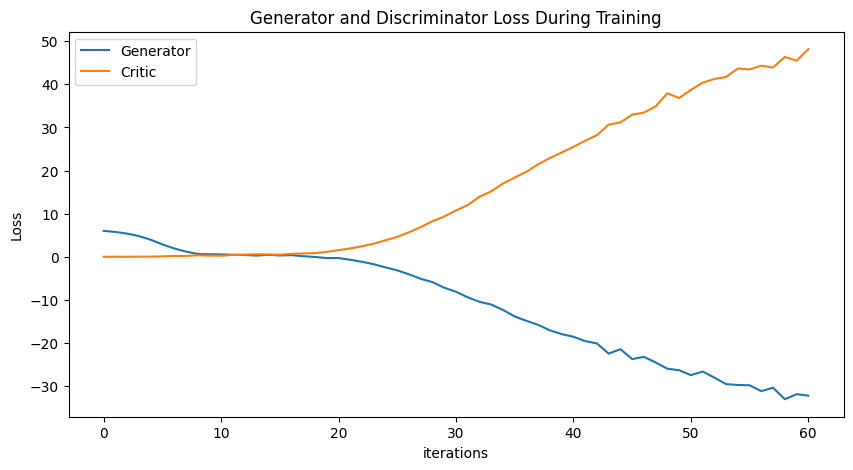

Epoch 70: Critic error ([6.03157683795341, 5.77002010822778, 5.3973092405169645, 4.821762048145038, 3.9745411799774604, 2.896624668084928, 1.947065145772009, 1.2335137552849815, 0.6719422516321178, 0.6233030593095678, 0.5730505680414905, 0.49053316475370146, 0.44497115833931505, 0.29998943318655824, 0.4931004145557981, 0.3339334928029769, 0.40336420004483753, 0.15971796363384871, -0.021404454572920284, -0.27354821710484145, -0.2691690581466001, -0.6714050103564633, -1.136592397789438, -1.7048308285363942, -2.4293943944029026, -3.1175331462713416, -4.04167574866176, -5.082184541621828, -5.852325180952772, -7.147909945903833, -8.073115877564048, -9.366525643195349, -10.409624909496959, -11.039350367076082, -12.290981935613559, -13.806384969795609, -14.818841206893422, -15.752781980310571, -17.026018340257302, -17.881141231102195, -18.50776145330011, -19.502199544683336, -20.05153717820207, -22.41164267345048, -21.373551363787175, -23.680565205677826, -23.15875913086945, -24.4547716542267

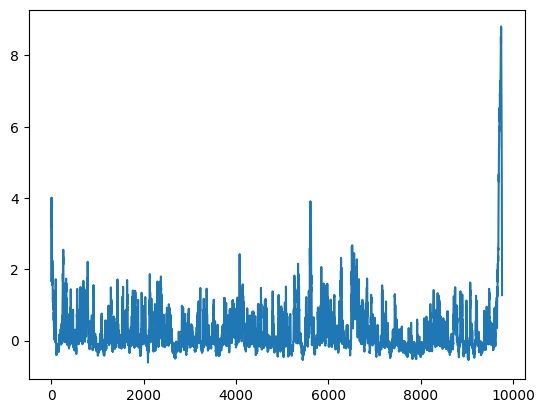

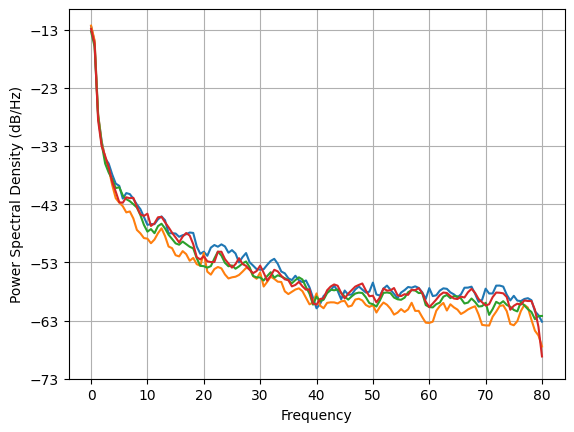

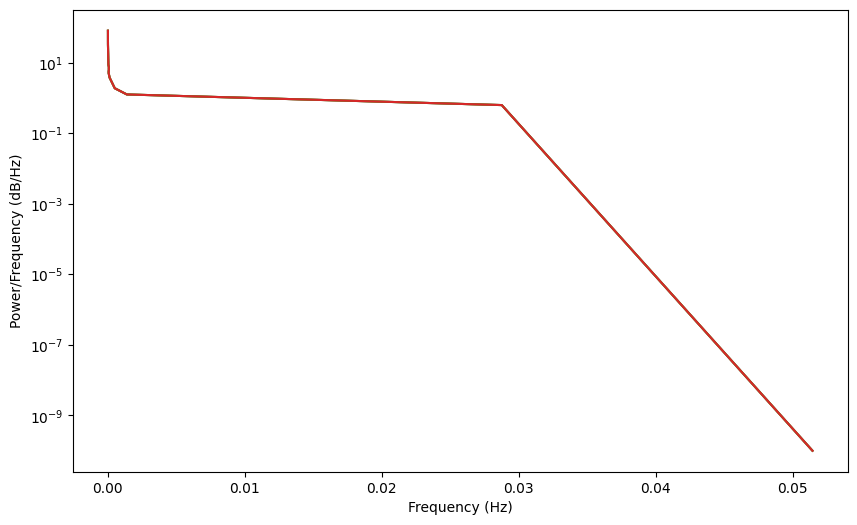

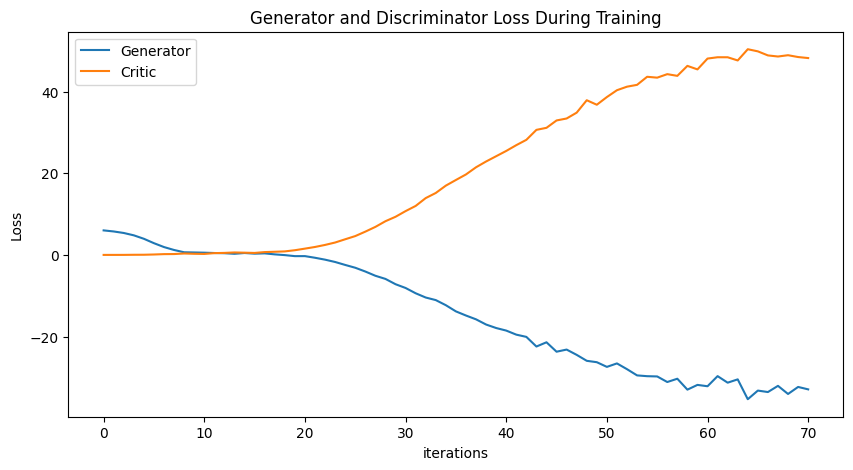

Epoch 80: Critic error ([6.03157683795341, 5.77002010822778, 5.3973092405169645, 4.821762048145038, 3.9745411799774604, 2.896624668084928, 1.947065145772009, 1.2335137552849815, 0.6719422516321178, 0.6233030593095678, 0.5730505680414905, 0.49053316475370146, 0.44497115833931505, 0.29998943318655824, 0.4931004145557981, 0.3339334928029769, 0.40336420004483753, 0.15971796363384871, -0.021404454572920284, -0.27354821710484145, -0.2691690581466001, -0.6714050103564633, -1.136592397789438, -1.7048308285363942, -2.4293943944029026, -3.1175331462713416, -4.04167574866176, -5.082184541621828, -5.852325180952772, -7.147909945903833, -8.073115877564048, -9.366525643195349, -10.409624909496959, -11.039350367076082, -12.290981935613559, -13.806384969795609, -14.818841206893422, -15.752781980310571, -17.026018340257302, -17.881141231102195, -18.50776145330011, -19.502199544683336, -20.05153717820207, -22.41164267345048, -21.373551363787175, -23.680565205677826, -23.15875913086945, -24.4547716542267

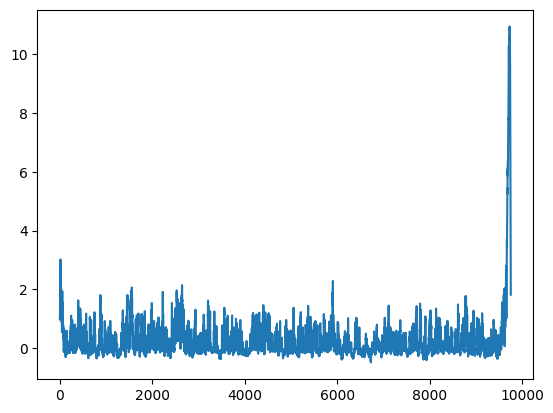

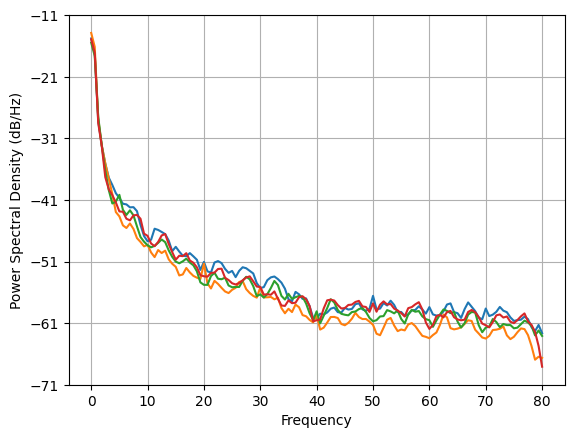

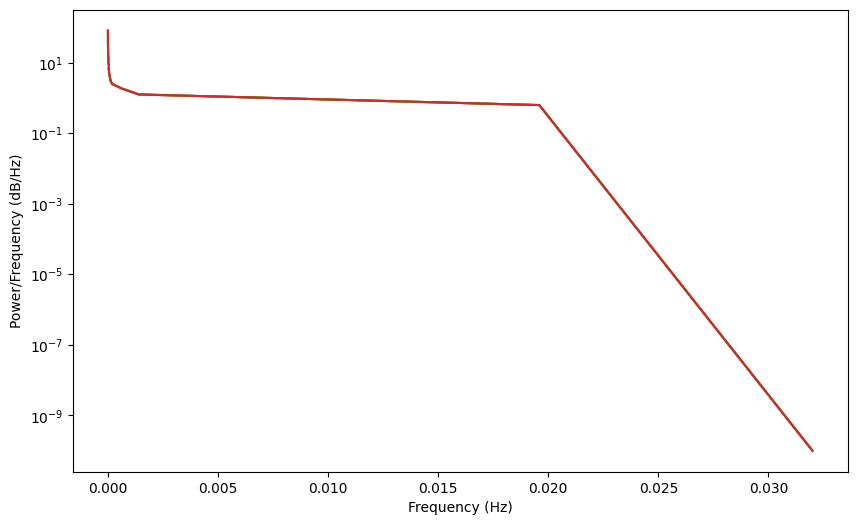

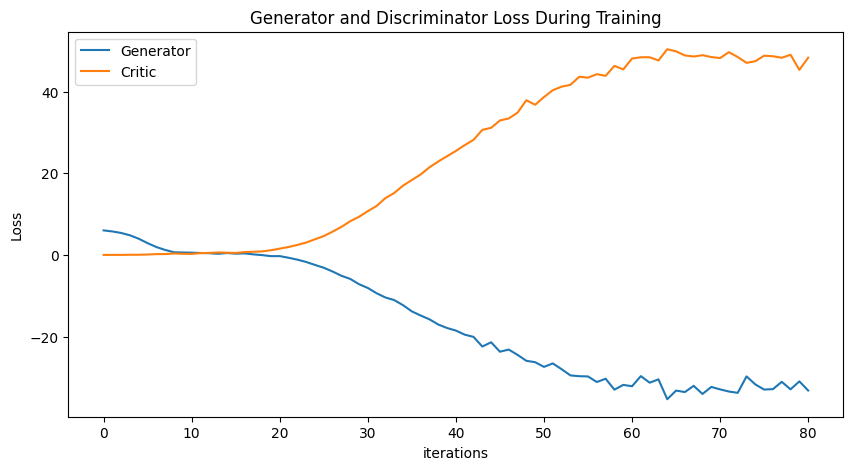

Epoch 90: Critic error ([6.03157683795341, 5.77002010822778, 5.3973092405169645, 4.821762048145038, 3.9745411799774604, 2.896624668084928, 1.947065145772009, 1.2335137552849815, 0.6719422516321178, 0.6233030593095678, 0.5730505680414905, 0.49053316475370146, 0.44497115833931505, 0.29998943318655824, 0.4931004145557981, 0.3339334928029769, 0.40336420004483753, 0.15971796363384871, -0.021404454572920284, -0.27354821710484145, -0.2691690581466001, -0.6714050103564633, -1.136592397789438, -1.7048308285363942, -2.4293943944029026, -3.1175331462713416, -4.04167574866176, -5.082184541621828, -5.852325180952772, -7.147909945903833, -8.073115877564048, -9.366525643195349, -10.409624909496959, -11.039350367076082, -12.290981935613559, -13.806384969795609, -14.818841206893422, -15.752781980310571, -17.026018340257302, -17.881141231102195, -18.50776145330011, -19.502199544683336, -20.05153717820207, -22.41164267345048, -21.373551363787175, -23.680565205677826, -23.15875913086945, -24.4547716542267

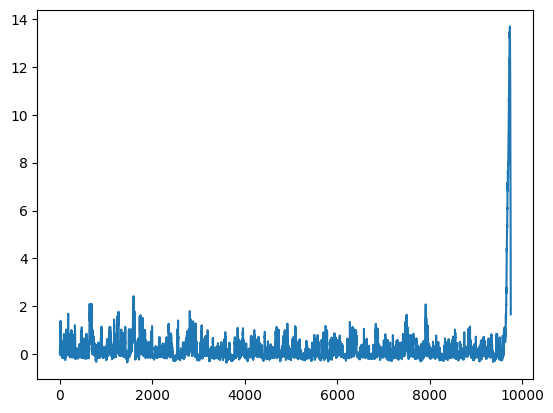

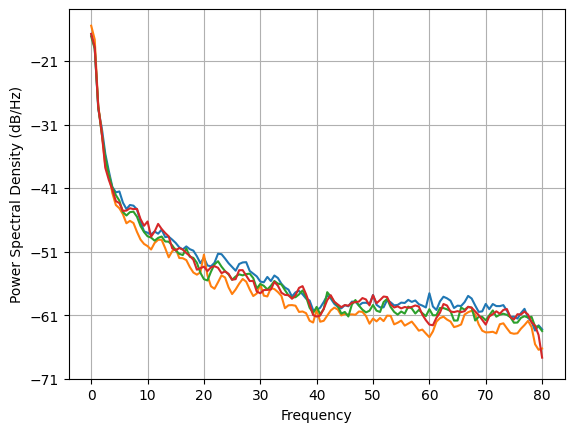

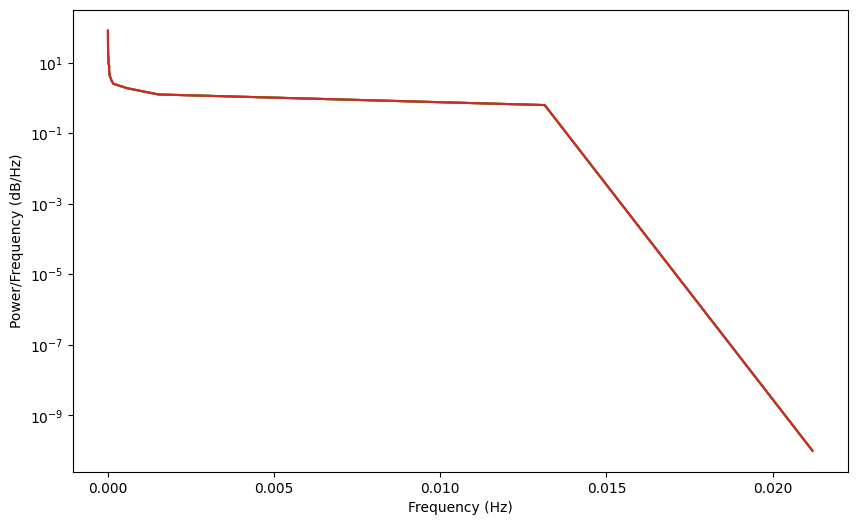

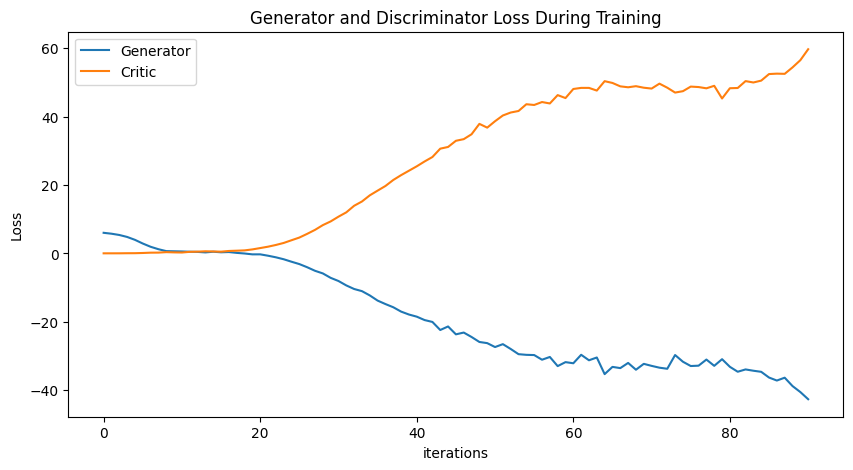

Epoch 100: Critic error ([6.03157683795341, 5.77002010822778, 5.3973092405169645, 4.821762048145038, 3.9745411799774604, 2.896624668084928, 1.947065145772009, 1.2335137552849815, 0.6719422516321178, 0.6233030593095678, 0.5730505680414905, 0.49053316475370146, 0.44497115833931505, 0.29998943318655824, 0.4931004145557981, 0.3339334928029769, 0.40336420004483753, 0.15971796363384871, -0.021404454572920284, -0.27354821710484145, -0.2691690581466001, -0.6714050103564633, -1.136592397789438, -1.7048308285363942, -2.4293943944029026, -3.1175331462713416, -4.04167574866176, -5.082184541621828, -5.852325180952772, -7.147909945903833, -8.073115877564048, -9.366525643195349, -10.409624909496959, -11.039350367076082, -12.290981935613559, -13.806384969795609, -14.818841206893422, -15.752781980310571, -17.026018340257302, -17.881141231102195, -18.50776145330011, -19.502199544683336, -20.05153717820207, -22.41164267345048, -21.373551363787175, -23.680565205677826, -23.15875913086945, -24.454771654226

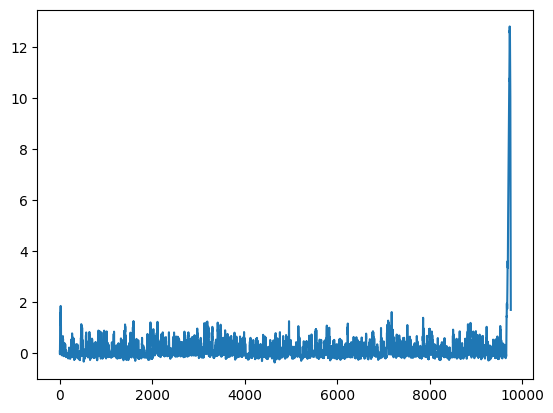

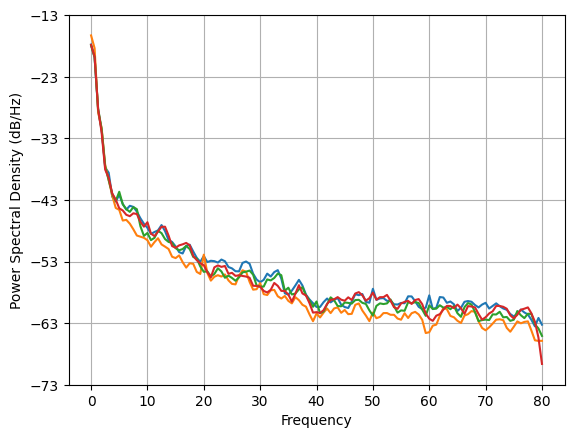

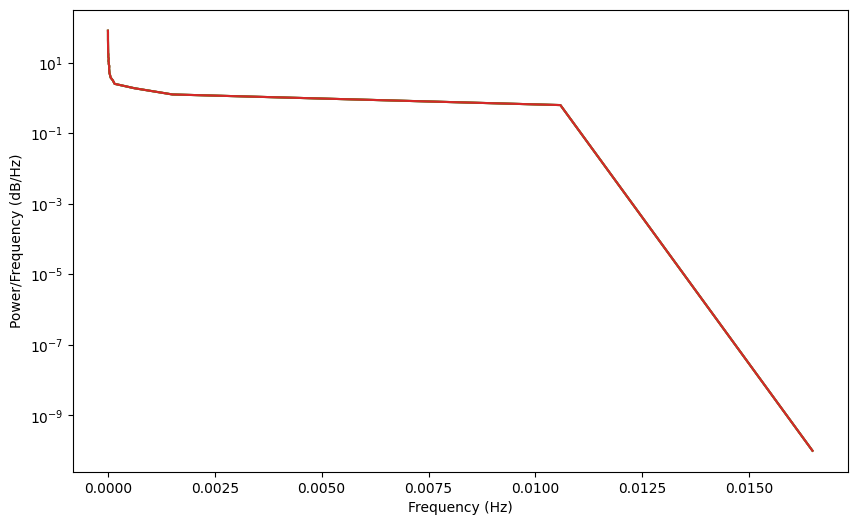

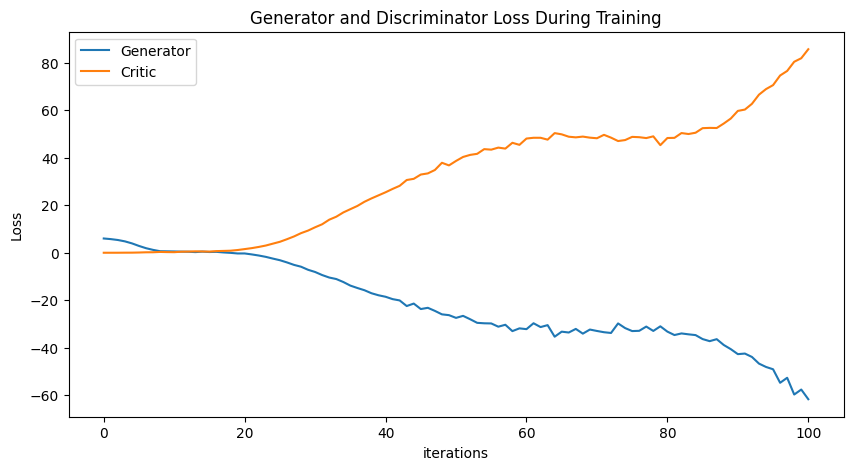

Epoch 110: Critic error ([6.03157683795341, 5.77002010822778, 5.3973092405169645, 4.821762048145038, 3.9745411799774604, 2.896624668084928, 1.947065145772009, 1.2335137552849815, 0.6719422516321178, 0.6233030593095678, 0.5730505680414905, 0.49053316475370146, 0.44497115833931505, 0.29998943318655824, 0.4931004145557981, 0.3339334928029769, 0.40336420004483753, 0.15971796363384871, -0.021404454572920284, -0.27354821710484145, -0.2691690581466001, -0.6714050103564633, -1.136592397789438, -1.7048308285363942, -2.4293943944029026, -3.1175331462713416, -4.04167574866176, -5.082184541621828, -5.852325180952772, -7.147909945903833, -8.073115877564048, -9.366525643195349, -10.409624909496959, -11.039350367076082, -12.290981935613559, -13.806384969795609, -14.818841206893422, -15.752781980310571, -17.026018340257302, -17.881141231102195, -18.50776145330011, -19.502199544683336, -20.05153717820207, -22.41164267345048, -21.373551363787175, -23.680565205677826, -23.15875913086945, -24.454771654226

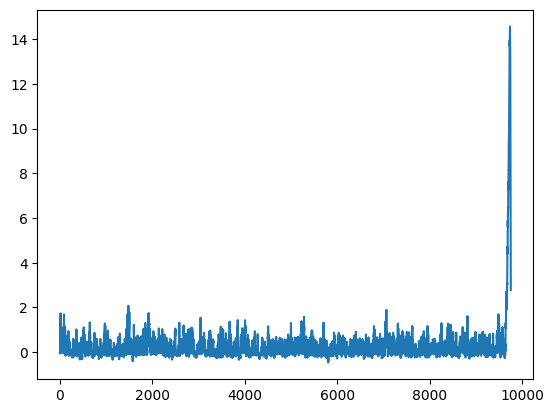

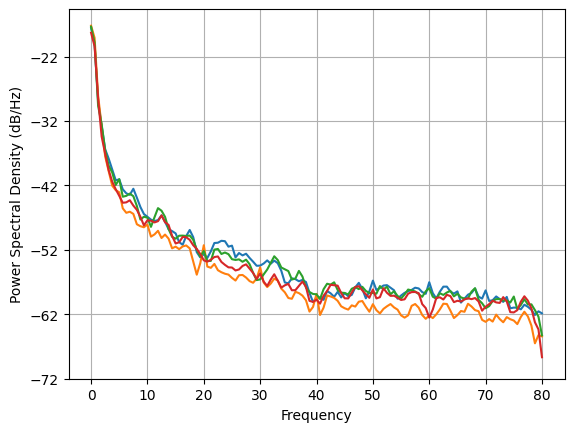

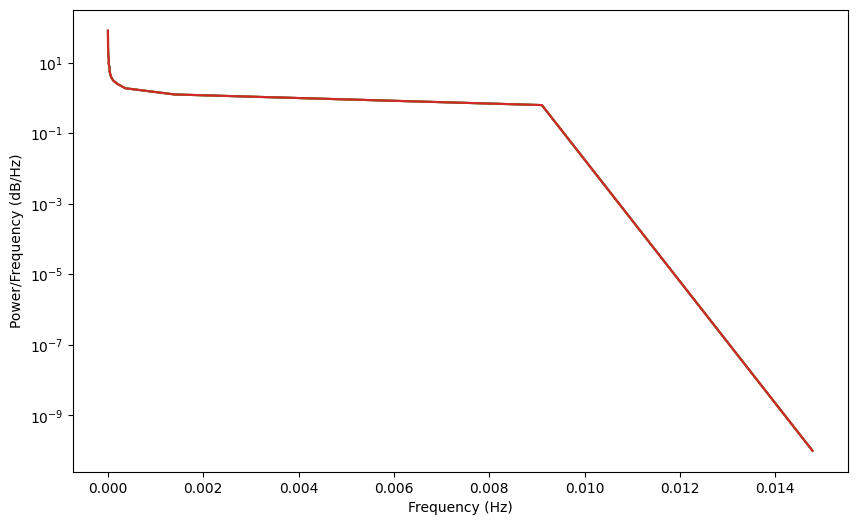

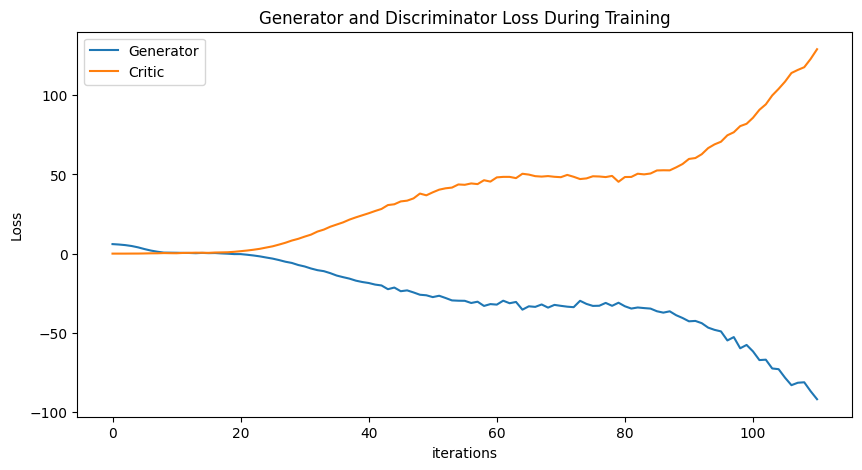

KeyboardInterrupt: 

In [22]:
SPECTRAL_FACTOR = 10000
NUM_EPOCHS = 300
PRINT_INTERVAL = 10
BATCH_SIZE = np.shape(training_data_closed)[0]
train_loader = DataLoader(TensorDataset(torch.tensor(training_data_closed).detach()), batch_size=BATCH_SIZE, shuffle=True)

def compute_psd_only(data, fs, nperseg=256, noverlap=None):
    n_channels, n_samples = data.shape
    psd = np.zeros((n_channels, nperseg // 2 + 1))

    for ch_idx in range(n_channels):
        f, Pxx = welch(data[ch_idx], fs=fs, nperseg=nperseg, noverlap=noverlap)
        psd[ch_idx] = Pxx + 1e-10

    return f, psd

def compute_custom_psd_loss(real, fake, peak_frequencies, fs, nperseg=256, noverlap=None, window='hann', scaling='spectrum'):
    real = real.detach().numpy()
    fake = fake.detach().numpy()
    reals, fakes = [], []

    for btch in range(np.shape(real)[0]):
        _, psd_real = compute_psd_only(real[btch], fs)
        reals.append(psd_real)

    for btch in range(np.shape(fake)[0]):
        _, psd_fake = compute_psd_only(fake[btch], fs)
        fakes.append(psd_fake)
    
    reals, fakes = np.asarray(reals), np.asarray(fakes)

    loss = 0
    for peak_freq in peak_frequencies:
        real_peak = reals[:, :, peak_freq]
        fake_peak = fakes[:, :, peak_freq]
        loss += (real_peak - fake_peak) ** 2

    return torch.tensor(loss.mean(), requires_grad=True)

def train():
    critic_err, gen_err, critic_psd_err, gen_psd_err = [], [], [], []
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=1e-5)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=1e-5)

    for epoch in range(NUM_EPOCHS):
        (real, ) = next(iter(train_loader))
        real.requires_grad = True

        for _ in range(5):
            fake = G(sample_normal_distribution(BATCH_SIZE, 200, 305))
            critic_real = D(real).reshape(-1)
            critic_fake = D(fake).reshape(-1)
            D.zero_grad()            
            loss_critic_psd = compute_custom_psd_loss(real, fake, [10, 60], fs) * SPECTRAL_FACTOR
            loss_critic = -torch.mean(critic_real) + torch.mean(critic_fake) + (gradient_penalty(D, real, fake) * LAMBDA_GP) + loss_critic_psd
            loss_critic.backward()
            critic_optimizer.step()  

        fake = G(sample_normal_distribution(BATCH_SIZE, 200, 305))
        gen_fake = D(fake).reshape(-1)
        G.zero_grad()
        loss_gen = -torch.mean(gen_fake)
        loss_gen.backward()
        gen_optimizer.step()
        
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())
        gen_psd_err.append(loss_critic_psd.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            print("Epoch %s: Critic PSD error (%s)" % (epoch, critic_psd_err))
            plot_everything(fake, critic_err, gen_err)

    return critic_err, gen_err, fake, D, G

critic_err, gen_err, generated, disc, gen = train()

torch.save(gen, 'generator-v12-3.pt')
torch.save(disc, 'discriminator-v12-3.pt')
np.save('closed-v12-3.npy', generated.detach())
plot_everything(generated, gen_err, critic_err)
generated_data_closed = None

# spectral loss D only 

Epoch 0: Critic error ([96.86462854824721]) Generator err ([0.048225123435258865])
Epoch 0: Critic PSD error ([91.93984330827921])


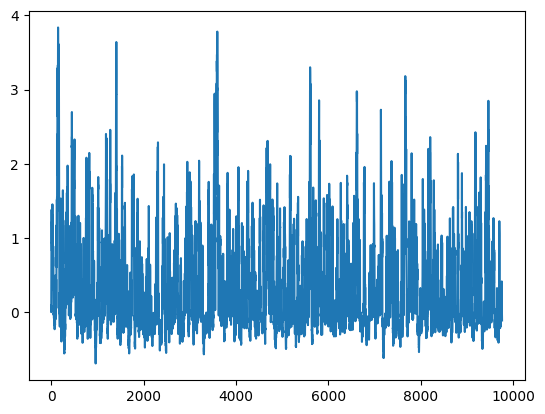

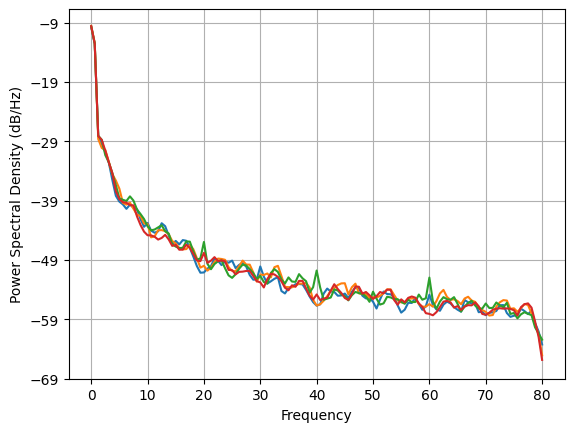

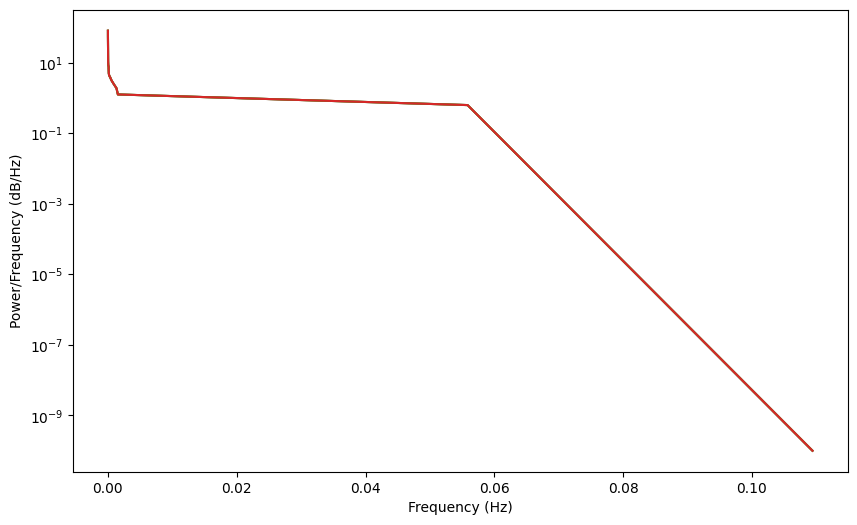

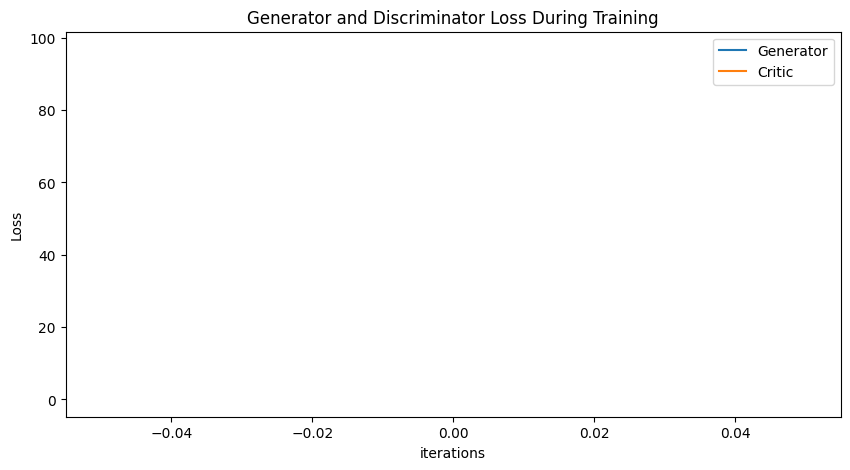

Epoch 10: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213]) Generator err ([0.048225123435258865, 0.04633868485689163, 0.04880393669009209, 0.04588530957698822, 0.0433887355029583, 0.07038581371307373, 0.08480928838253021, 0.06331487745046616, 0.030431196093559265, 0.08376716077327728, -0.006731769070029259])
Epoch 10: Critic PSD error ([91.93984330827921, 91.84535361664999, 91.66624142845885, 91.96109613648603, 91.76528902306629, 91.73652598918375, 92.05687392952697, 91.77637532216842, 91.99357945222289, 92.04595095997418, 92.25719367723956])


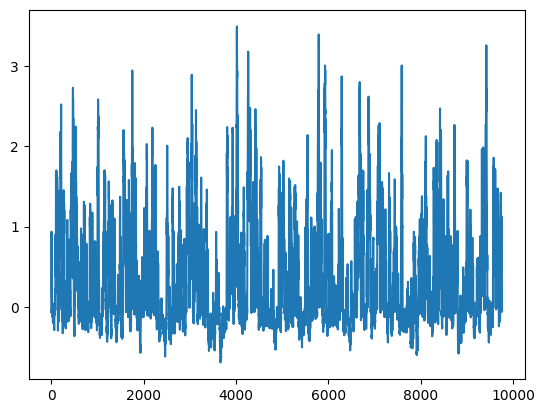

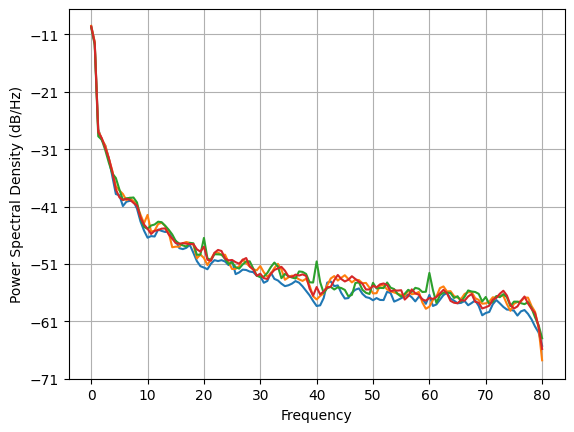

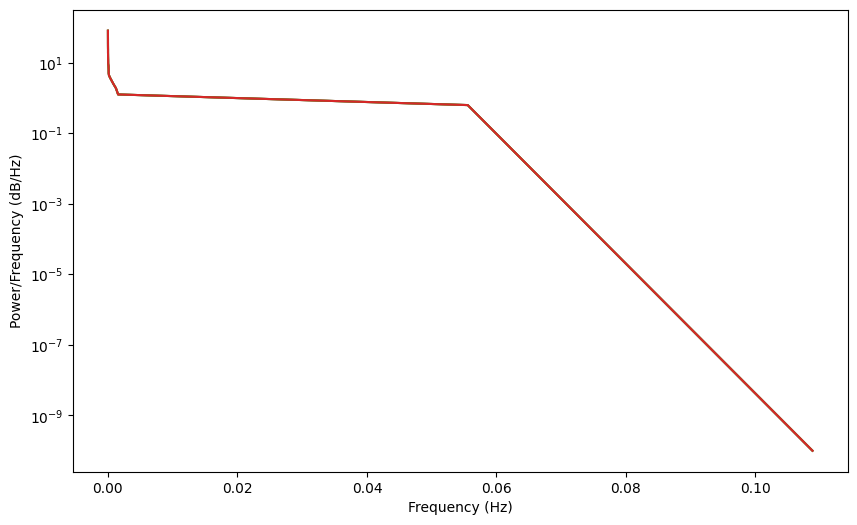

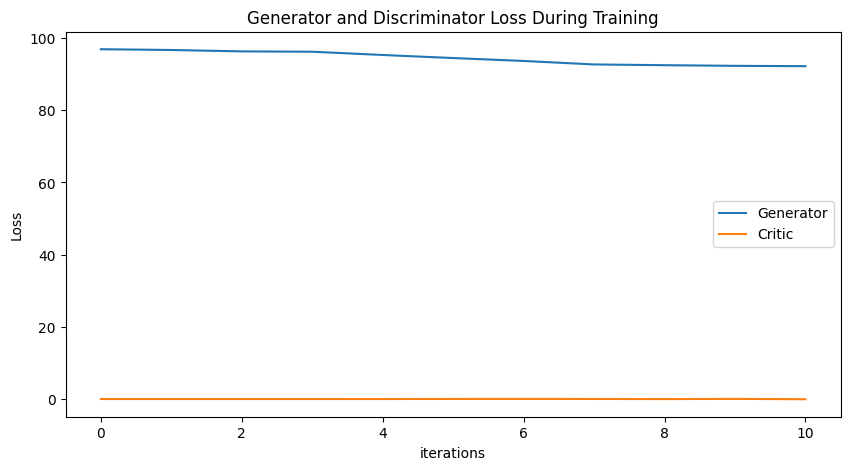

Epoch 20: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714]) Generator err ([0.048225123435258865, 0.04633868485689163, 0.04880393669009209, 0.04588530957698822, 0.0433887355029583, 0.07038581371307373, 0.08480928838253021, 0.06331487745046616, 0.030431196093559265, 0.08376716077327728, -0.006731769070029259, 0.138789102435112, 0.07536906003952026, 0.31024760007858276, 0.23845481872558594, 0.32770025730133057, 0.3740100860595703, 0.4028090536594391, 0.5912843942642212, 0.566059947013855, 0.6496019959449768])
Epoch 20: Critic PSD error ([91.93984330827921, 91.84535361664999, 91.66624142845885, 91.96109613648603, 91.76528902306629, 9

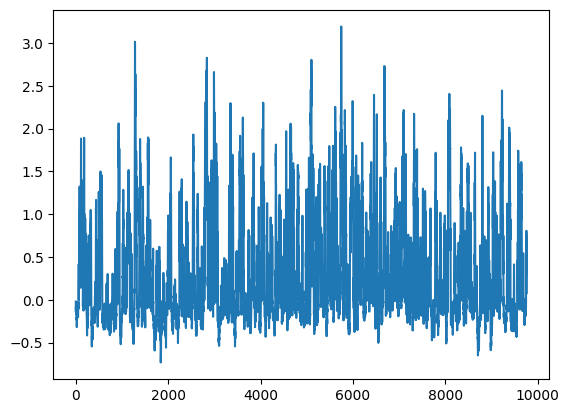

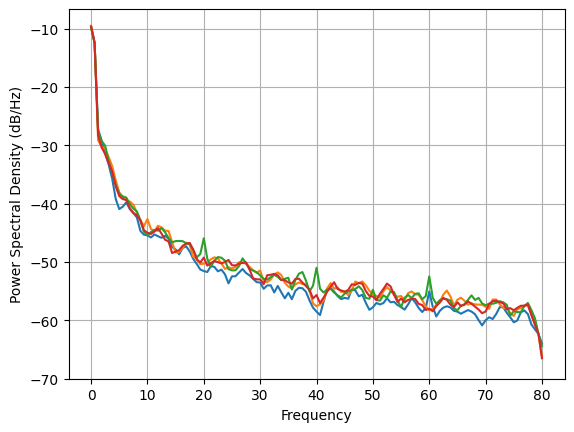

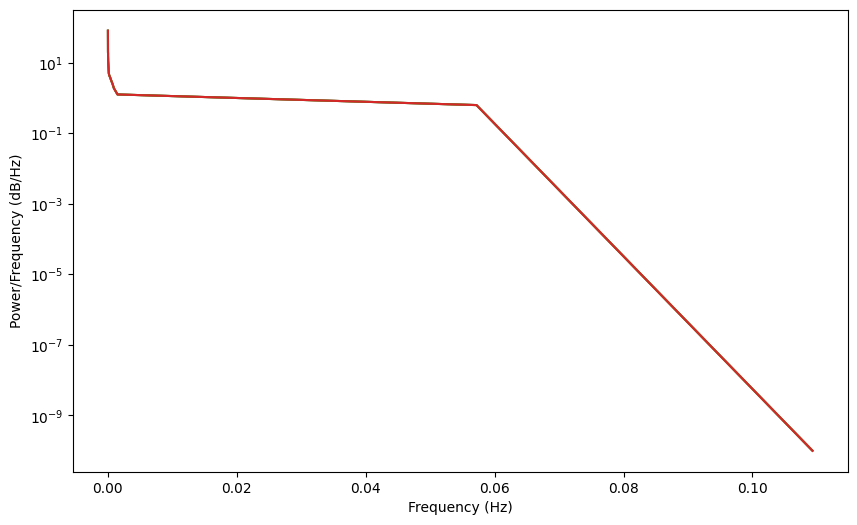

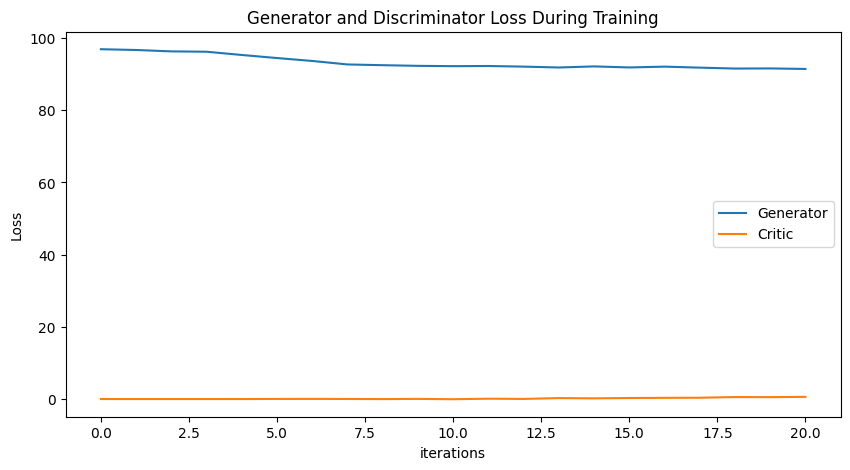

Epoch 30: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541]) Generator err ([0.048225123435258865, 0.04633868485689163, 0.04880393669009209, 0.04588530957698822, 0.0433887355029583, 0.07038581371307373, 0.08480928838253021, 0.06331487745046616, 0.030431196093559265, 0.08376716077327728, -0.006731769070029259, 0.138789102435112, 0.07536906003952026, 0.31024760007858276, 0.23845481872558594, 0.32770025730133057, 0.3740100860595703, 0.4028090536594

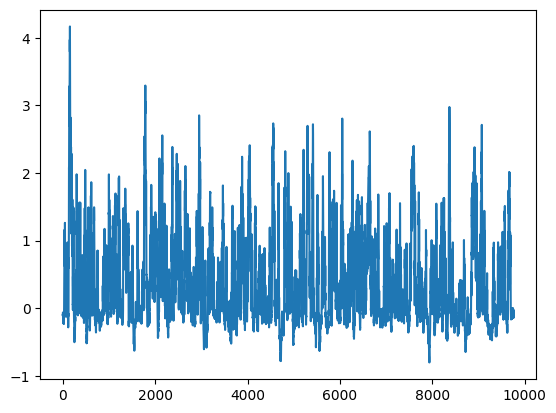

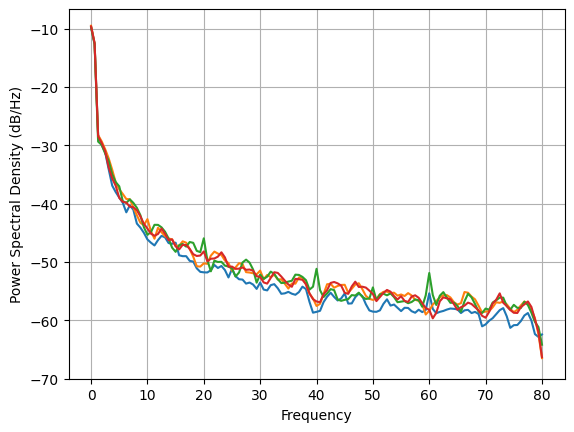

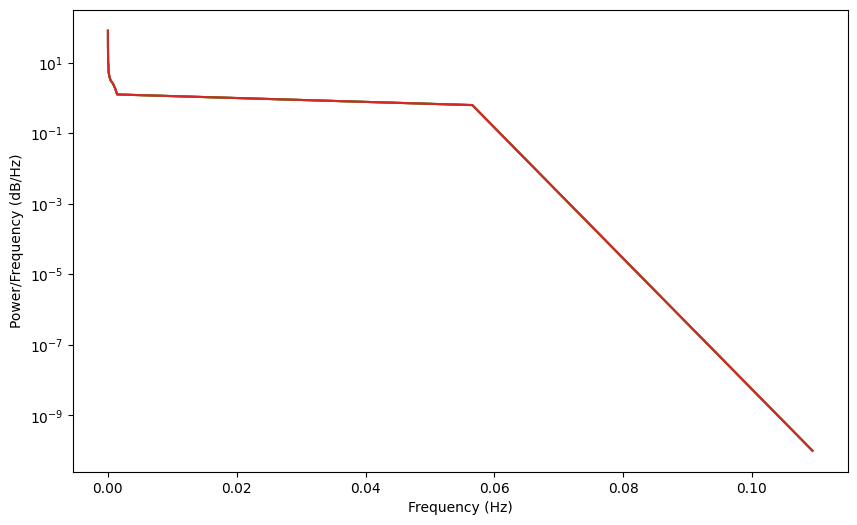

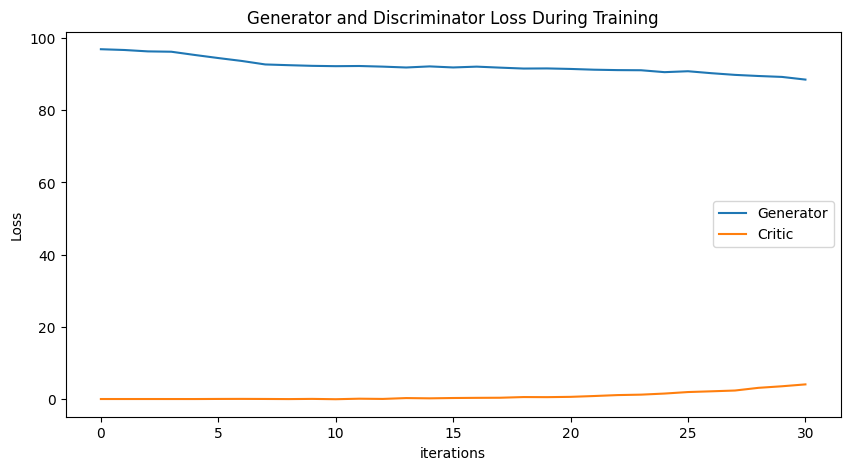

Epoch 40: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773]) Generator err ([0.048225123435258865, 0.04633868485689163, 0.04880393669009209, 0.04588530957698822, 0.0433887355029583, 0.07038581371307373, 0.08480928838253021, 0.06331487745046616, 0.0304311960935

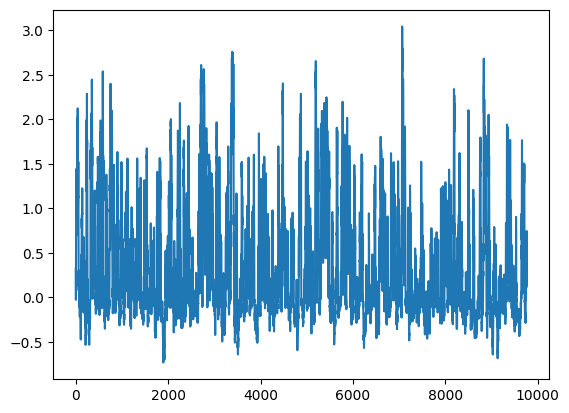

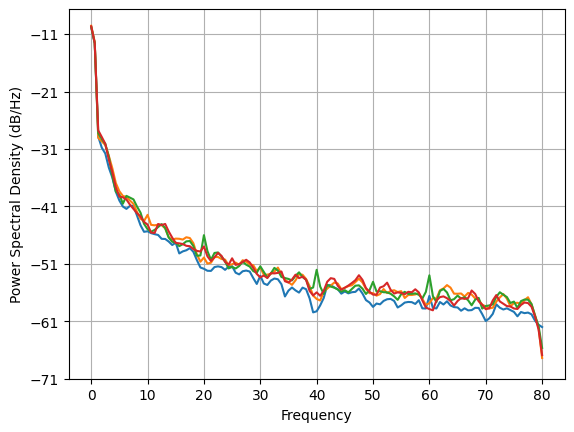

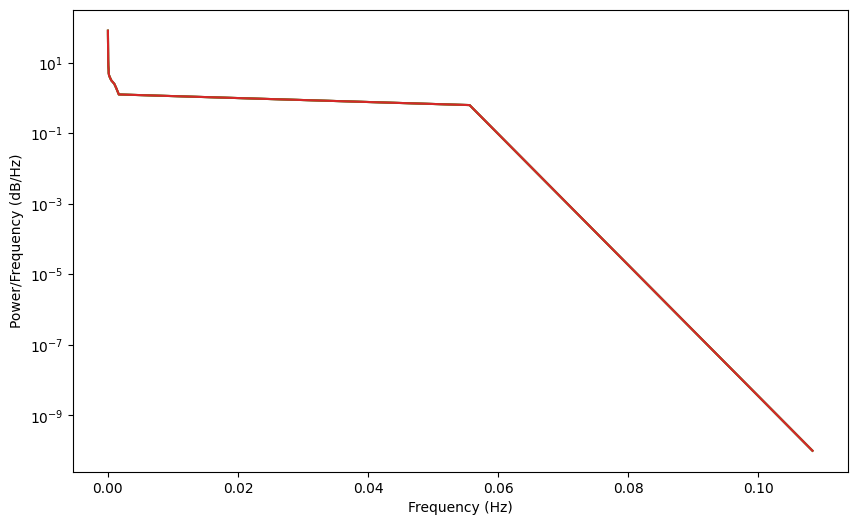

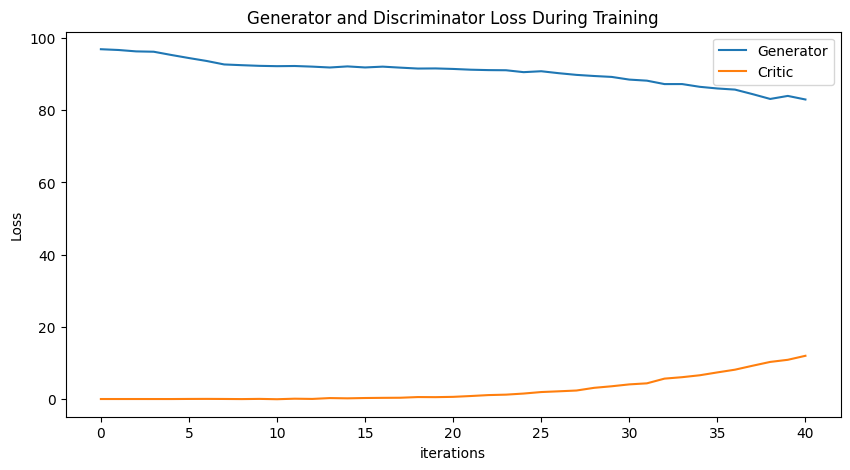

Epoch 50: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773, 82.25526164812705, 81.38276101953132, 81.21200563738562, 80.32065489581929, 80.10492062614026, 79.87244067135327, 78.72124140068613, 78.3403255342713, 78.91964494373053, 76.41211552339244]) Generator 

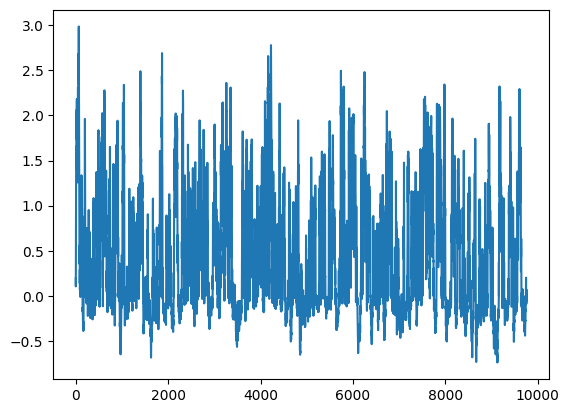

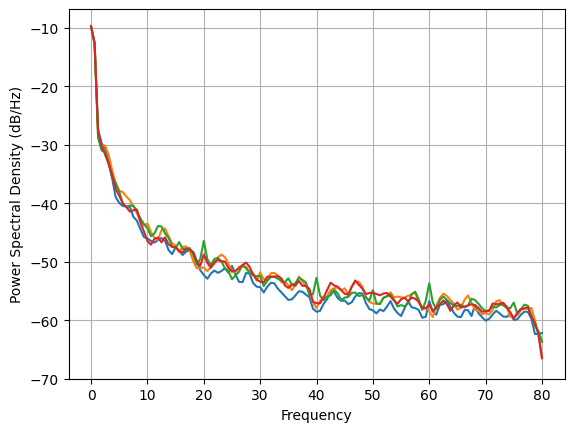

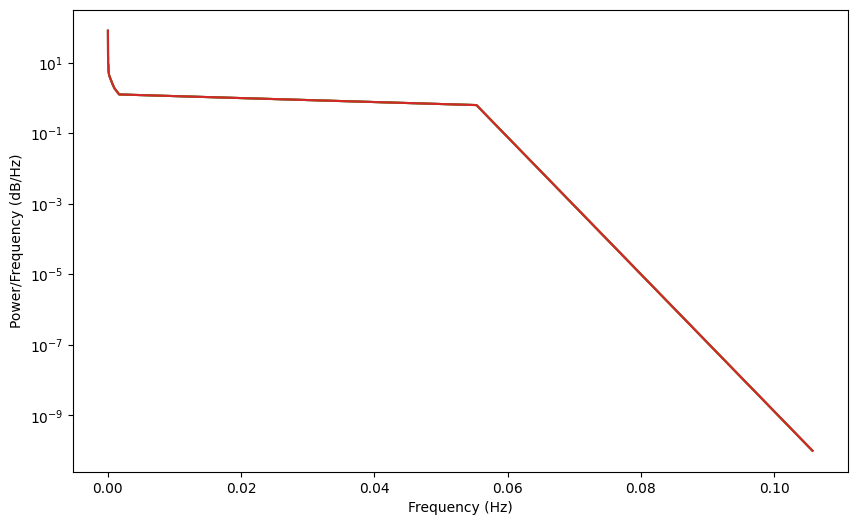

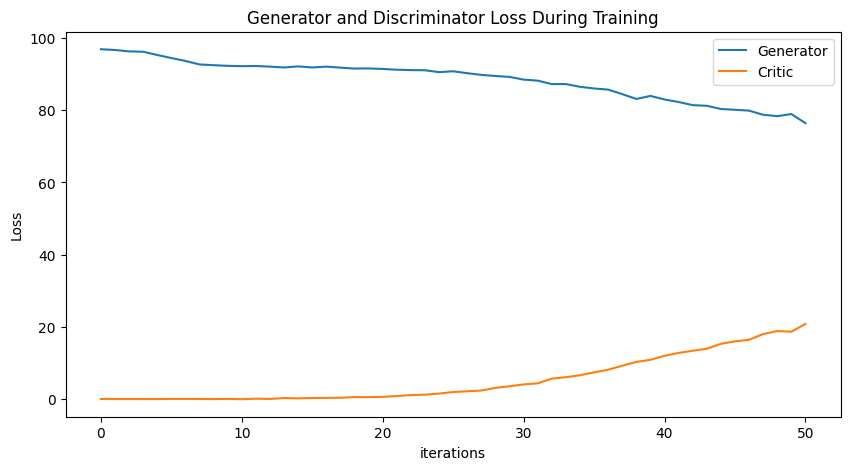

Epoch 60: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773, 82.25526164812705, 81.38276101953132, 81.21200563738562, 80.32065489581929, 80.10492062614026, 79.87244067135327, 78.72124140068613, 78.3403255342713, 78.91964494373053, 76.41211552339244, 76.81067797

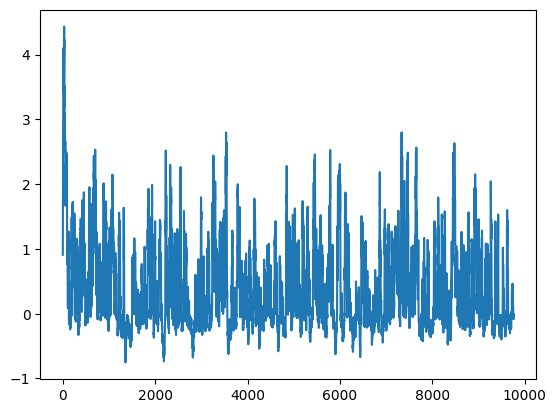

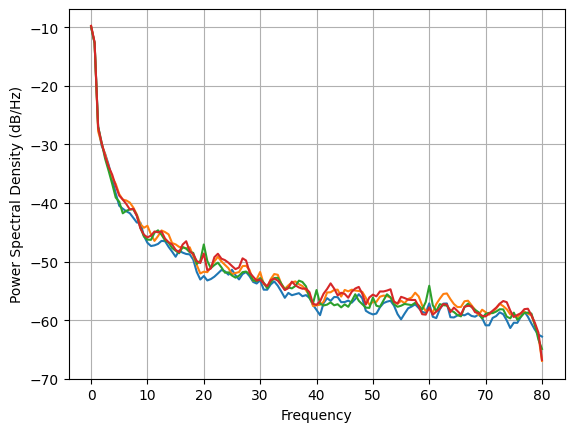

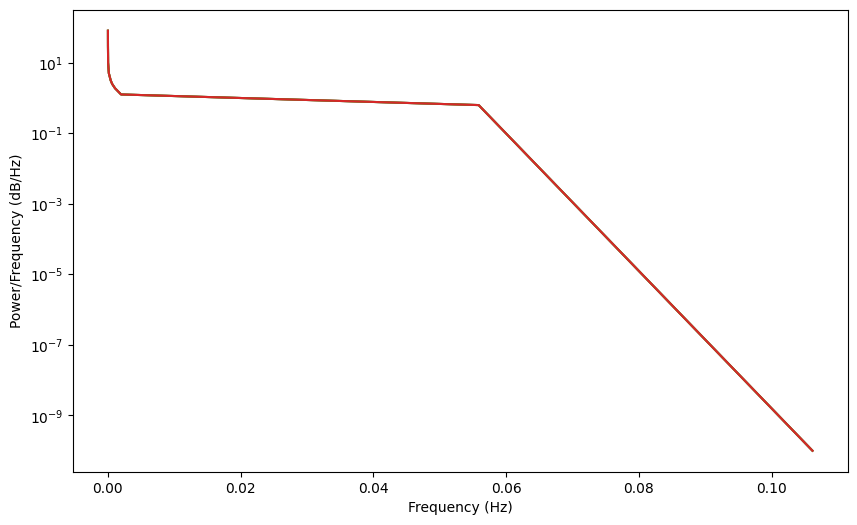

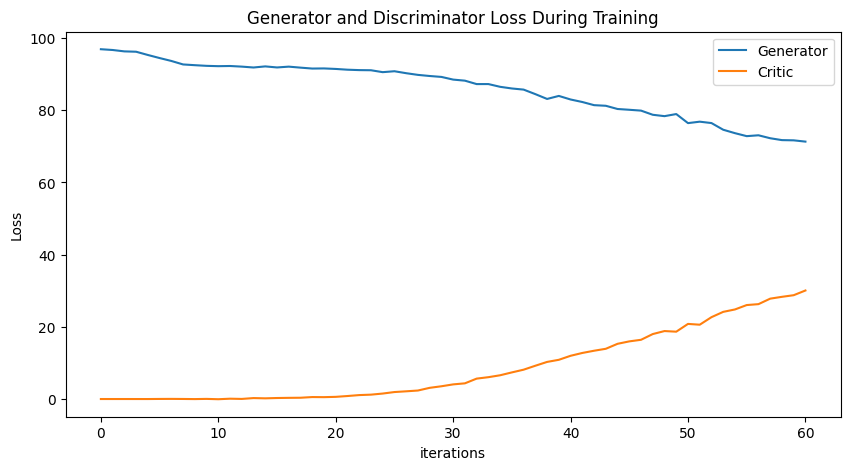

Epoch 70: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773, 82.25526164812705, 81.38276101953132, 81.21200563738562, 80.32065489581929, 80.10492062614026, 79.87244067135327, 78.72124140068613, 78.3403255342713, 78.91964494373053, 76.41211552339244, 76.81067797

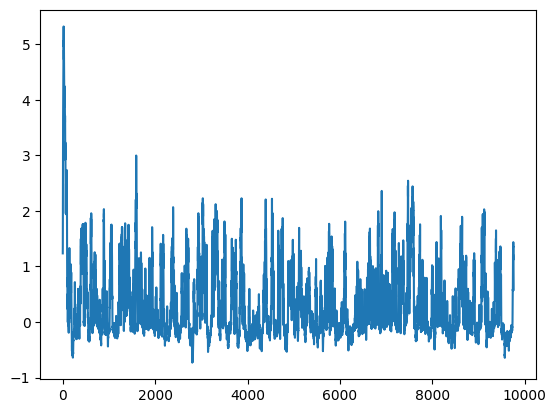

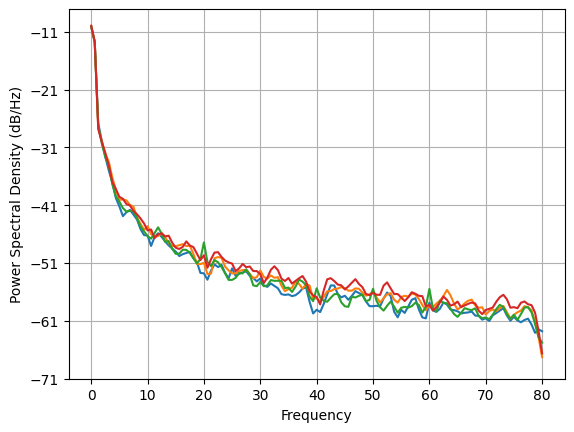

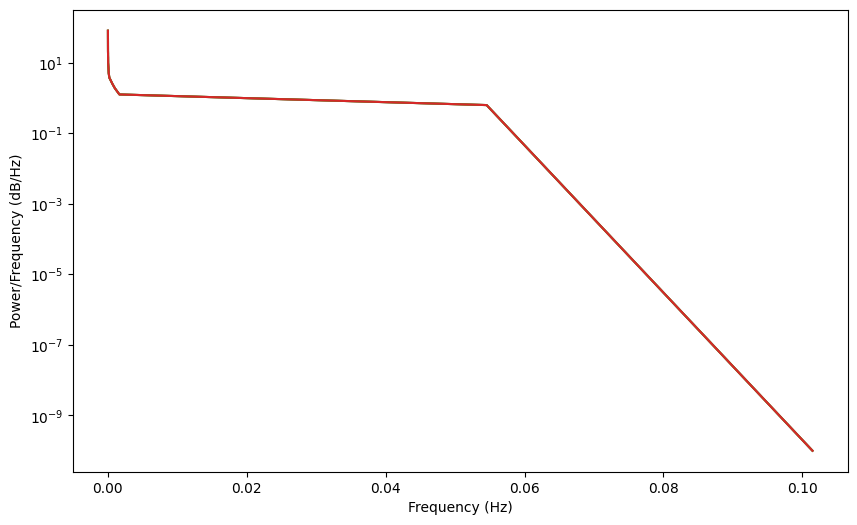

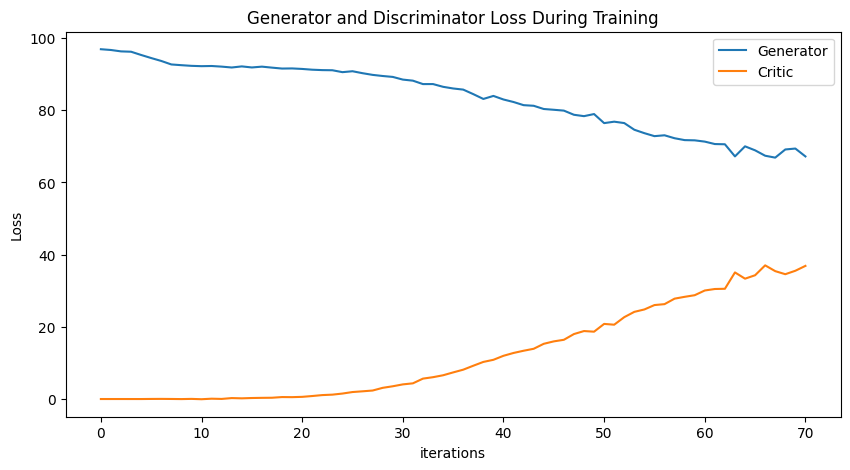

Epoch 80: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773, 82.25526164812705, 81.38276101953132, 81.21200563738562, 80.32065489581929, 80.10492062614026, 79.87244067135327, 78.72124140068613, 78.3403255342713, 78.91964494373053, 76.41211552339244, 76.81067797

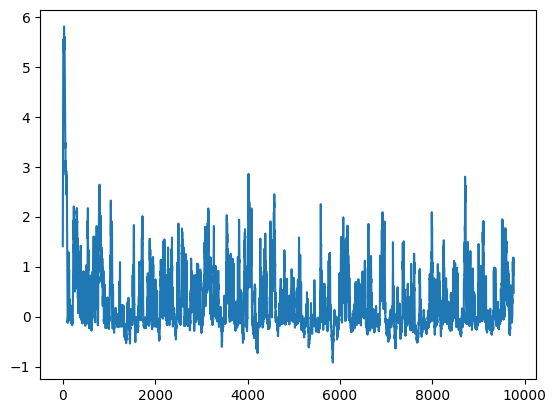

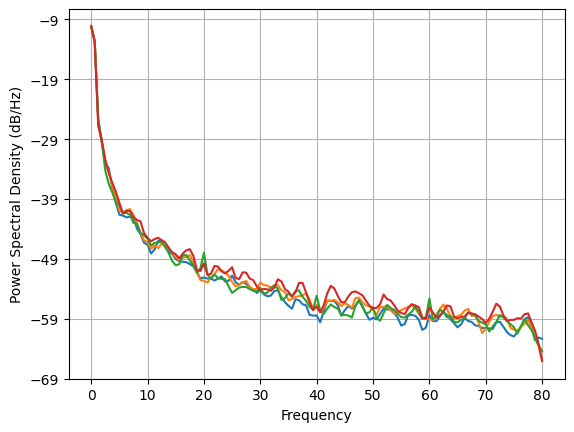

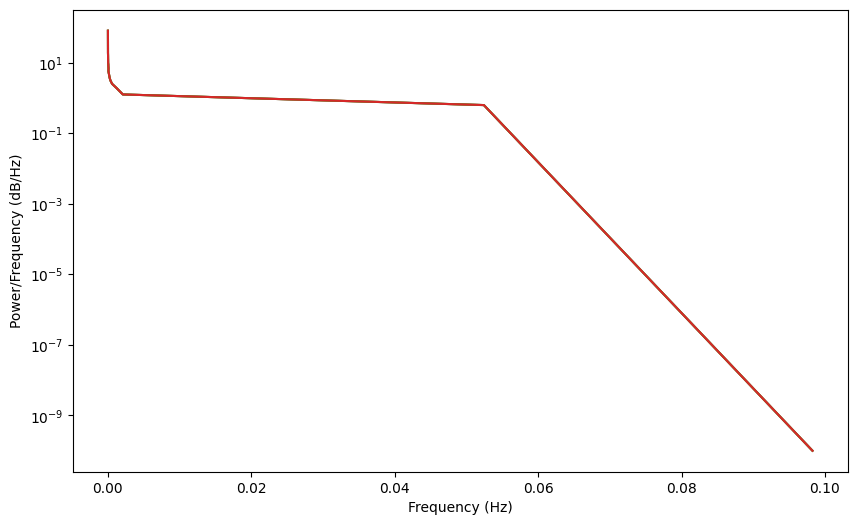

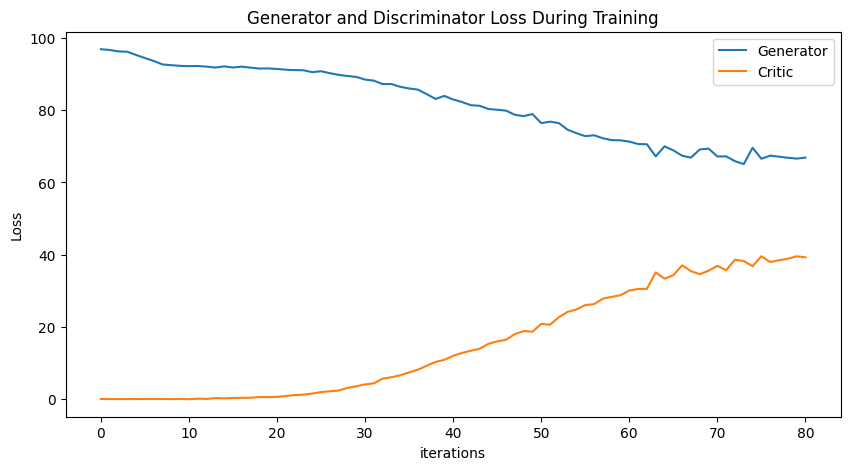

Epoch 90: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773, 82.25526164812705, 81.38276101953132, 81.21200563738562, 80.32065489581929, 80.10492062614026, 79.87244067135327, 78.72124140068613, 78.3403255342713, 78.91964494373053, 76.41211552339244, 76.81067797

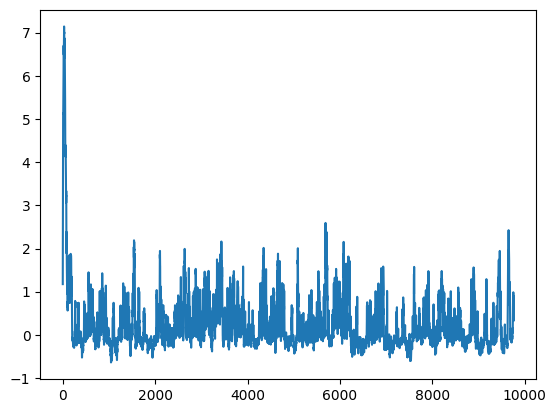

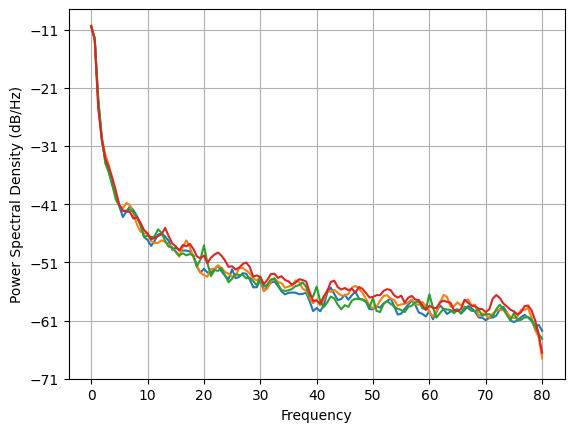

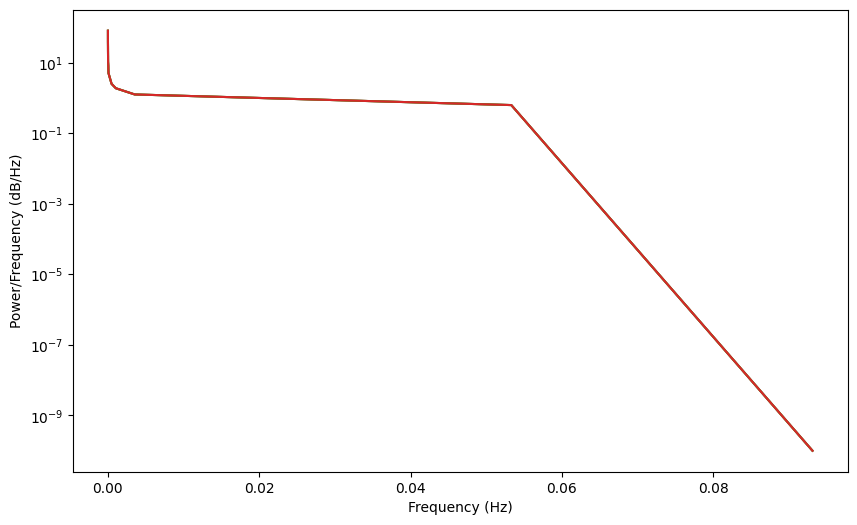

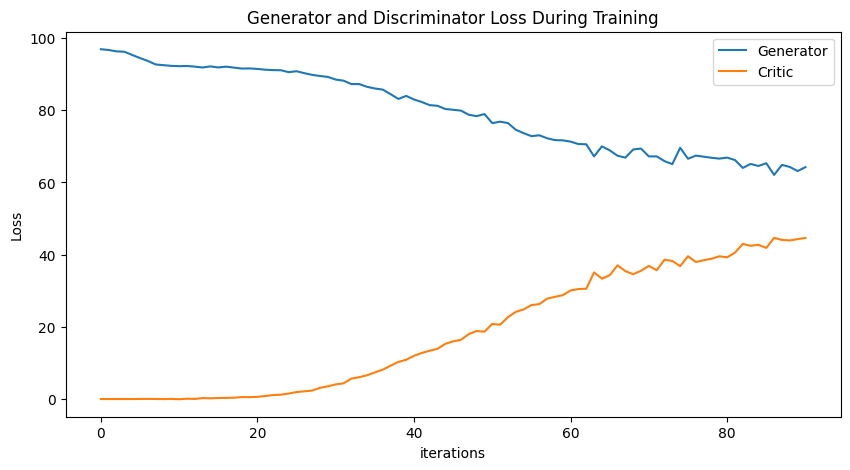

Epoch 100: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773, 82.25526164812705, 81.38276101953132, 81.21200563738562, 80.32065489581929, 80.10492062614026, 79.87244067135327, 78.72124140068613, 78.3403255342713, 78.91964494373053, 76.41211552339244, 76.8106779

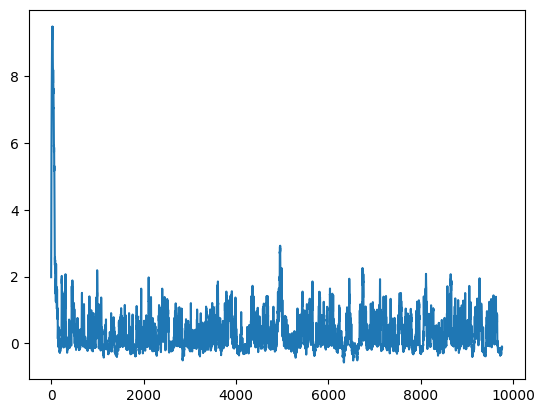

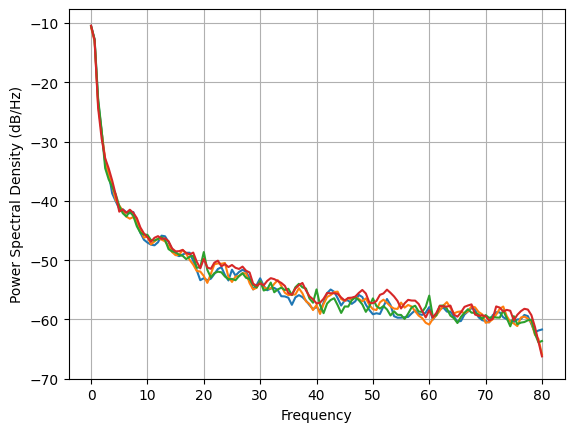

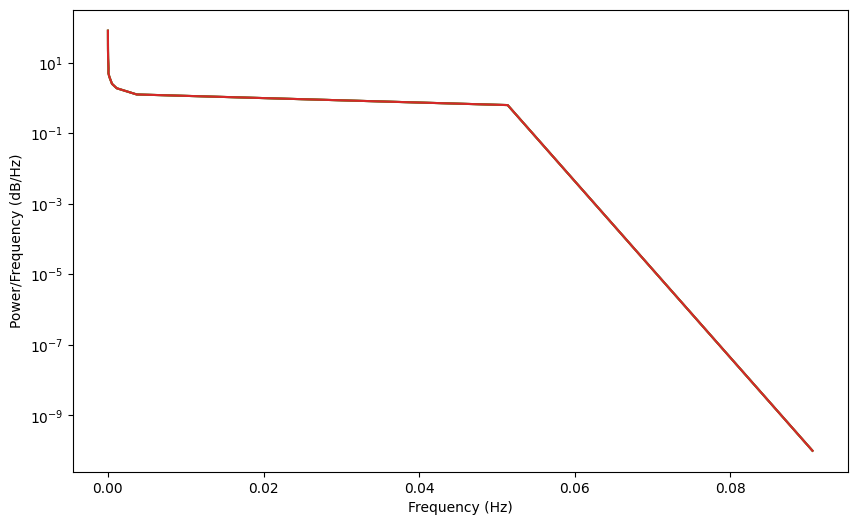

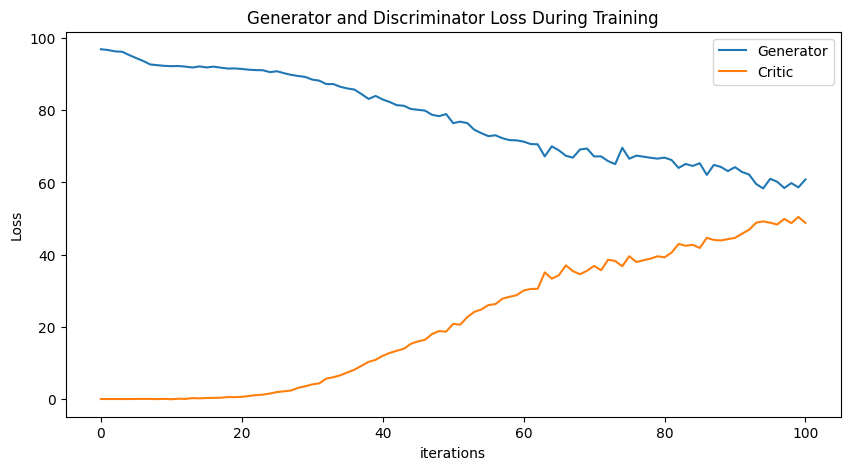

Epoch 110: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773, 82.25526164812705, 81.38276101953132, 81.21200563738562, 80.32065489581929, 80.10492062614026, 79.87244067135327, 78.72124140068613, 78.3403255342713, 78.91964494373053, 76.41211552339244, 76.8106779

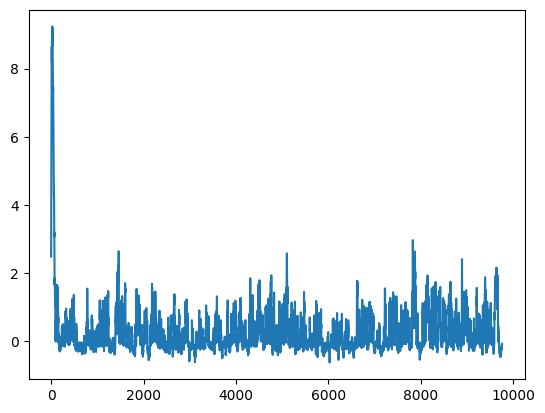

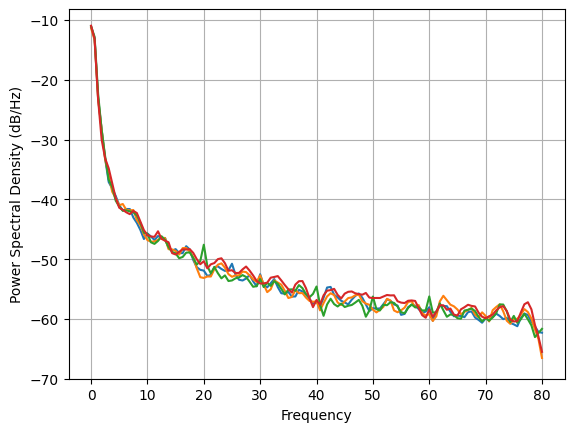

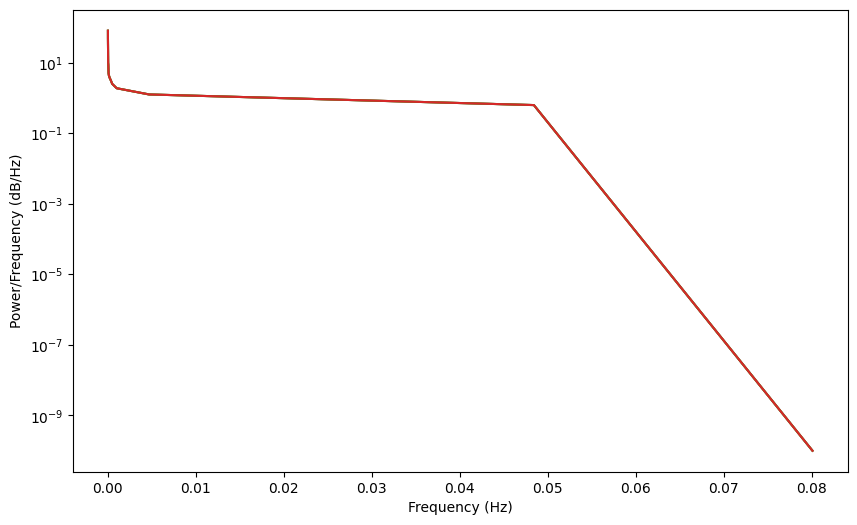

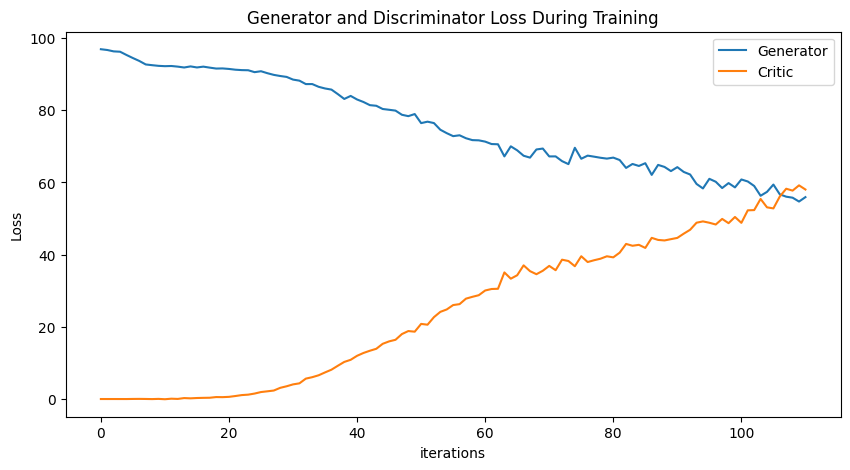

Epoch 120: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773, 82.25526164812705, 81.38276101953132, 81.21200563738562, 80.32065489581929, 80.10492062614026, 79.87244067135327, 78.72124140068613, 78.3403255342713, 78.91964494373053, 76.41211552339244, 76.8106779

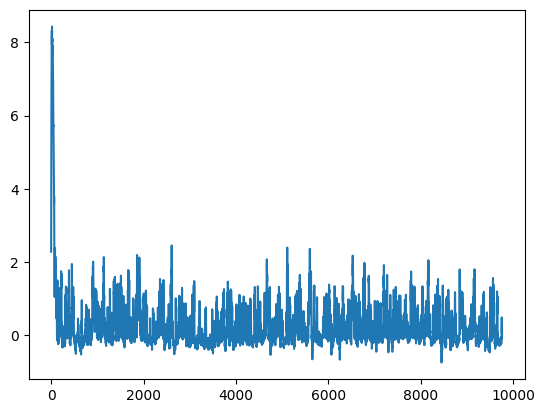

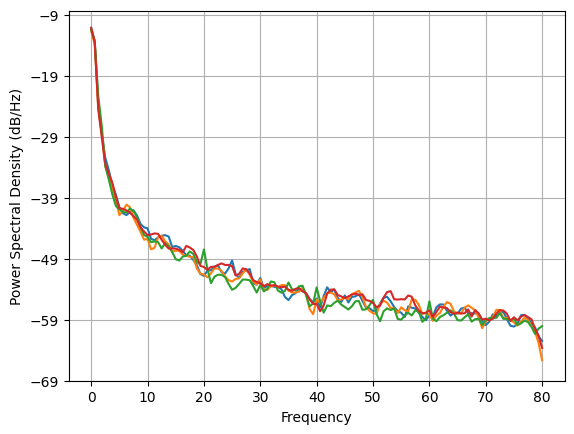

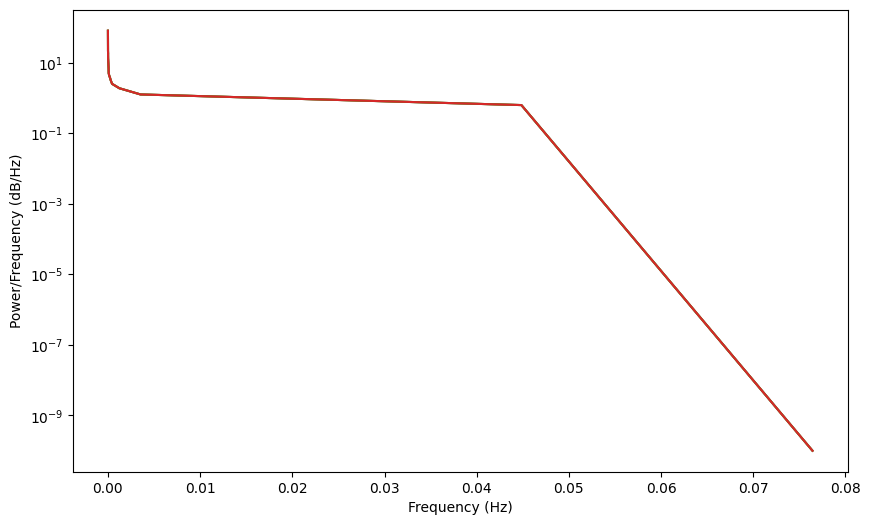

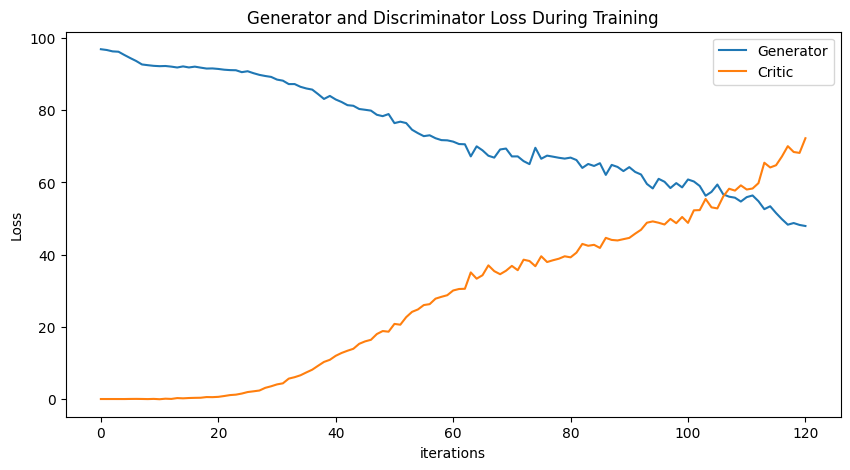

Epoch 130: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773, 82.25526164812705, 81.38276101953132, 81.21200563738562, 80.32065489581929, 80.10492062614026, 79.87244067135327, 78.72124140068613, 78.3403255342713, 78.91964494373053, 76.41211552339244, 76.8106779

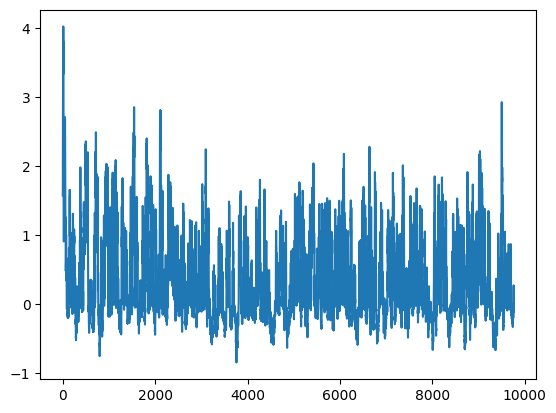

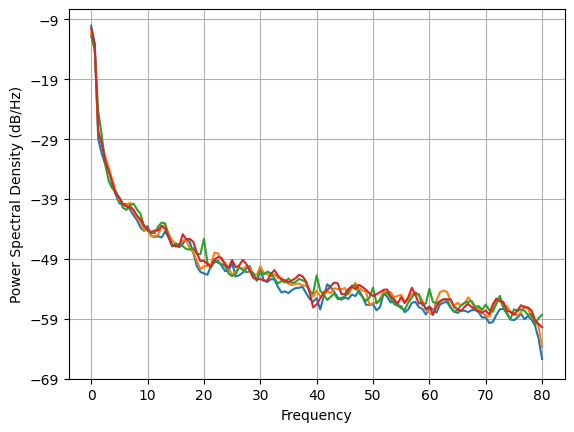

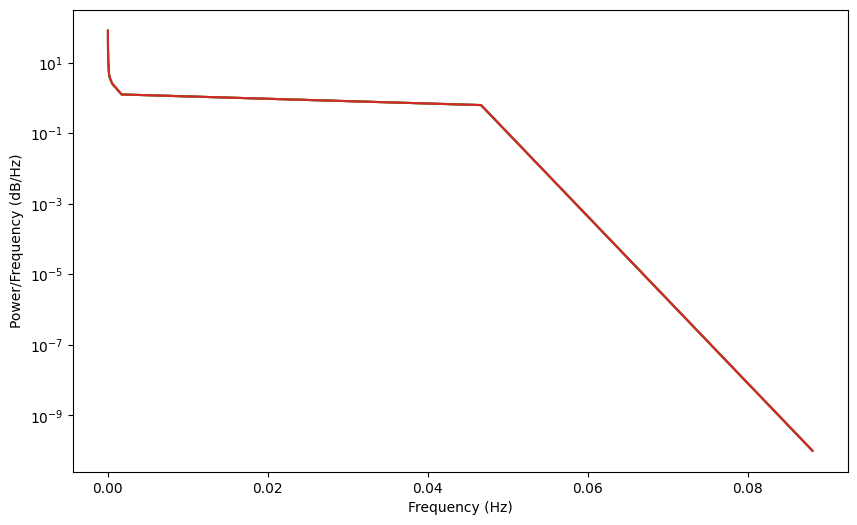

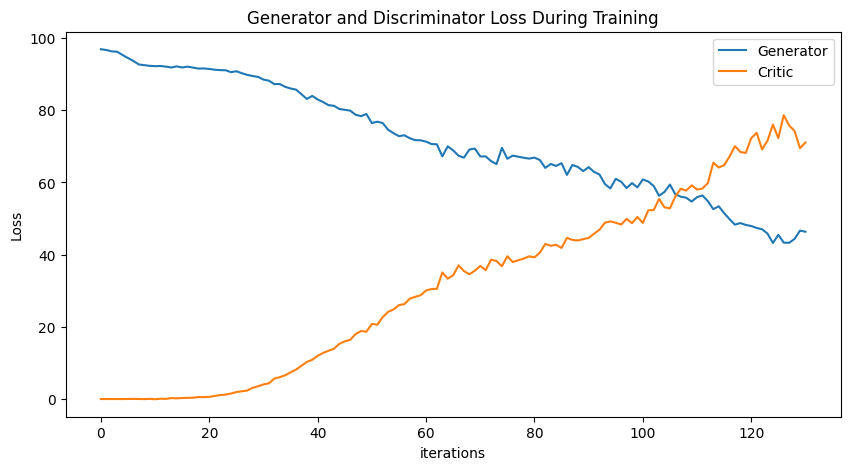

Epoch 140: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773, 82.25526164812705, 81.38276101953132, 81.21200563738562, 80.32065489581929, 80.10492062614026, 79.87244067135327, 78.72124140068613, 78.3403255342713, 78.91964494373053, 76.41211552339244, 76.8106779

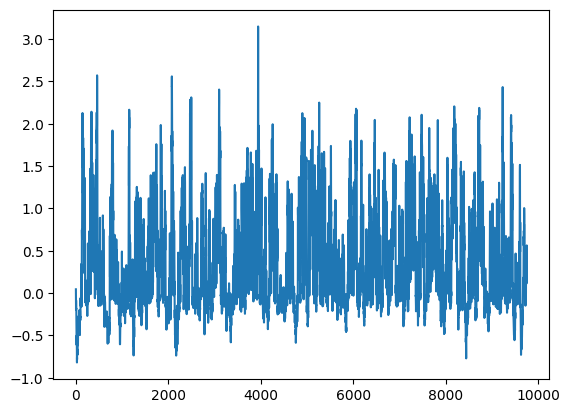

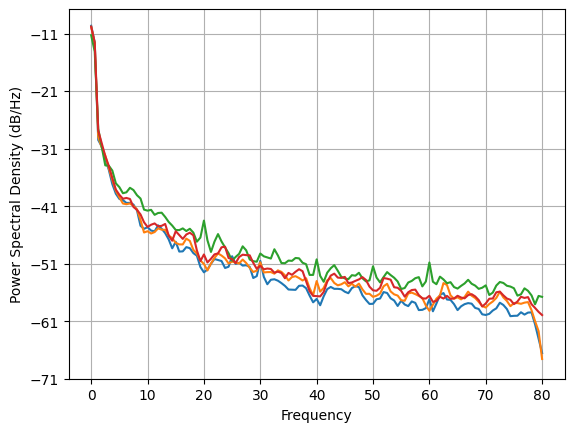

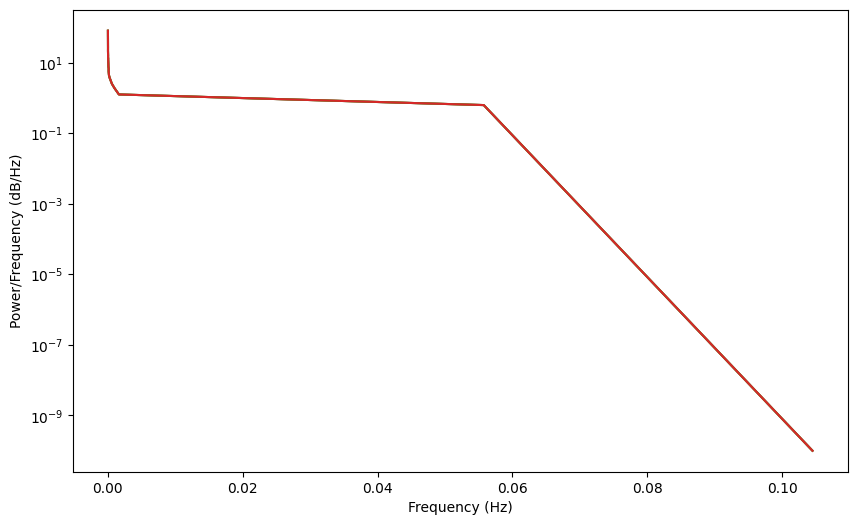

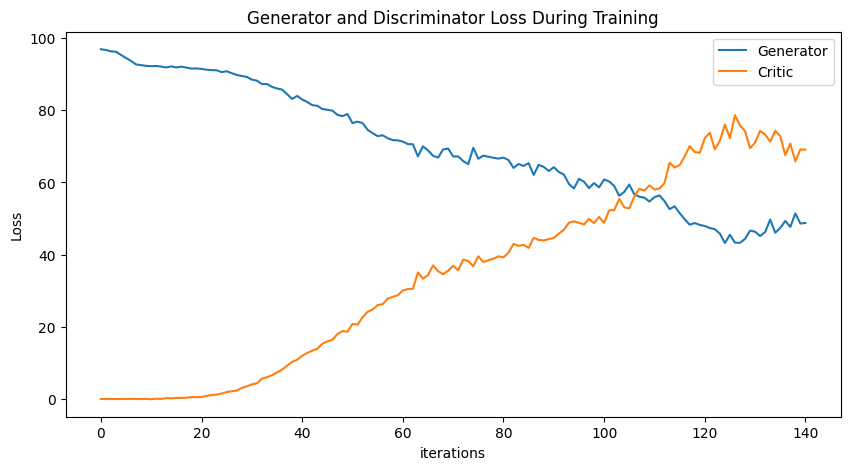

Epoch 150: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773, 82.25526164812705, 81.38276101953132, 81.21200563738562, 80.32065489581929, 80.10492062614026, 79.87244067135327, 78.72124140068613, 78.3403255342713, 78.91964494373053, 76.41211552339244, 76.8106779

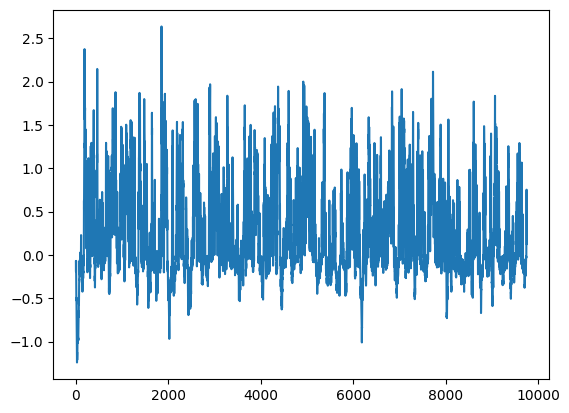

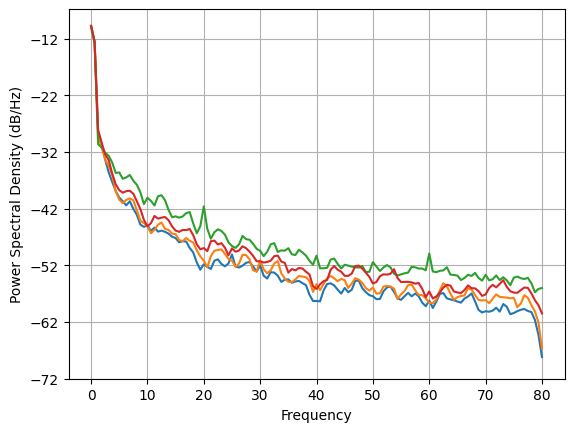

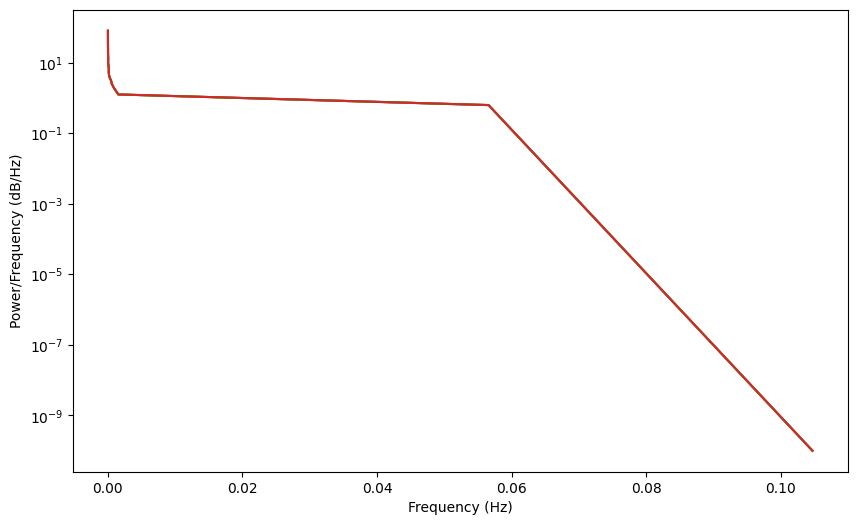

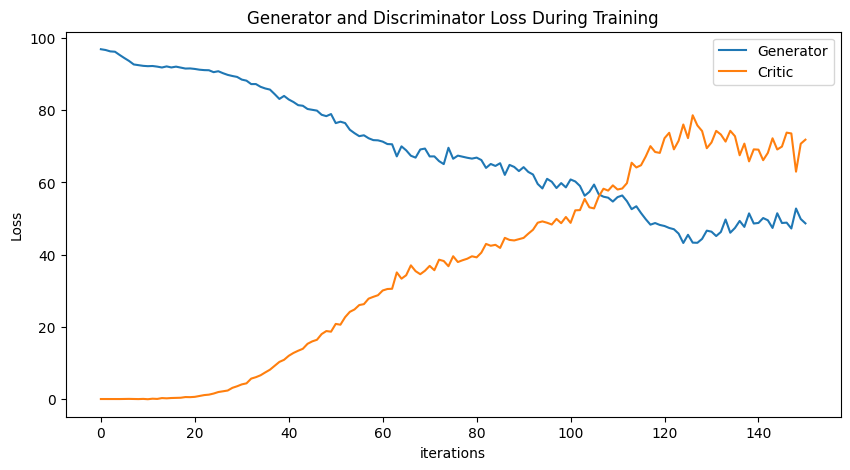

Epoch 160: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773, 82.25526164812705, 81.38276101953132, 81.21200563738562, 80.32065489581929, 80.10492062614026, 79.87244067135327, 78.72124140068613, 78.3403255342713, 78.91964494373053, 76.41211552339244, 76.8106779

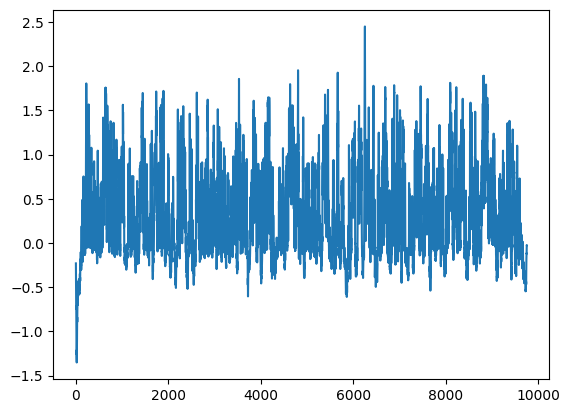

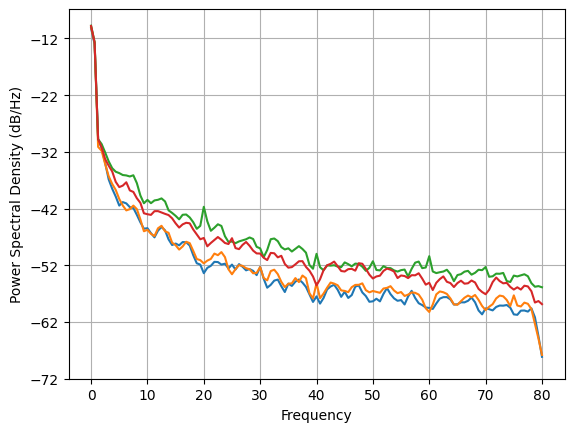

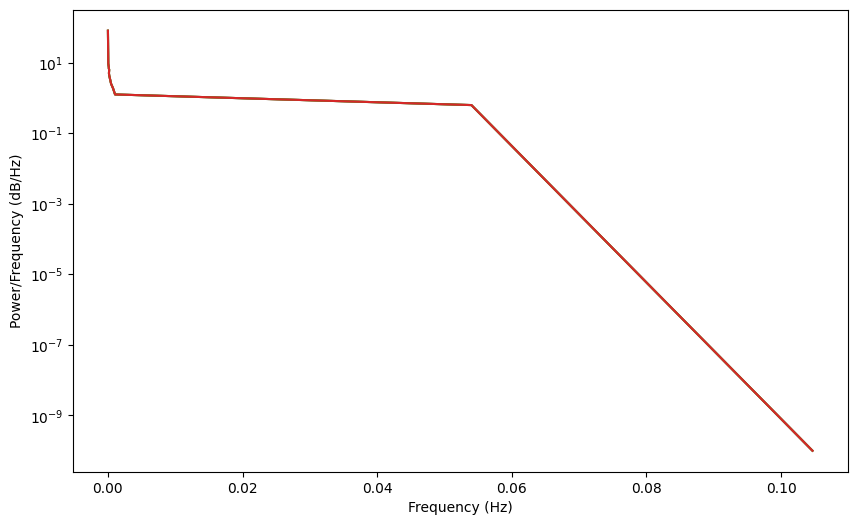

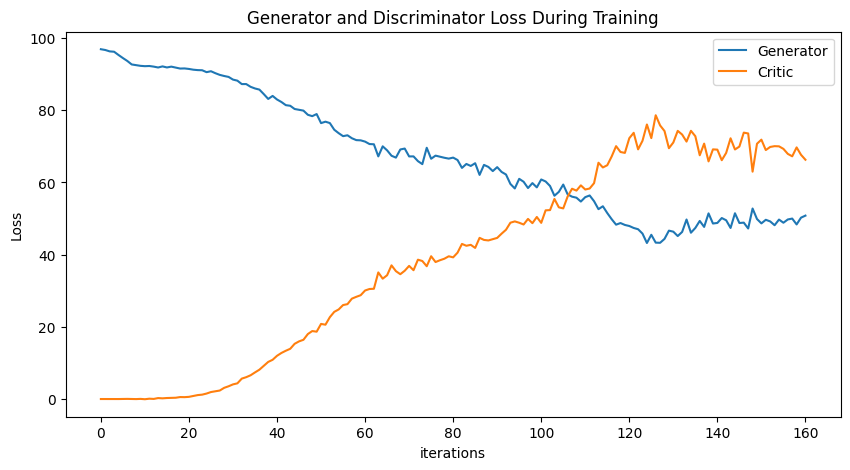

Epoch 170: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773, 82.25526164812705, 81.38276101953132, 81.21200563738562, 80.32065489581929, 80.10492062614026, 79.87244067135327, 78.72124140068613, 78.3403255342713, 78.91964494373053, 76.41211552339244, 76.8106779

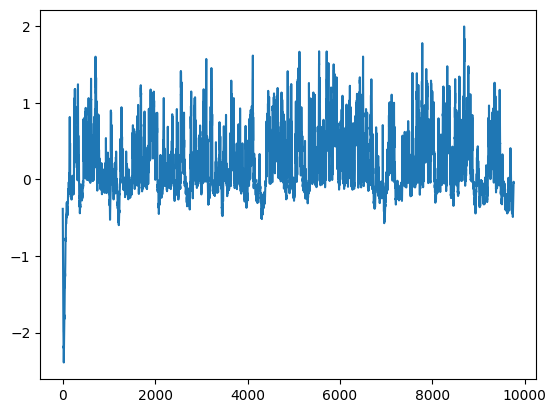

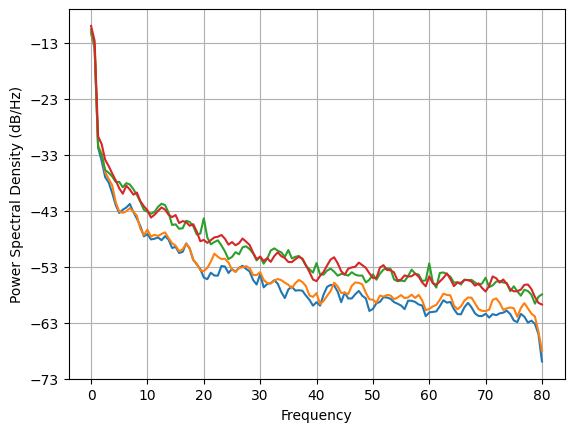

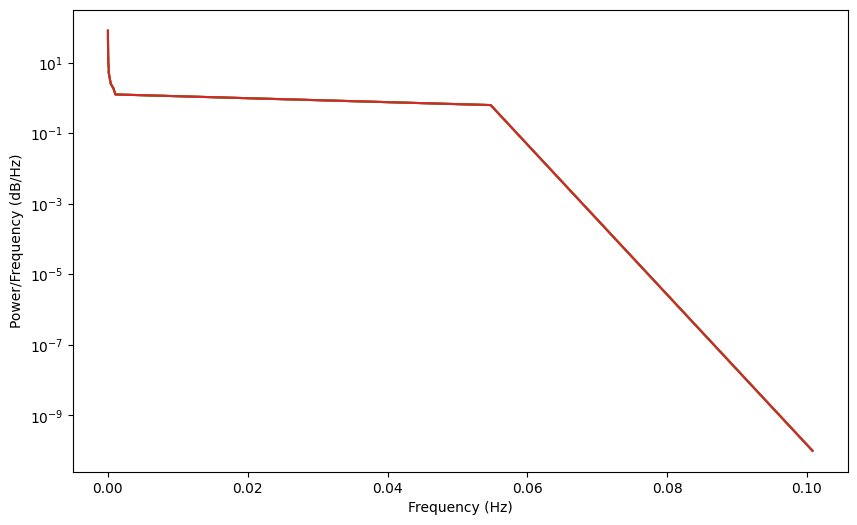

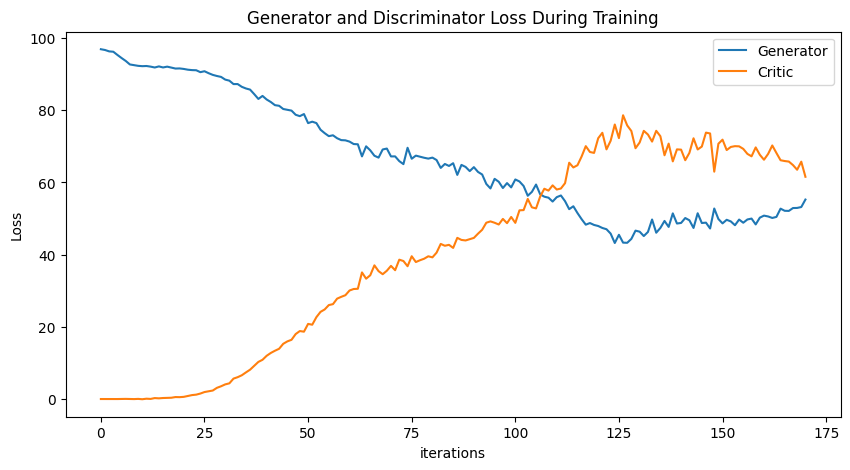

Epoch 180: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773, 82.25526164812705, 81.38276101953132, 81.21200563738562, 80.32065489581929, 80.10492062614026, 79.87244067135327, 78.72124140068613, 78.3403255342713, 78.91964494373053, 76.41211552339244, 76.8106779

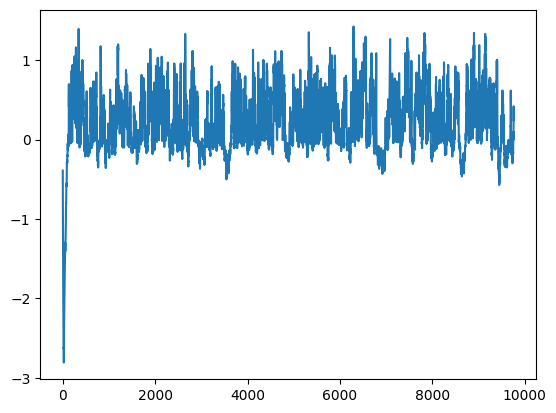

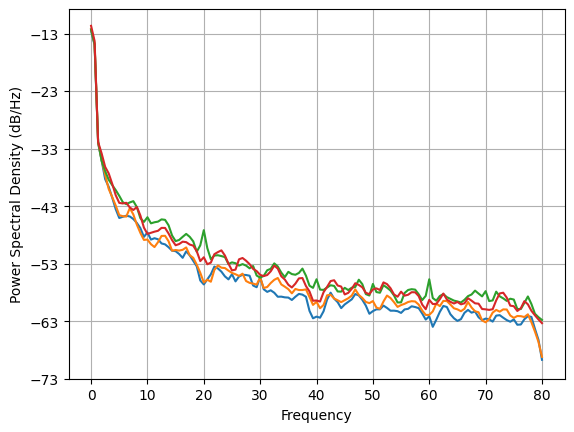

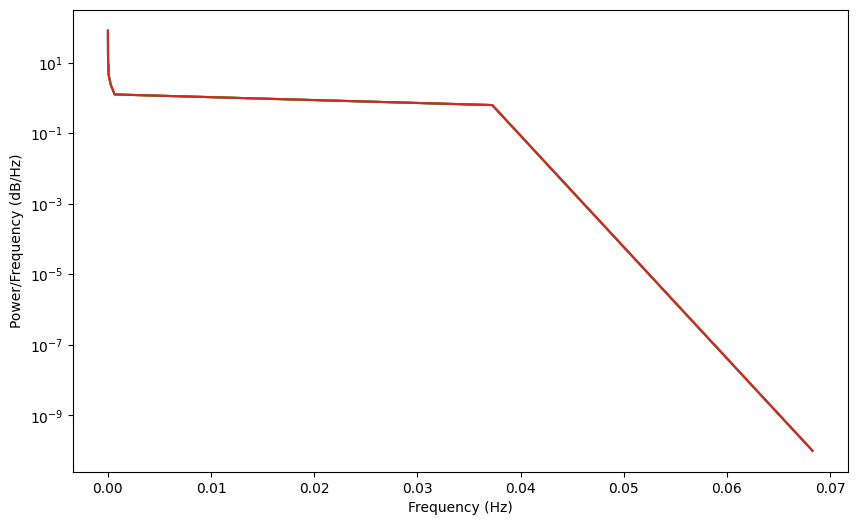

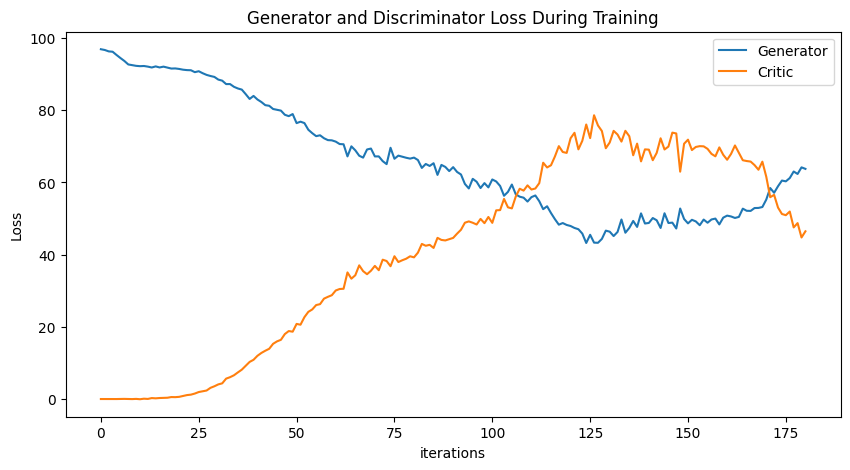

Epoch 190: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773, 82.25526164812705, 81.38276101953132, 81.21200563738562, 80.32065489581929, 80.10492062614026, 79.87244067135327, 78.72124140068613, 78.3403255342713, 78.91964494373053, 76.41211552339244, 76.8106779

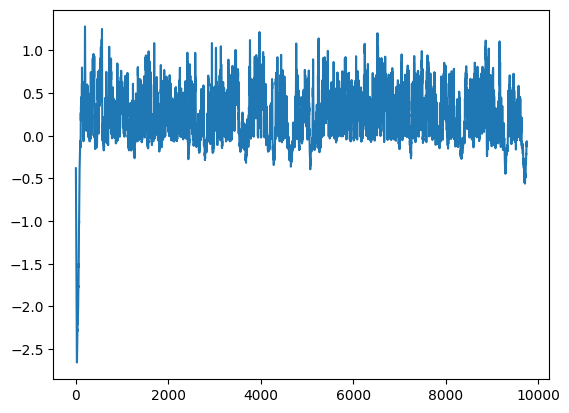

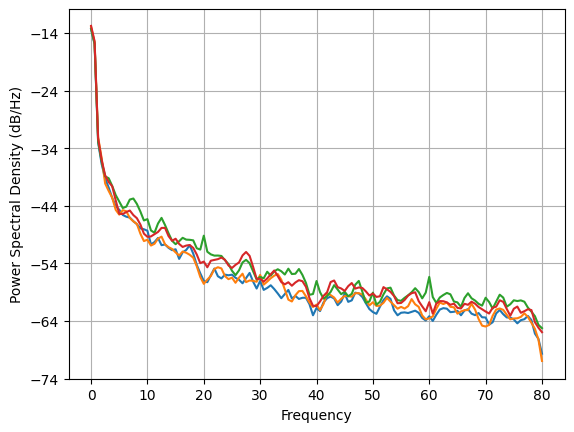

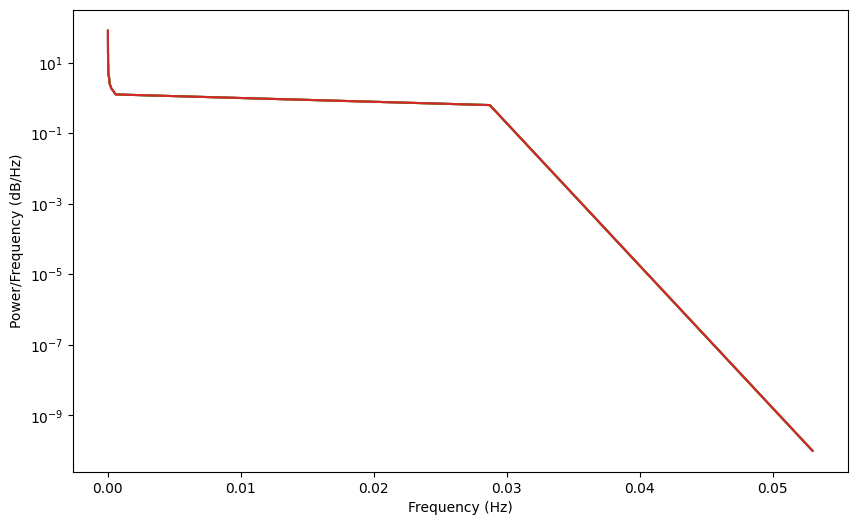

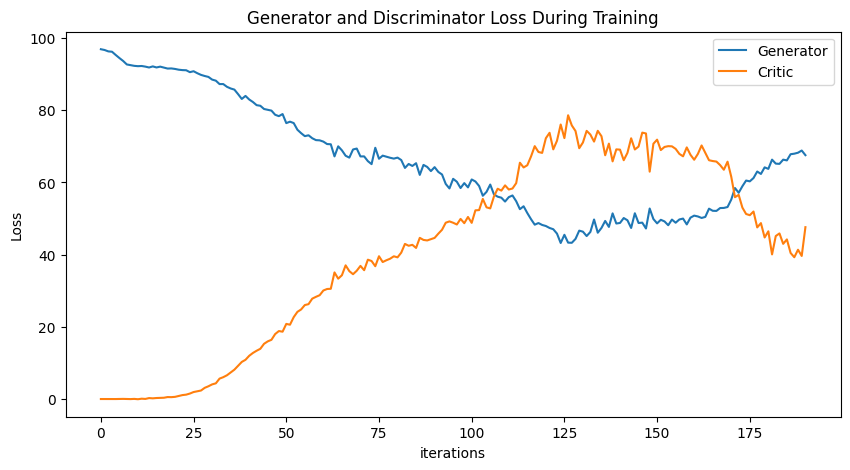

Epoch 200: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773, 82.25526164812705, 81.38276101953132, 81.21200563738562, 80.32065489581929, 80.10492062614026, 79.87244067135327, 78.72124140068613, 78.3403255342713, 78.91964494373053, 76.41211552339244, 76.8106779

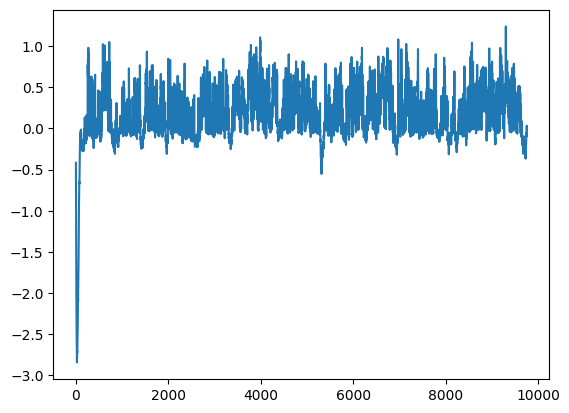

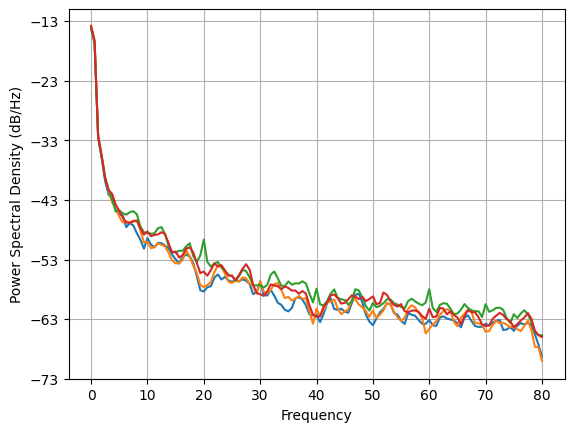

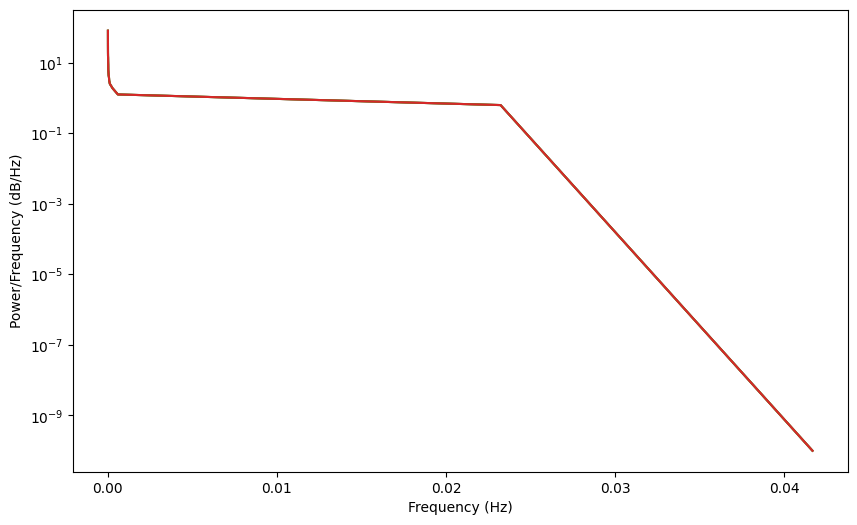

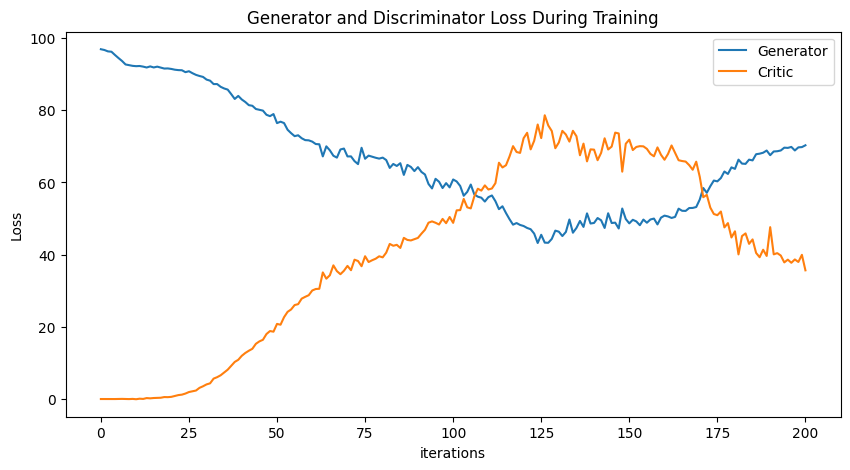

Epoch 210: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773, 82.25526164812705, 81.38276101953132, 81.21200563738562, 80.32065489581929, 80.10492062614026, 79.87244067135327, 78.72124140068613, 78.3403255342713, 78.91964494373053, 76.41211552339244, 76.8106779

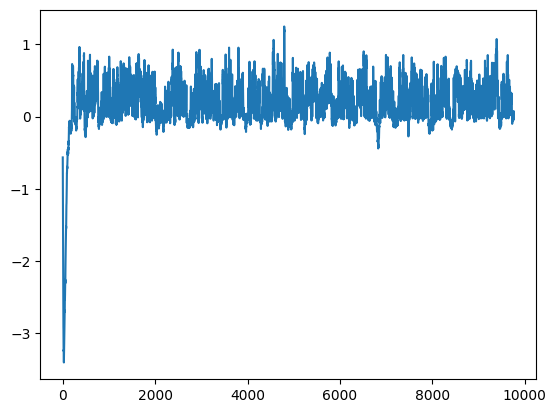

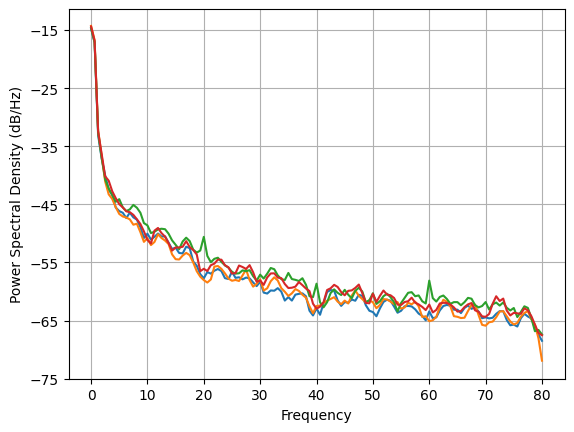

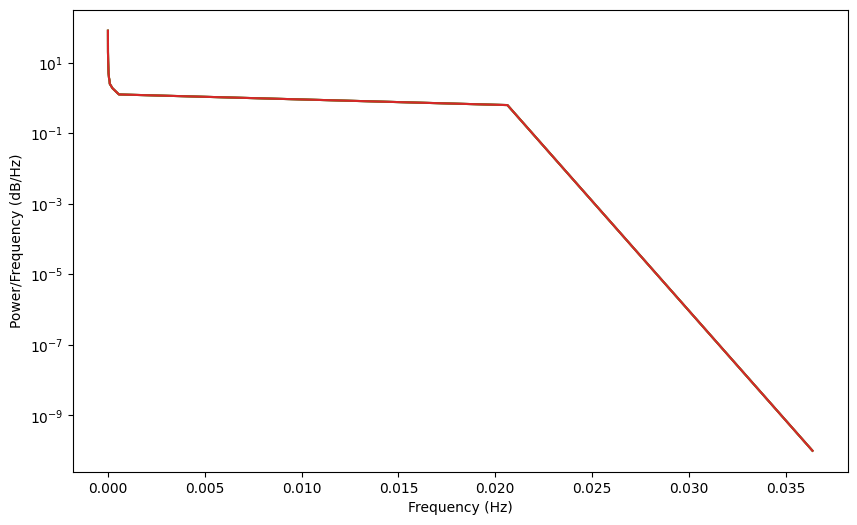

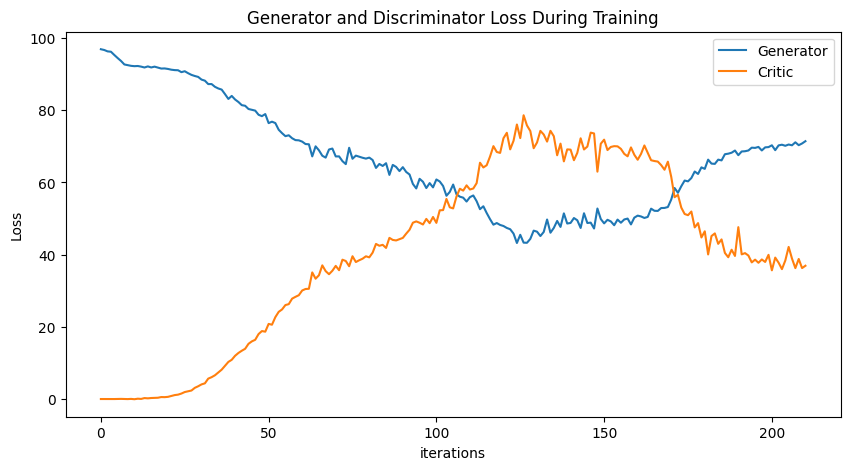

Epoch 220: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773, 82.25526164812705, 81.38276101953132, 81.21200563738562, 80.32065489581929, 80.10492062614026, 79.87244067135327, 78.72124140068613, 78.3403255342713, 78.91964494373053, 76.41211552339244, 76.8106779

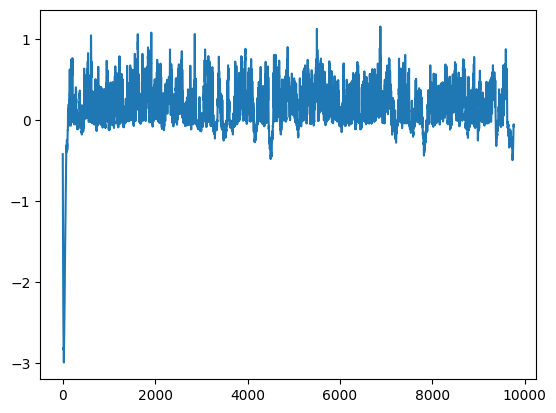

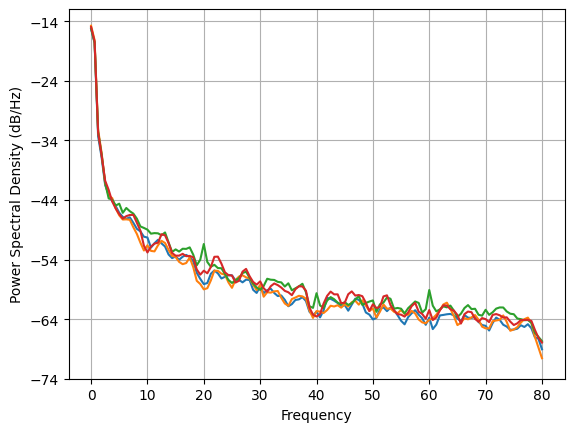

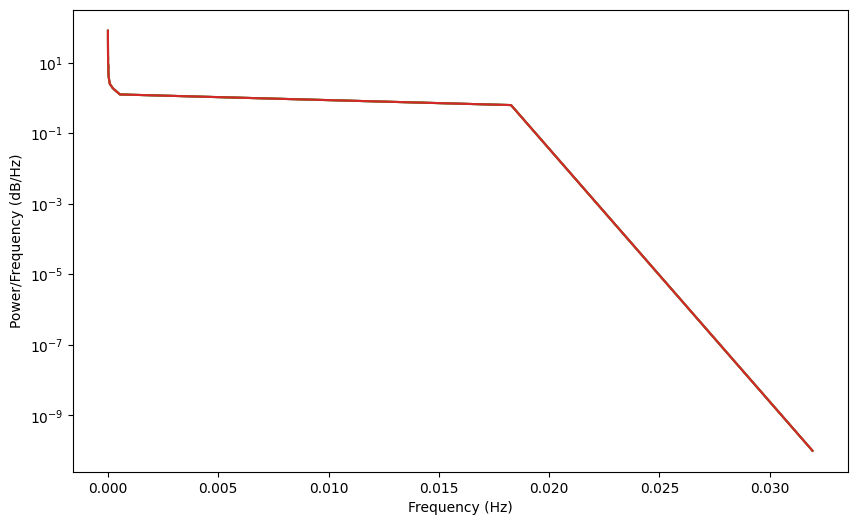

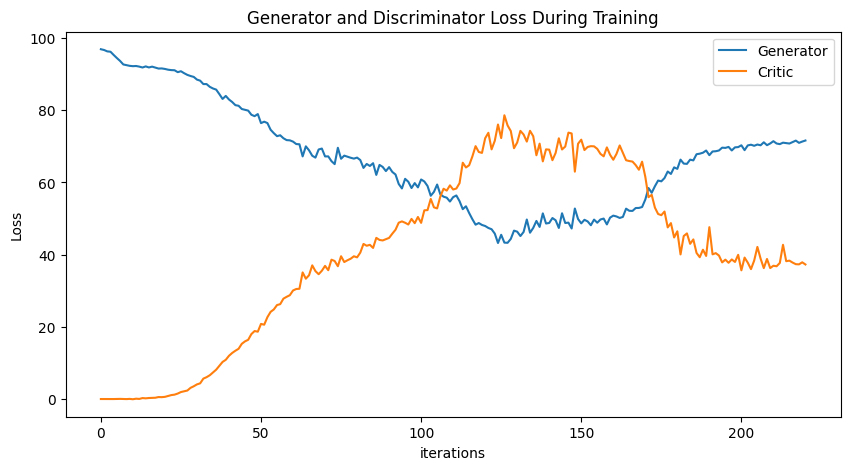

Epoch 230: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773, 82.25526164812705, 81.38276101953132, 81.21200563738562, 80.32065489581929, 80.10492062614026, 79.87244067135327, 78.72124140068613, 78.3403255342713, 78.91964494373053, 76.41211552339244, 76.8106779

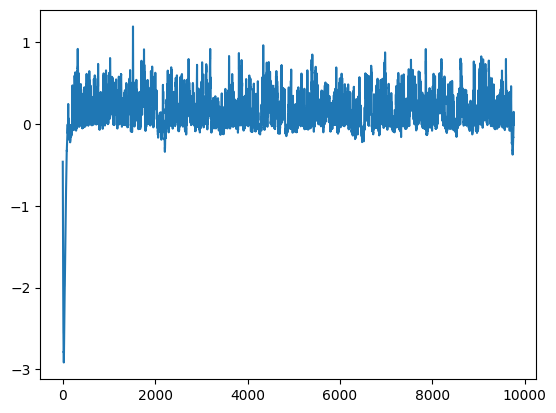

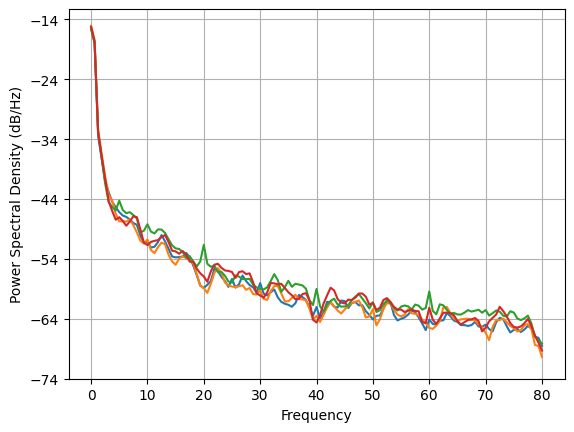

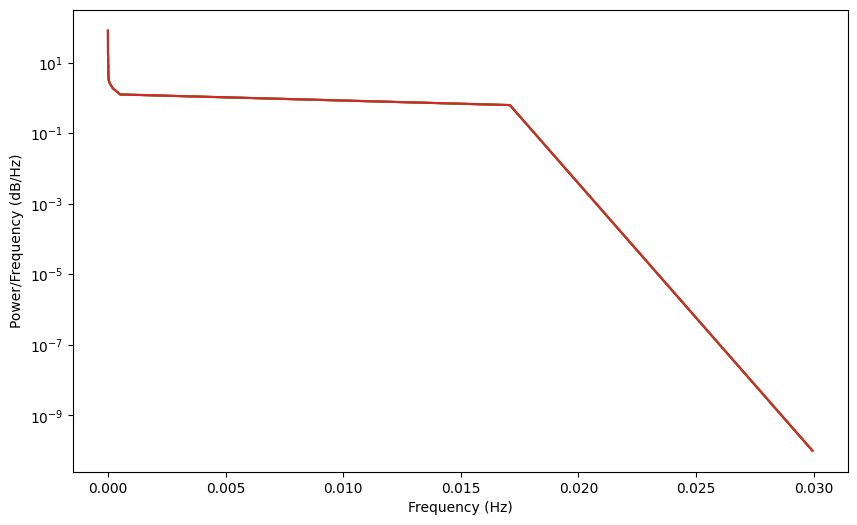

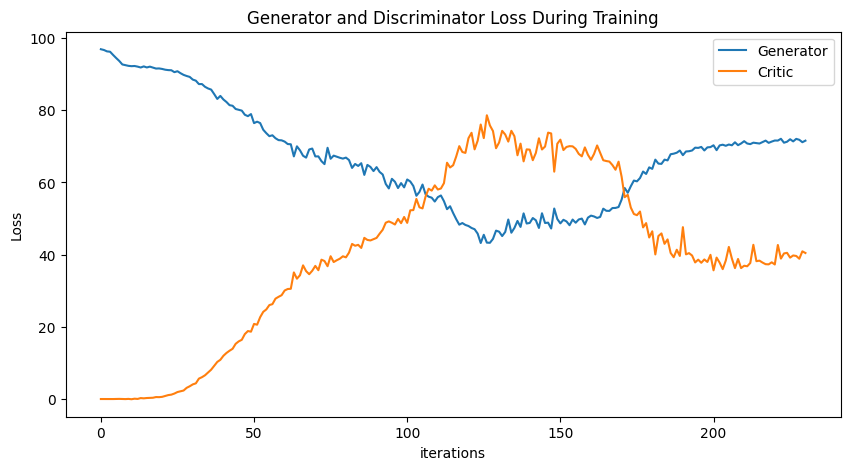

Epoch 240: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773, 82.25526164812705, 81.38276101953132, 81.21200563738562, 80.32065489581929, 80.10492062614026, 79.87244067135327, 78.72124140068613, 78.3403255342713, 78.91964494373053, 76.41211552339244, 76.8106779

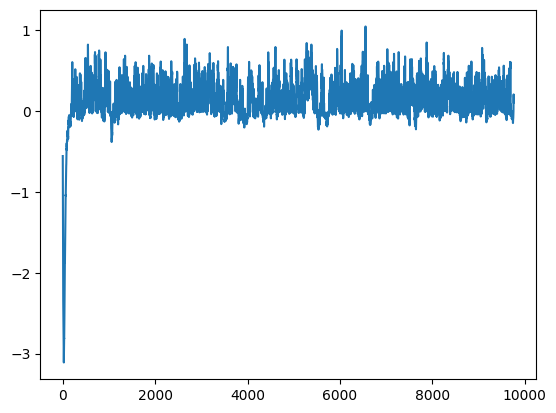

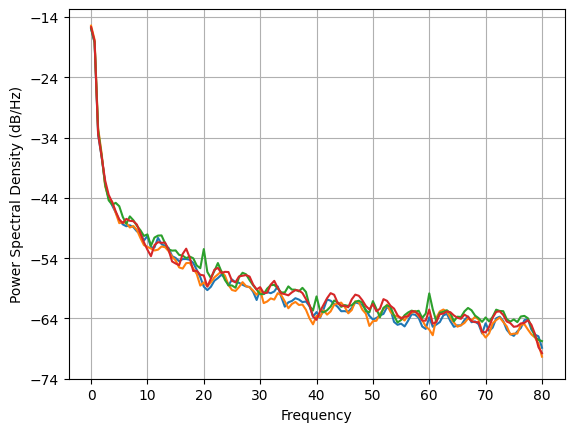

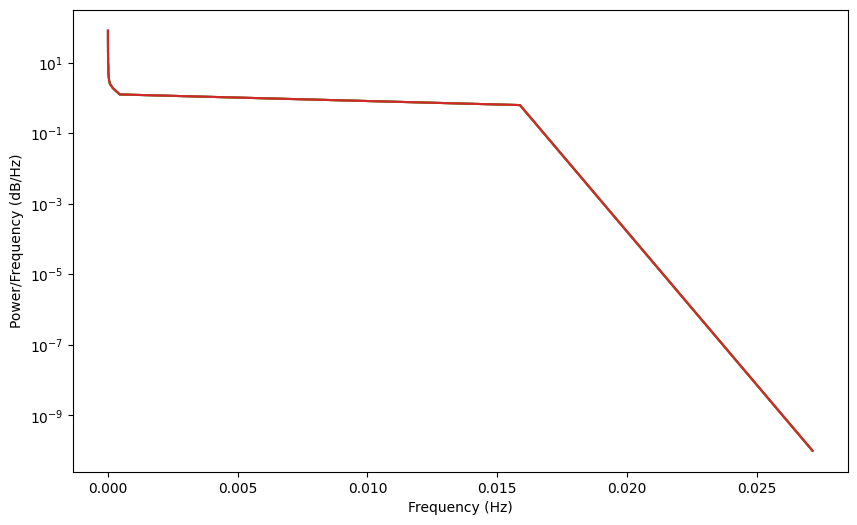

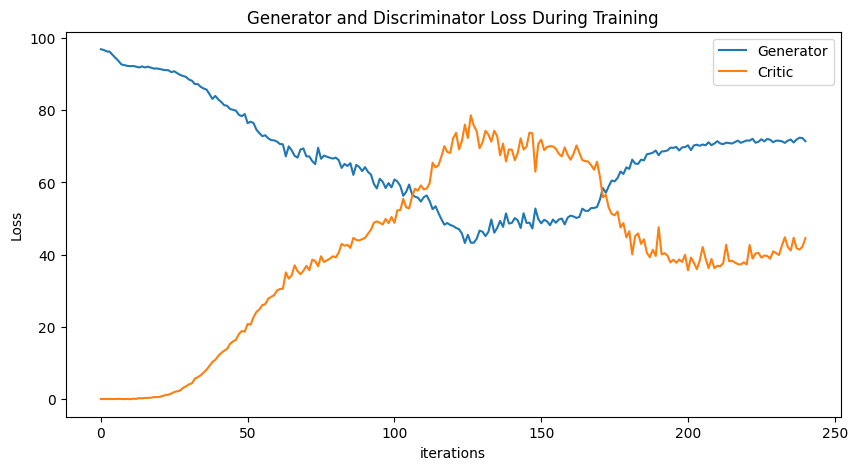

Epoch 250: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773, 82.25526164812705, 81.38276101953132, 81.21200563738562, 80.32065489581929, 80.10492062614026, 79.87244067135327, 78.72124140068613, 78.3403255342713, 78.91964494373053, 76.41211552339244, 76.8106779

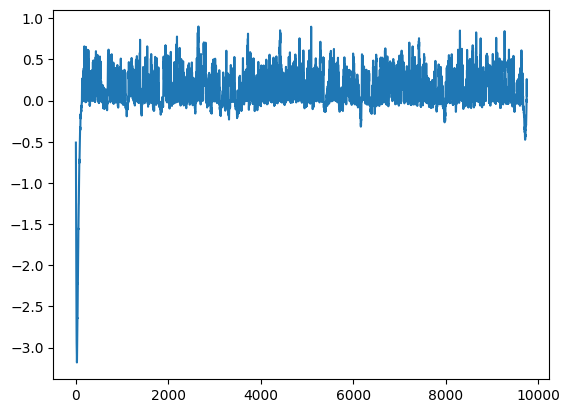

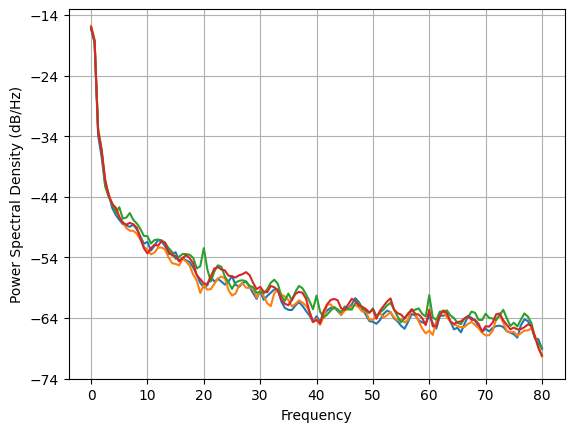

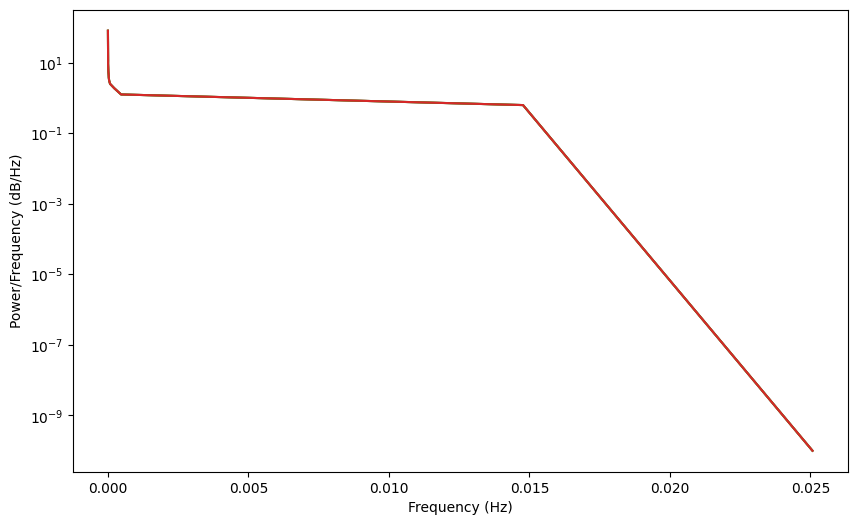

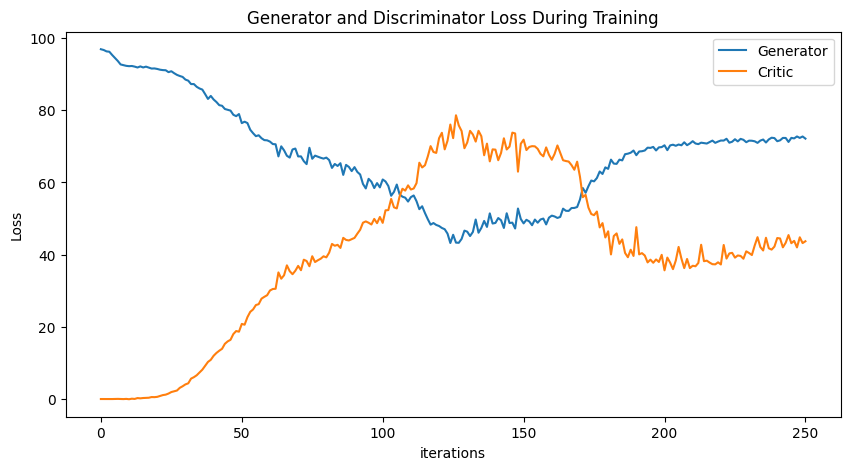

Epoch 260: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773, 82.25526164812705, 81.38276101953132, 81.21200563738562, 80.32065489581929, 80.10492062614026, 79.87244067135327, 78.72124140068613, 78.3403255342713, 78.91964494373053, 76.41211552339244, 76.8106779

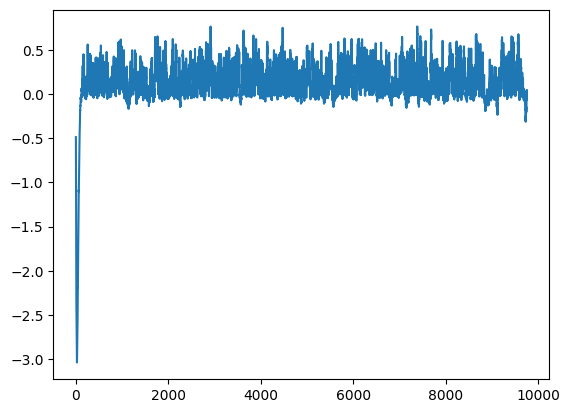

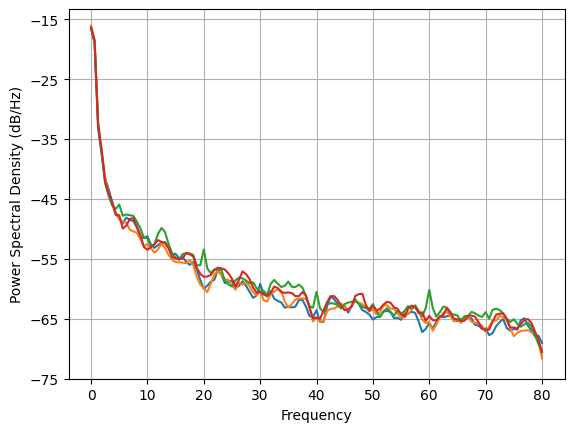

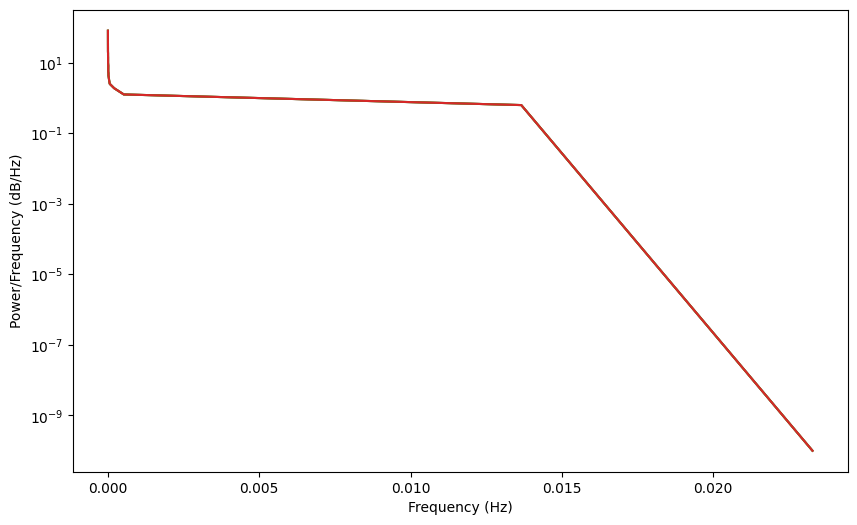

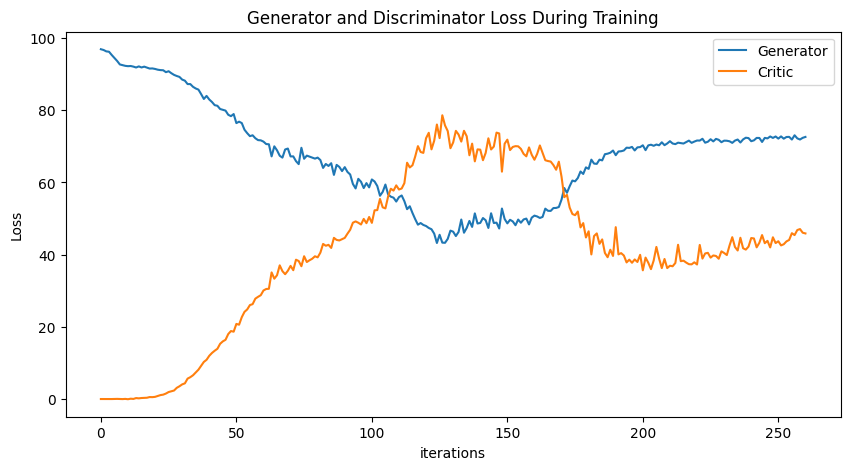

Epoch 270: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773, 82.25526164812705, 81.38276101953132, 81.21200563738562, 80.32065489581929, 80.10492062614026, 79.87244067135327, 78.72124140068613, 78.3403255342713, 78.91964494373053, 76.41211552339244, 76.8106779

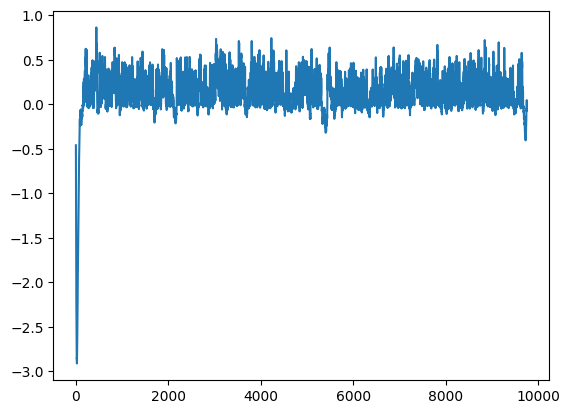

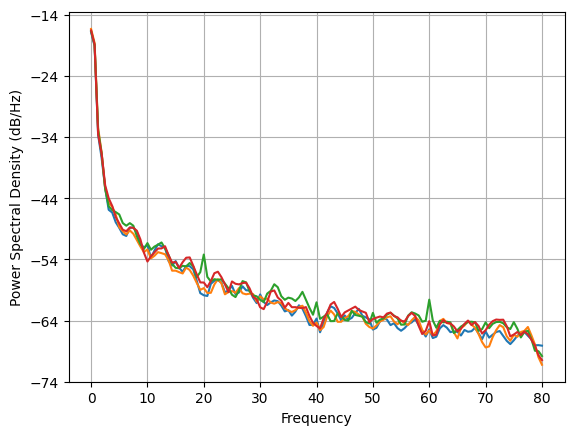

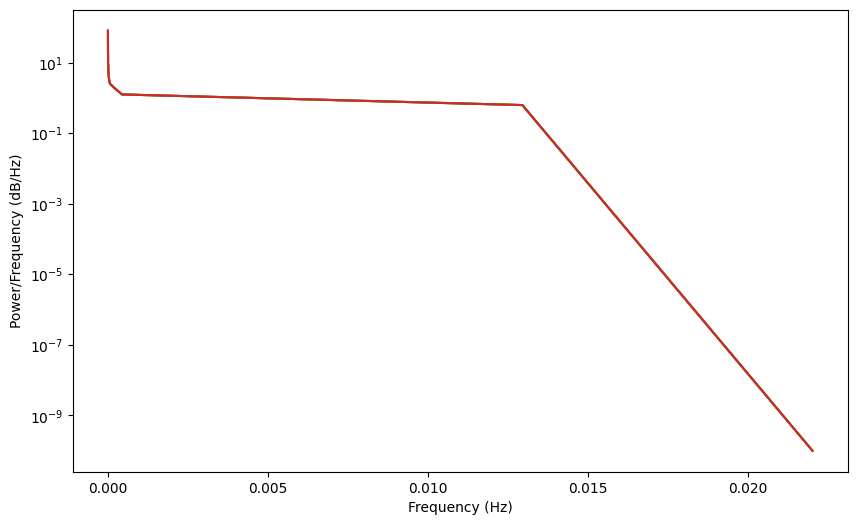

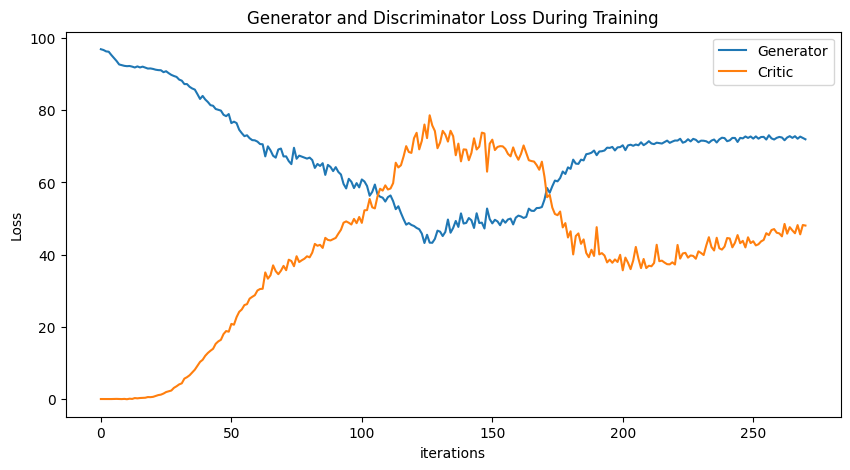

Epoch 280: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773, 82.25526164812705, 81.38276101953132, 81.21200563738562, 80.32065489581929, 80.10492062614026, 79.87244067135327, 78.72124140068613, 78.3403255342713, 78.91964494373053, 76.41211552339244, 76.8106779

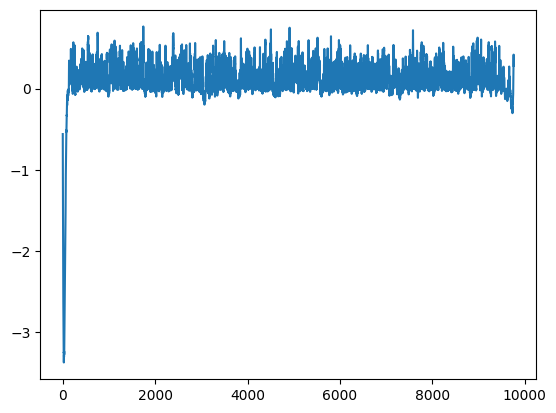

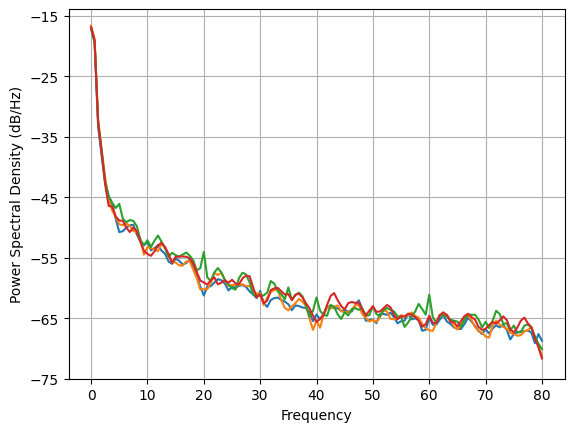

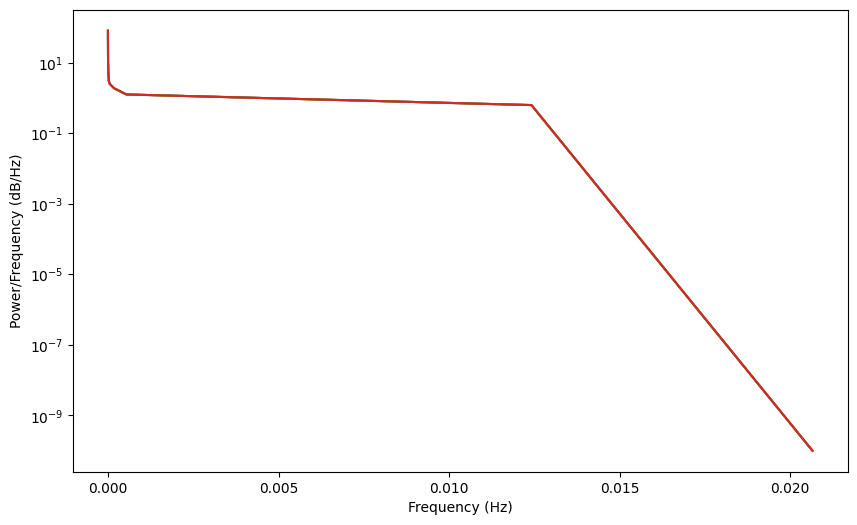

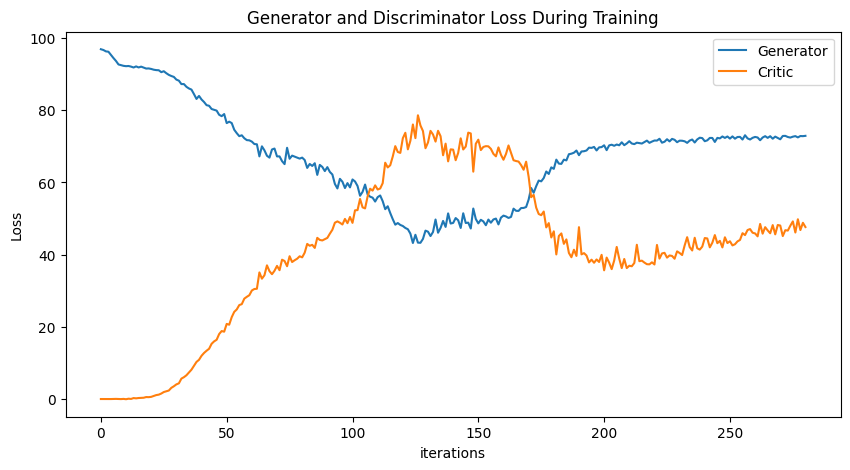

Epoch 290: Critic error ([96.86462854824721, 96.65079313634796, 96.2666363612956, 96.17068592944422, 95.2715825564584, 94.42170947755929, 93.61593523958976, 92.64936398600807, 92.44616592177961, 92.26418264162476, 92.17269465307213, 92.2207737301189, 92.04759439284169, 91.80730436545898, 92.11015897946346, 91.81904029685354, 92.04310651009308, 91.76716412786341, 91.51447251057164, 91.54792195097993, 91.40615226596714, 91.19672118694587, 91.08347142026932, 91.04550761373038, 90.51672395500188, 90.77157936140557, 90.22777398215626, 89.76357252290153, 89.45305460521854, 89.19974278540118, 88.45847309866541, 88.16287702083191, 87.21537158391651, 87.22038949039194, 86.46086628395776, 85.99976381431388, 85.6889405689207, 84.43435401964437, 83.10213511120594, 83.93927741801427, 82.95034808976773, 82.25526164812705, 81.38276101953132, 81.21200563738562, 80.32065489581929, 80.10492062614026, 79.87244067135327, 78.72124140068613, 78.3403255342713, 78.91964494373053, 76.41211552339244, 76.8106779

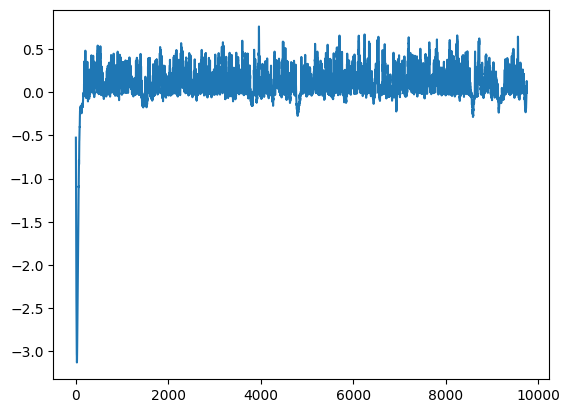

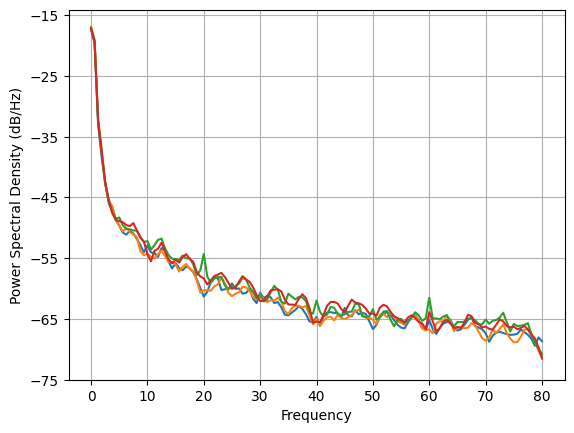

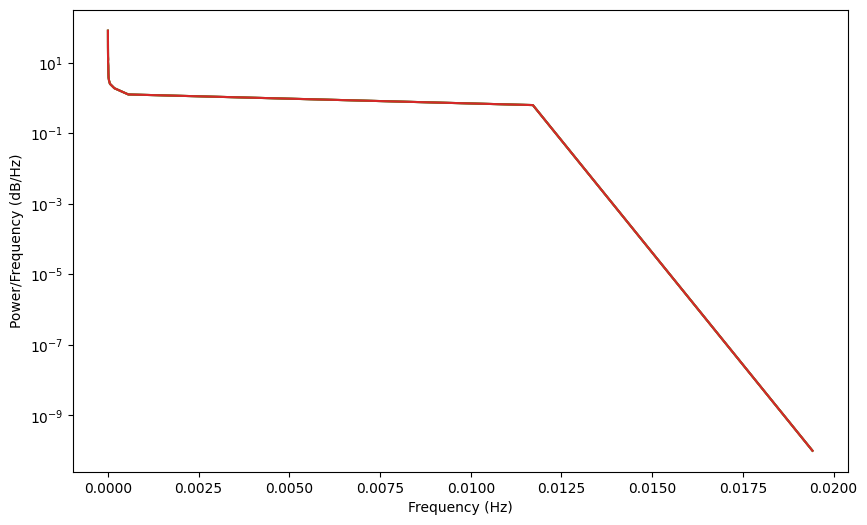

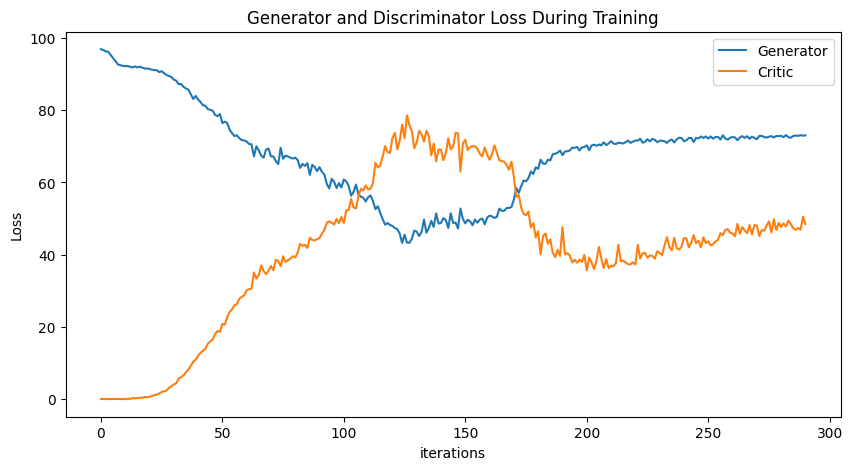

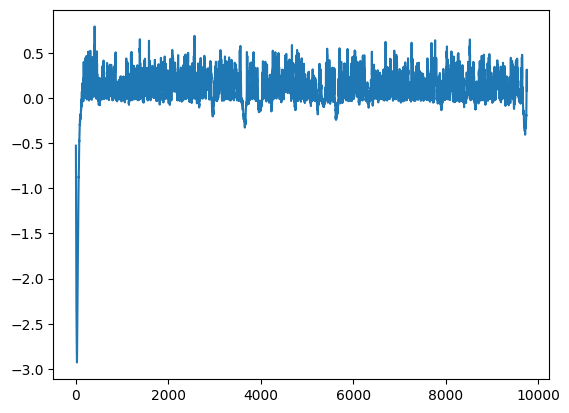

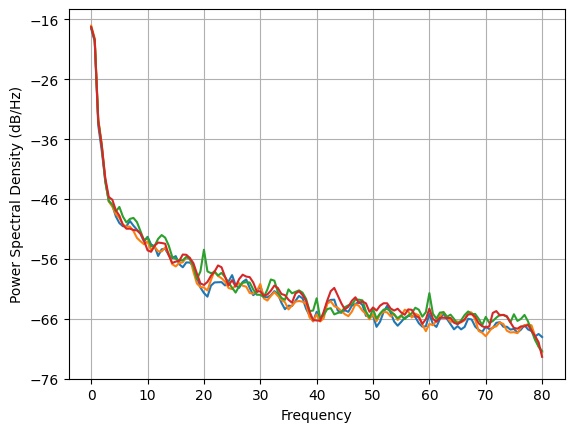

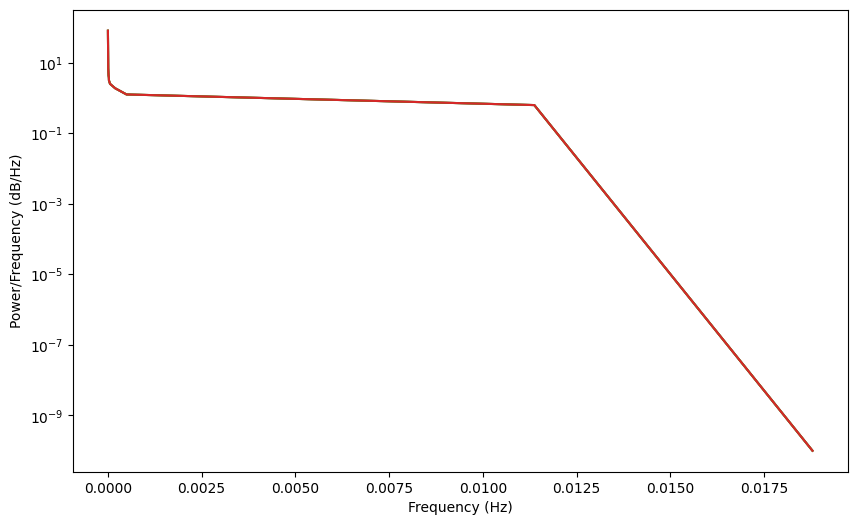

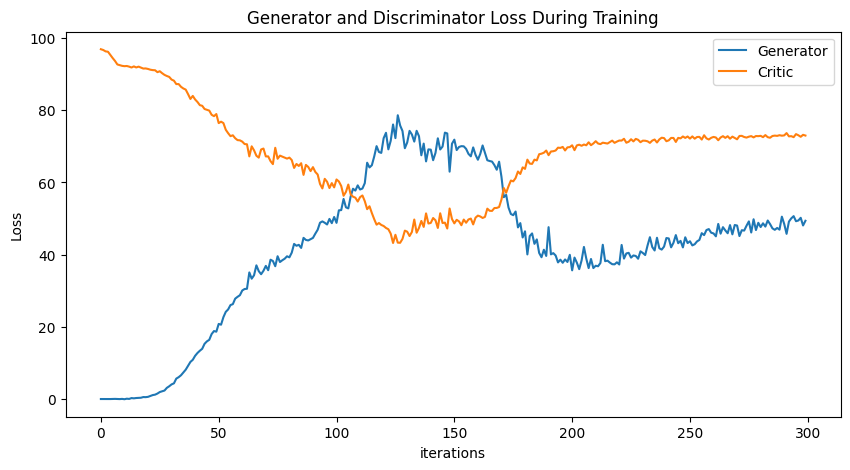

In [21]:
SPECTRAL_FACTOR = 10000
NUM_EPOCHS = 300
PRINT_INTERVAL = 10
BATCH_SIZE = np.shape(training_data_closed)[0]
train_loader = DataLoader(TensorDataset(torch.tensor(training_data_closed).detach()), batch_size=BATCH_SIZE, shuffle=True)

def spectral_loss(real_data, fake_data):
    fft_real = torch.fft.fft(real_data)
    fft_fake = torch.fft.fft(fake_data)
    magnitude_real = torch.sqrt(fft_real.real**2 + fft_real.imag**2)
    magnitude_fake = torch.sqrt(fft_fake.real**2 + fft_fake.imag**2)
    magnitude_real = normalize(magnitude_real, dim=0)
    magnitude_fake = normalize(magnitude_fake, dim=0)
    return F.mse_loss(magnitude_real, magnitude_fake)

def train():
    critic_err, gen_err, critic_psd_err = [], [], []
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=1e-5)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=1e-5)

    for epoch in range(NUM_EPOCHS):
        (real, ) = next(iter(train_loader))
        real.requires_grad = True

        for _ in range(5):
            fake = G(sample_normal_distribution(BATCH_SIZE, 200, 305))
            critic_real = D(real).reshape(-1)
            critic_fake = D(fake).reshape(-1)
            D.zero_grad()            
            loss_critic_psd = spectral_loss(real.detach(), fake.detach()) * SPECTRAL_FACTOR
            loss_critic = -torch.mean(critic_real) + torch.mean(critic_fake) + (gradient_penalty(D, real, fake) * LAMBDA_GP) + loss_critic_psd
            loss_critic.backward()
            critic_optimizer.step()  
            
        noise = sample_normal_distribution(BATCH_SIZE, 200, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())
        critic_psd_err.append(loss_critic_psd.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            print("Epoch %s: Critic PSD error (%s)" % (epoch, critic_psd_err))
            plot_everything(fake, critic_err, gen_err)

    return critic_err, gen_err, fake, D, G

critic_err, gen_err, generated_data_closed, disc, gen = train()

torch.save(gen, 'generator-v11-2.pt')
torch.save(disc, 'discriminator-v11-2.pt')
np.save('closed-v11-2.npy', generated_data_closed.detach())
plot_everything(generated_data_closed, gen_err, critic_err)
generated_data_closed = None